<a href="https://colab.research.google.com/github/humairarizqi/Final_Project/blob/main/Copy_of_Tim_26C_Python_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Introduction**

Pada kesempatan final project kali ini, tim kami memutuskan untuk memilih dataset 1 (satu) untuk menyelesaikan studi kasus marketplace Super App. dengan konteks sebagai berikut:

Sebuah perusahaan Super App terkemuka di Indonesia, yang mengoperasikan layanannya di seluruh provinsi, menghadapi tantangan kompleks dalam mengidentifikasi dan memahami tren serta pola penggunaan aplikasinya yang berbeda-beda di tiap
provinsi. Variasi ini muncul karena setiap provinsi memiliki karakteristik demografis dan ekonomi yang unik, yang mempengaruhi preferensi dan kebutuhan pengguna terhadap
produk yang ditawarkan. Dalam kapasitas sebagai seorang data scientist, diberi tugas untuk melakukan analisis data yang mendalam untuk mengurai dinamika regional yang kompleks. Tujuan akhir dari analisis ini adalah untuk memberikan wawasan yang dapat membantu perusahaan beroperasi lebih efektif dan efisien, serta menyusun strategi yang tepat guna menanggapi kebutuhan pasar yang dinamis dan beragam.

## Business Understanding

**Problem Statement** : Setiap provinsi memiliki preferensi kategori produk yang banyak ditransaksikan. Setiap provinsi juga memiliki tingkatan transaksi yang berbeda. Hal ini disebabkan banyak faktor, seperti tingkat UMR hingga ketersediaan sumber daya masing - masing provinsi. Hal ini mendorong kami untuk menganalisis perilaku transaksi tiap provinsi dan mencari tahu faktor yang mempengaruhi perilaku tersebut serta memberikan saran yang dapat dilakukan oleh perusahaan SuperApp dalam proses keberjalanan transaksi yang terjadi di setiap provinsi.





**Goals/ Business Objective :**

- Memahami retensi perilaku customer
- Segmentasi Customer melalui analisis geospasial
- Identifikasi Trend Penjualan
- Menganalisa insight dalam melihat performa bisnis
- Penyusunan business recommendation untuk mendapatkan engagement customer
- Meningkatkan traffic penjualan dan revenue

# Data Understanding

**DESCRIBE DATA**

* **user.csv**: Ini adalah kumpulan data yang
menyediakan informasi terperinci tentang pengguna, termasuk data demografis dan riwayat transaksi. Informasi ini sangat penting dalam memahami perilaku pengguna dan dapat digunakan untuk membuat model perilaku pengguna yang dapat membantu dalam pengambilan keputusan bisnis.


* **location_reference.cs**v: Kumpulan data ini menyediakan detail lokasi geografis yang penting untuk analisis regional. Dengan menggunakan data ini, kita dapat melakukan analisis geospasial untuk memahami pola dan tren regional, yang dapat memberikan wawasan berharga untuk strategi pemasaran dan penjualan berdasarkan wilayah


* **Trx folder**: Folder ini berisi catatan historis transaksi yang mendetail. Dengan menganalisis data ini, kita dapat memahami tren pembelian dan pengaruh promosi, yang dapat digunakan untuk merancang dan mengevaluasi strategi promosi yang efektif.


* **product_reference.csv**: Kumpulan data ini menawarkan gambaran lengkap tentang jajaran produk. Dengan menghubungkan data ini dengan preferensi regional, kita dapat memahami hubungan antara preferensi produk dan lokasi, yang dapat digunakan untuk merancang strategi penjualan dan pemasaran yang lebih efektif.

*  id trx = kode pembelian
*  user_id = kode unik customer
*  product_id = kode produk
*  gross_amount = total pendapatan/pemasukan kotor
*  discounts = potongan harga
*  transaction_date = waktu bertransaksi
*  full_name = nama customer
*  gender = jenis kelamin customer
*  money_spent = total uang yang dihabiskan customer
*  refund = pengembalian dana
*  wallet_balance = sisa uang customer yang tersimpan dalam saldo customer
*  join_date = waktu customer bergabung dengan app
*  birth = tanggal lahir customer
*  kode kecamatan = kode kecamatan transaksi app
*  nama provinsi = nama provinsi transaksi app
*  kode provinsi = kode provinsi transaksi app
*  nama kabupaten = nama kabupaten transaksi app
*  kode kabupaten = kode kabupaten transaksi app
*  nama kecamatan = nama kecamatan transaksi app

Dari fitur-fitur diatas dapat sangat berguna untuk analisis mendalam mengenai:
* trend konsumsi (memantau dan menganalisis tren konsumsi
secara real-time untuk memprediksi perubahan dalam permintaan yang dapat mempengaruhi manajemen stok dan inisiatif promosi),
* pemahaman pasar regional (menggali data untuk
mengidentifikasi faktor-faktor yang mempengaruhi keberhasilan produk tertentu di berbagai provinsi menggunakan pemetaan atau spasial effect termasuk memahami pengaruh faktor ekonomi, sosial, dan budaya),
* personalisasi pengalaman pengguna (mengembangkan model prediktif dan segmentasi yang canggih untuk mengelompokkan pengguna berdasarkan perilaku pembelian, preferensi produk, dengan tujuan untuk menyesuaikan tawaran dan komunikasi secara lebih efektif).

# Data Preprocessing

## Import Data

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy import stats
from math import sqrt
import plotly.express as px
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Import dataset yang akan digunakan
from google.colab import drive
drive.mount('/content/drive')

# Membaca data csv ke dalam DataFrame Pandas
df_dataset = pd.read_csv('/content/drive/MyDrive/Tim 26C Final Project Drive/dataset-1_new.csv')

# Menampilkan DataFrame
df_dataset.info()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2418907 entries, 0 to 2418906
Data columns (total 21 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id_trx            object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
 6   id                int64  
 7   product name      object 
 8   kode kecamatan    int64  
 9   nama provinsi     object 
 10  kode provinsi     int64  
 11  nama kabupaten    object 
 12  kode kabupaten    int64  
 13  nama kecamatan    object 
 14  full_name         object 
 15  gender            object 
 16  money_spent       float64
 17  refund            float64
 18  wallet_balance    float64
 19  join_date         object 
 20  birth             object 
dtypes: float64(5), int64(5), object(11)
memo

In [ ]:
df_dataset

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,id,product name,kode kecamatan,nama provinsi,...,nama kabupaten,kode kabupaten,nama kecamatan,full_name,gender,money_spent,refund,wallet_balance,join_date,birth
0,TRX679679,SC3304092002002,1,24500.0,NaN,2024-11-08,1,Man Fashion,330409,JAWA TENGAH,...,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,1690000.0,310000.0,710000.0,2023-11-26,1986-02-01
1,TRX679680,SC3304092002002,1,68800.0,NaN,2024-04-11,1,Man Fashion,330409,JAWA TENGAH,...,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,1690000.0,310000.0,710000.0,2023-11-26,1986-02-01
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,1,Man Fashion,330409,JAWA TENGAH,...,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,1690000.0,310000.0,710000.0,2023-11-26,1986-02-01
3,TRX679682,SC3304092002002,2,27100.0,NaN,2024-02-07,2,Woman Fashion,330409,JAWA TENGAH,...,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,1690000.0,310000.0,710000.0,2023-11-26,1986-02-01
4,TRX679683,SC3304092002002,2,78300.0,NaN,2024-03-12,2,Woman Fashion,330409,JAWA TENGAH,...,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,1690000.0,310000.0,710000.0,2023-11-26,1986-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,NaN,2024-01-05,10,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,...,KAPUAS,6203,MANTANGAI,KENNY,perempuan,0.0,0.0,0.0,2024-10-22,2005-06-09
2418903,TRX634419,SC6203092020002,10,2600.0,NaN,2024-07-09,10,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,...,KAPUAS,6203,MANTANGAI,KENNY,perempuan,0.0,0.0,0.0,2024-10-22,2005-06-09
2418904,TRX595914,SC6204012005001,6,12200.0,NaN,2024-06-18,6,Travel,620401,KALIMANTAN TENGAH,...,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,1430000.0,990000.0,1380000.0,2023-12-08,1993-12-09
2418905,TRX595915,SC6204012005001,6,1600.0,NaN,2024-04-04,6,Travel,620401,KALIMANTAN TENGAH,...,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,1430000.0,990000.0,1380000.0,2023-12-08,1993-12-09


In [ ]:
df_dataset.drop(['id', 'money_spent', 'refund', 'wallet_balance'], axis=1, inplace=True)

In [ ]:
df_dataset.rename(columns={'product name' : 'product_name',
                            'nama provinsi':'nama_provinsi',
                            'nama kecamatan' : 'nama_kecamatan',
                            'kode kecamatan' : 'kode_kecamatan',
                            'kode provinsi' : 'kode_provinsi',
                            'nama kabupaten' : 'nama_kabupaten',
                            'kode kabupaten' : 'kode_kabupaten',
                            }, inplace = True)
df_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2418907 entries, 0 to 2418906
Data columns (total 17 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id_trx            object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
 6   product_name      object 
 7   kode_kecamatan    int64  
 8   nama_provinsi     object 
 9   kode_provinsi     int64  
 10  nama_kabupaten    object 
 11  kode_kabupaten    int64  
 12  nama_kecamatan    object 
 13  full_name         object 
 14  gender            object 
 15  join_date         object 
 16  birth             object 
dtypes: float64(2), int64(4), object(11)
memory usage: 313.7+ MB


In [ ]:
#Melihat Jumlah Baris Per Provinsi
grouped_df = df_dataset.groupby('nama_provinsi').size()
print(grouped_df)

nama_provinsi
JAWA TENGAH           2103793
KALIMANTAN SELATAN     176455
KALIMANTAN TENGAH      134616
PAPUA SELATAN            4043
dtype: int64


In [ ]:
df_dataset.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth
0,TRX679679,SC3304092002002,1,24500.0,NaN,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
1,TRX679680,SC3304092002002,1,68800.0,NaN,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
3,TRX679682,SC3304092002002,2,27100.0,NaN,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
4,TRX679683,SC3304092002002,2,78300.0,NaN,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01


## Missing Value

Handling Missing Value

In [ ]:
# Melihat Missing Value
missing_values = df_dataset.isnull().sum()
print("Jumlah nilai yang hilang per kolom:")
print(missing_values)

# Menampilkan persentase nilai yang hilang per kolom
total_values = df_dataset.shape[0]
missing_percentage = (missing_values / total_values) * 100
print("\nPersentase nilai yang hilang per kolom:")
print(missing_percentage)

Jumlah nilai yang hilang per kolom:
id_trx                    0
user_id                   0
product_id                0
gross_amount          13831
discounts           1655859
transaction_date          0
product_name              0
kode_kecamatan            0
nama_provinsi             0
kode_provinsi             0
nama_kabupaten            0
kode_kabupaten            0
nama_kecamatan            0
full_name                 0
gender                    0
join_date                 0
birth                     0
dtype: int64

Persentase nilai yang hilang per kolom:
id_trx               0.000000
user_id              0.000000
product_id           0.000000
gross_amount         0.571787
discounts           68.454843
transaction_date     0.000000
product_name         0.000000
kode_kecamatan       0.000000
nama_provinsi        0.000000
kode_provinsi        0.000000
nama_kabupaten       0.000000
kode_kabupaten       0.000000
nama_kecamatan       0.000000
full_name            0.000000
gender        

Pilihan bijak kami dalam treatment handling missing value, karena yang terindikasi adalah fitur "Discount" dan "Gross amount" di isi NaN menjadi nol. karena pertimbangan bahwa itu adalah fitur yang berkaitan dengan uang. sehingga tidak ada ambiguitas dengan menganggap itu tidak terjadi transaksi atau pemberian discount

In [ ]:
# Mengisi nilai yang hilang dengan nilai 0
df_dataset['gross_amount'].fillna(0, inplace=True)
df_dataset['discounts'].fillna(0, inplace=True)

# Menampilkan dataset
df_dataset.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01


In [ ]:
# Melihat missing value
missing_values = df_dataset.isnull().sum()
print("Jumlah nilai yang hilang per kolom:")
print(missing_values)

# Menampilkan persentase nilai yang hilang per kolom
total_values = df_dataset.shape[0]
missing_percentage = (missing_values / total_values) * 100
print("\nPersentase nilai yang hilang per kolom:")
print(missing_percentage)

Jumlah nilai yang hilang per kolom:
id_trx              0
user_id             0
product_id          0
gross_amount        0
discounts           0
transaction_date    0
product_name        0
kode_kecamatan      0
nama_provinsi       0
kode_provinsi       0
nama_kabupaten      0
kode_kabupaten      0
nama_kecamatan      0
full_name           0
gender              0
join_date           0
birth               0
dtype: int64

Persentase nilai yang hilang per kolom:
id_trx              0.0
user_id             0.0
product_id          0.0
gross_amount        0.0
discounts           0.0
transaction_date    0.0
product_name        0.0
kode_kecamatan      0.0
nama_provinsi       0.0
kode_provinsi       0.0
nama_kabupaten      0.0
kode_kabupaten      0.0
nama_kecamatan      0.0
full_name           0.0
gender              0.0
join_date           0.0
birth               0.0
dtype: float64


In [ ]:
def missing_data(data):
    df_miss = pd.DataFrame(data.isnull().sum()).reset_index()
    df_miss.columns = ['column', 'count']
    df_miss = df_miss.loc[df_miss['count']!=0]
    df_miss['percent'] = round(df_miss['count']/data.shape[0]*100, 2)
    tipe_data = []
    contoh_data = []
    for kolom in list(df_miss['column']):
        tipe_data.append(data[kolom].dtype)
        contoh_data.append(data[kolom][100])
    df_miss['DataType'] = tipe_data
    df_miss['Example'] = contoh_data
    return df_miss

In [ ]:
missing_data(df_dataset)

,column,count,percent,DataType,Example


## Duplicate Data

In [ ]:
# Melihat duplicate dataframe
duplikat = df_dataset.duplicated()
duplikat

0          False
1          False
2          False
3          False
4          False
           ...  
2418902    False
2418903    False
2418904    False
2418905    False
2418906    False
Length: 2418907, dtype: bool

In [ ]:
# Untuk melihat baris mana saja yang terindikasi duplikat
duplikat = df_dataset[df_dataset.duplicated()]
duplikat

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth


Tidak ada data yang terindikasi duplikat

In [ ]:
df_dataset.duplicated().any()

False

## Inconsistent

In [ ]:
# Inconsistent data pada kolom id_trx

def check_consistency(column):
  pattern = re.compile(r'^TRX\d+$') # pola yang diawali dengan TRX diikuti sejumlah angka
  consistent = all(pattern.match(str(value)) for value in column)
  return consistent

# Mengecek konsistensi penulisan data
is_consistent = check_consistency(df_dataset['id_trx'])
if is_consistent:
  print('Semua nilai dalam kolom memiliki cara penulisan yang sama.')
else:
  print('Terdapat variasi pada cara penulisan dalam kolom.')

Semua nilai dalam kolom memiliki cara penulisan yang sama.


# EDA (Exploratory Data Analysis)

## Data yang Sudah Melalui Proses Cleaning

In [ ]:
df_dataset

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,0.0,2024-01-05,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,KAPUAS,6203,MANTANGAI,KENNY,perempuan,2024-10-22,2005-06-09
2418903,TRX634419,SC6203092020002,10,2600.0,0.0,2024-07-09,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,KAPUAS,6203,MANTANGAI,KENNY,perempuan,2024-10-22,2005-06-09
2418904,TRX595914,SC6204012005001,6,12200.0,0.0,2024-06-18,Travel,620401,KALIMANTAN TENGAH,62,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,2023-12-08,1993-12-09
2418905,TRX595915,SC6204012005001,6,1600.0,0.0,2024-04-04,Travel,620401,KALIMANTAN TENGAH,62,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,2023-12-08,1993-12-09


In [ ]:
df_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2418907 entries, 0 to 2418906
Data columns (total 17 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id_trx            object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
 6   product_name      object 
 7   kode_kecamatan    int64  
 8   nama_provinsi     object 
 9   kode_provinsi     int64  
 10  nama_kabupaten    object 
 11  kode_kabupaten    int64  
 12  nama_kecamatan    object 
 13  full_name         object 
 14  gender            object 
 15  join_date         object 
 16  birth             object 
dtypes: float64(2), int64(4), object(11)
memory usage: 313.7+ MB


## Statistical Five Summaries

In [ ]:
df_dataset.describe()

,product_id,gross_amount,discounts,kode_kecamatan,kode_provinsi,kode_kabupaten
count,2.418907e+06,2.418907e+06,2.418907e+06,2.418907e+06,2.418907e+06,2.418907e+06
mean,8.096465e+00,5.677610e+04,9.943020e+03,3.707067e+05,3.690263e+01,3.706976e+03
std,5.515350e+00,9.652759e+04,2.809153e+04,1.014157e+05,1.016086e+01,1.014171e+03
min,1.000000e+00,-1.000000e+02,-1.000000e+02,3.301010e+05,3.300000e+01,3.301000e+03
25%,3.000000e+00,6.400000e+03,0.000000e+00,3.308100e+05,3.300000e+01,3.308000e+03
50%,7.000000e+00,2.100000e+04,0.000000e+00,3.318100e+05,3.300000e+01,3.318000e+03
75%,1.400000e+01,6.440000e+04,7.100000e+03,3.327110e+05,3.300000e+01,3.327000e+03
max,1.800000e+01,2.622800e+06,1.571300e+06,9.303050e+05,9.300000e+01,9.303000e+03


In [ ]:
from scipy import stats

modus_id = stats.mode(df_dataset['product_id'])
print("Jenis produk yang paling banyak dibeli :", modus_id.mode.item())

modus_provinsi = stats.mode(df_dataset['kode_provinsi'])
print("Provinsi dengan transaksi terbanyak :", modus_provinsi.mode.item())

Jenis produk yang paling banyak dibeli : 3
Provinsi dengan transaksi terbanyak : 33


Dari hasil di atas, dapat diambil beberapa informasi yaitu :

1. Jenis produk yang banyak dibeli adalah produk dengan kode 3, yaitu Food & Drink
2. Provinsi dengan jumlah transaksi terbanyak adalah provinsi dengan kode 33, yaitu provinsi Jawa Tengah
3. Rata - rata (mean) diskon dari tiap transaksi sebesar 9943.020

## Boxplot

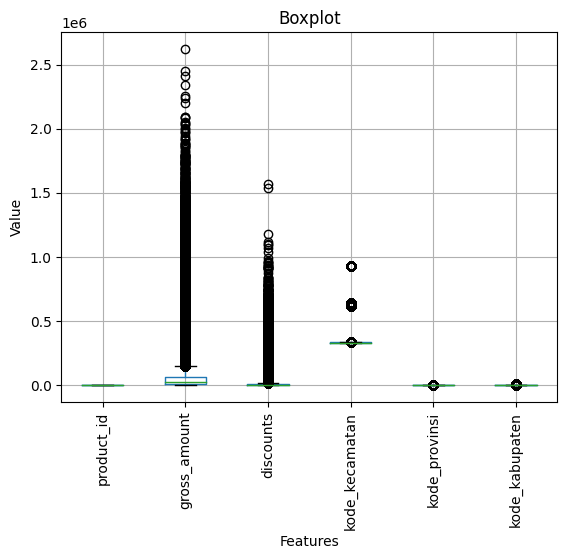

In [ ]:
# import libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Menampilkan boxplot
df_dataset.boxplot()
plt.title('Boxplot')
plt.xlabel('Features')
plt.ylabel('Value')
plt.xticks(rotation = 90)
plt.show()

Variable gross_amount dan discounts terindikasi banyak terindikasi outliers, namun dalam konteks bisnis. outliers bisa saja terjadi karena adanya perbadaan daya beli dari setiap customer.

## Heatmap

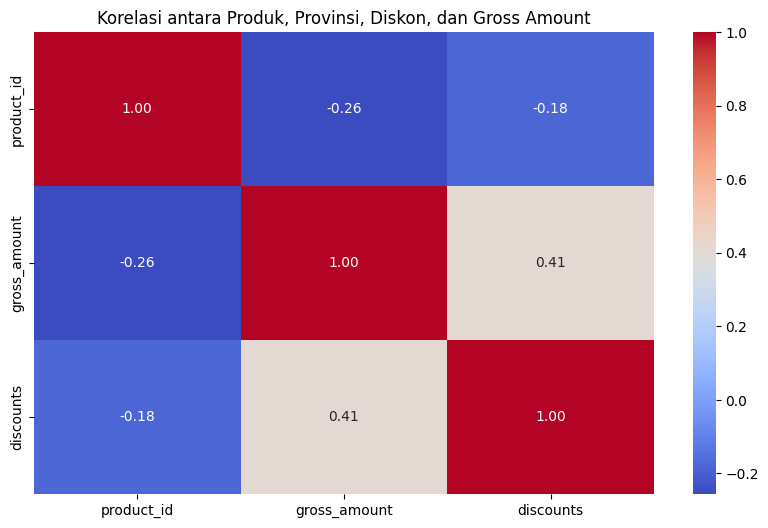

In [ ]:
df = df_dataset[['product_id', 'gross_amount', 'discounts']]
plt.figure(figsize = (10,6))
corr = df.corr()
sns.heatmap(corr, annot = True, cmap = 'coolwarm', fmt = ".2f")
plt.title('Korelasi antara Produk, Provinsi, Diskon, dan Gross Amount')
plt.show()

## Melihat Skewness Tiap Fitur

In [ ]:
skew_df = pd.DataFrame(df_dataset.select_dtypes(np.number).columns, columns=['Feature'])
skew_df['Skew'] = skew_df['Feature'].apply(lambda feature: stats.skew(df_dataset[feature]))
skew_df['Absolute Skew'] = skew_df['Skew'].apply(abs)
skew_df['Skewed'] = skew_df['Absolute Skew'].apply(lambda x: True if x >= 0.5 else False)
skew_df

,Feature,Skew,Absolute Skew,Skewed
0,product_id,0.324842,0.324842,False
1,gross_amount,4.286640,4.286640,True
2,discounts,6.906065,6.906065,True
3,kode_kecamatan,2.305620,2.305620,True
4,kode_provinsi,2.306609,2.306609,True
5,kode_kabupaten,2.305616,2.305616,True


## Melihat Distribusi Data Tiap Fitur

In [ ]:
df_1 = df_dataset.select_dtypes(include = ['float64', 'int64'])

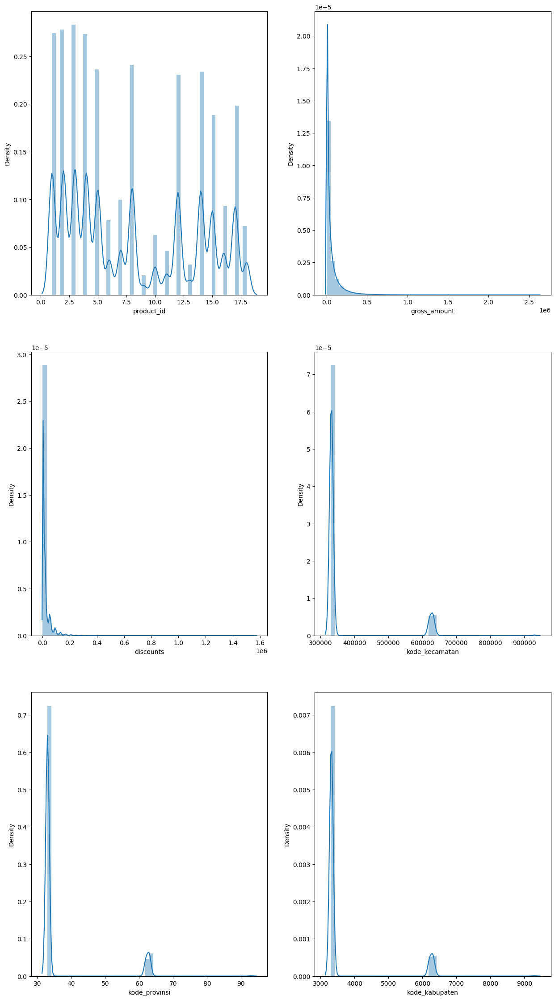

In [ ]:
fig,axes = plt.subplots(nrows = 3, ncols = 2, figsize = (15,28))
for ax, col in list(zip(axes.flat, df_1)):
    sns.distplot(df_1[col], ax = ax)

##Jumlah Produk yang Tiap Kategori

In [ ]:
produk = df_dataset.groupby(['product_name']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_produk = produk.reset_index(name = 'jumlah')

# Menampilkan DataFrame yang telah dikelompokkan
df_produk

,product_name,jumlah
0,Elektronik,198141
1,Food & Drink,232940
2,Hotel,163058
3,Investasi,155005
4,Keperluan Anak,82111
5,Keperluan Rumah Tangga,194213
6,Kesehatan,192346
7,Man Fashion,225376
8,Other,16861
9,Otomotif,189625


##Jumlah Transaksi Tiap Kabupaten

In [ ]:
daerah = df_dataset.groupby(['nama_provinsi', 'nama_kabupaten']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_daerah = daerah.reset_index(name = 'Transaction_Count')

# Menampilkan DataFrame yang telah dikelompokkan
df_daerah

,nama_provinsi,nama_kabupaten,Transaction_Count
0,JAWA TENGAH,BANJARNEGARA,69686
1,JAWA TENGAH,BANYUMAS,94026
2,JAWA TENGAH,BATANG,29466
3,JAWA TENGAH,BLORA,62955
4,JAWA TENGAH,BOYOLALI,60762
...,...,...,...
60,KALIMANTAN TENGAH,SERUYAN,7688
61,KALIMANTAN TENGAH,SUKAMARA,4705
62,PAPUA SELATAN,BOVEN DIGOEL,245
63,PAPUA SELATAN,MAPPI,110


# Feature Engineering

## Menambahkan Fitur Pengeluaran Bersih

In [ ]:
# Total Spending (Pengeluaran Bersih)
df_dataset['pengeluaran_bersih'] = df_dataset['gross_amount'] - df_dataset['discounts']

In [ ]:
total_spent_per_user = df_dataset.groupby('user_id')['pengeluaran_bersih'].sum().reset_index()
total_spent_per_user

,user_id,pengeluaran_bersih
0,SC3301012001002,1570700.0
1,SC3301012001003,1603400.0
2,SC3301012001004,1673600.0
3,SC3301012001005,1457400.0
4,SC3301012001006,1721100.0
...,...,...
78522,SC9302032009001,960000.0
78523,SC9303052006001,2210000.0
78524,SC9303052013001,1090400.0
78525,SC9303052013002,1196400.0


In [ ]:
df_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2418907 entries, 0 to 2418906
Data columns (total 18 columns):
 #   Column              Dtype  
---  ------              -----  
 0   id_trx              object 
 1   user_id             object 
 2   product_id          int64  
 3   gross_amount        float64
 4   discounts           float64
 5   transaction_date    object 
 6   product_name        object 
 7   kode_kecamatan      int64  
 8   nama_provinsi       object 
 9   kode_provinsi       int64  
 10  nama_kabupaten      object 
 11  kode_kabupaten      int64  
 12  nama_kecamatan      object 
 13  full_name           object 
 14  gender              object 
 15  join_date           object 
 16  birth               object 
 17  pengeluaran_bersih  float64
dtypes: float64(3), int64(4), object(11)
memory usage: 332.2+ MB


## Menambahkan Fitur Umur

In [ ]:
from datetime import date

# Pastikan kolom birth dalam format datetime
df_dataset['birth'] = pd.to_datetime(df_dataset['birth'], format='%Y-%m-%d')

# Tentukan tanggal saat ini
today = pd.Timestamp(date.today())

# Hitung umur
df_dataset['age'] = today.year - df_dataset['birth'].dt.year - (((df_dataset['birth'].dt.day > today.day) & (df_dataset['birth'].dt.month == today.month)) | (df_dataset['birth'].dt.month>today.month))

# Menampilkan Data Frame
df_dataset

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth,pengeluaran_bersih,age
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,24500.0,38
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,68800.0,38
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,0.0,38
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,27100.0,38
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,78300.0,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,0.0,2024-01-05,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,KAPUAS,6203,MANTANGAI,KENNY,perempuan,2024-10-22,2005-06-09,1100.0,18
2418903,TRX634419,SC6203092020002,10,2600.0,0.0,2024-07-09,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,KAPUAS,6203,MANTANGAI,KENNY,perempuan,2024-10-22,2005-06-09,2600.0,18
2418904,TRX595914,SC6204012005001,6,12200.0,0.0,2024-06-18,Travel,620401,KALIMANTAN TENGAH,62,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,2023-12-08,1993-12-09,12200.0,30
2418905,TRX595915,SC6204012005001,6,1600.0,0.0,2024-04-04,Travel,620401,KALIMANTAN TENGAH,62,BARITO SELATAN,6204,JENAMAS,ILHAM SUPRATIKNO S.H.,laki-laki,2023-12-08,1993-12-09,1600.0,30


## Encoding Gender

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Inisialisasi LabelEncoder
le = LabelEncoder()

# Terapkan LabelEncoder ke kolom 'gender'
df_dataset['gender_encoded'] = le.fit_transform(df_dataset['gender'])

df_dataset.head(20)

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,nama_kabupaten,kode_kabupaten,nama_kecamatan,full_name,gender,join_date,birth,pengeluaran_bersih,age,gender_encoded
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,24500.0,38,1
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,68800.0,38,1
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,0.0,38,1
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,27100.0,38,1
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,78300.0,38,1
5,TRX679684,SC3304092002002,2,93400.0,51200.0,2024-05-30,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,42200.0,38,1
6,TRX679685,SC3304092002002,2,51200.0,28800.0,2024-09-10,Woman Fashion,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,22400.0,38,1
7,TRX679686,SC3304092002002,3,37000.0,0.0,2024-04-30,Food & Drink,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,37000.0,38,1
8,TRX679687,SC3304092002002,3,18000.0,0.0,2024-04-25,Food & Drink,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,18000.0,38,1
9,TRX679688,SC3304092002002,3,8100.0,8100.0,2024-05-27,Food & Drink,330409,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU,TUTIK,perempuan,2023-11-26,1986-02-01,0.0,38,1


## Extract Datetime

In [ ]:
# Code extract datetime
df_dataset['Dates'] = pd.to_datetime(df_dataset['transaction_date']).dt.date

# Code for convert to datetime in new features od date
df_dataset['Dates'] = df_dataset['Dates'].astype('datetime64[ns]')

# Code for datetime in a way create a new columns breaking down datetime in day, month, year
df_dataset['day'] = df_dataset['Dates'].dt.day_name()
df_dataset['month'] = df_dataset['Dates'].dt.month_name()
df_dataset['year'] = df_dataset['Dates'].dt.year

In [ ]:
df_dataset.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,gender,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,...,perempuan,2023-11-26,1986-02-01,24500.0,38,1,2024-11-08,Friday,November,2024
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,...,perempuan,2023-11-26,1986-02-01,68800.0,38,1,2024-04-11,Thursday,April,2024
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,...,perempuan,2023-11-26,1986-02-01,0.0,38,1,2024-07-01,Monday,July,2024
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,...,perempuan,2023-11-26,1986-02-01,27100.0,38,1,2024-02-07,Wednesday,February,2024
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,...,perempuan,2023-11-26,1986-02-01,78300.0,38,1,2024-03-12,Tuesday,March,2024


## Burn Rate

In [ ]:
# Hitung burn rate sebagai persentase dengan pengecekan zero division
def calculate_burn_rate_percentage(gross_amount, discounts):
    if gross_amount == 0:
        return 0  # atau bisa juga None atau nilai lain yang diinginkan
    return (discounts / gross_amount) * 100

# Menerapkan fungsi ke setiap baris dalam DataFrame
df_dataset['burn_rate'] = df_dataset.apply(
    lambda row: calculate_burn_rate_percentage(row['gross_amount'], row['discounts']), axis=1)

# Menampilkan dataframe
df_dataset

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
0,TRX679679,SC3304092002002,1,24500.0,0.0,2024-11-08,Man Fashion,330409,JAWA TENGAH,33,...,2023-11-26,1986-02-01,24500.0,38,1,2024-11-08,Friday,November,2024,0.0
1,TRX679680,SC3304092002002,1,68800.0,0.0,2024-04-11,Man Fashion,330409,JAWA TENGAH,33,...,2023-11-26,1986-02-01,68800.0,38,1,2024-04-11,Thursday,April,2024,0.0
2,TRX679681,SC3304092002002,1,26700.0,26700.0,2024-07-01,Man Fashion,330409,JAWA TENGAH,33,...,2023-11-26,1986-02-01,0.0,38,1,2024-07-01,Monday,July,2024,100.0
3,TRX679682,SC3304092002002,2,27100.0,0.0,2024-02-07,Woman Fashion,330409,JAWA TENGAH,33,...,2023-11-26,1986-02-01,27100.0,38,1,2024-02-07,Wednesday,February,2024,0.0
4,TRX679683,SC3304092002002,2,78300.0,0.0,2024-03-12,Woman Fashion,330409,JAWA TENGAH,33,...,2023-11-26,1986-02-01,78300.0,38,1,2024-03-12,Tuesday,March,2024,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,0.0,2024-01-05,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,2024-10-22,2005-06-09,1100.0,18,1,2024-01-05,Friday,January,2024,0.0
2418903,TRX634419,SC6203092020002,10,2600.0,0.0,2024-07-09,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,2024-10-22,2005-06-09,2600.0,18,1,2024-07-09,Tuesday,July,2024,0.0
2418904,TRX595914,SC6204012005001,6,12200.0,0.0,2024-06-18,Travel,620401,KALIMANTAN TENGAH,62,...,2023-12-08,1993-12-09,12200.0,30,0,2024-06-18,Tuesday,June,2024,0.0
2418905,TRX595915,SC6204012005001,6,1600.0,0.0,2024-04-04,Travel,620401,KALIMANTAN TENGAH,62,...,2023-12-08,1993-12-09,1600.0,30,0,2024-04-04,Thursday,April,2024,0.0


Semakin besar nilai burn_rate, maka semakin tidak ideal diskon yang diberikan.

In [ ]:
df_dataset.columns

Index(['id_trx', 'user_id', 'product_id', 'gross_amount', 'discounts',
       'transaction_date', 'product_name', 'kode_kecamatan', 'nama_provinsi',
       'kode_provinsi', 'nama_kabupaten', 'kode_kabupaten', 'nama_kecamatan',
       'full_name', 'gender', 'join_date', 'birth', 'pengeluaran_bersih',
       'age', 'gender_encoded', 'Dates', 'day', 'month', 'year', 'burn_rate'],
      dtype='object')

# Feature Selection

## Heatmap Correlation

<Axes: >

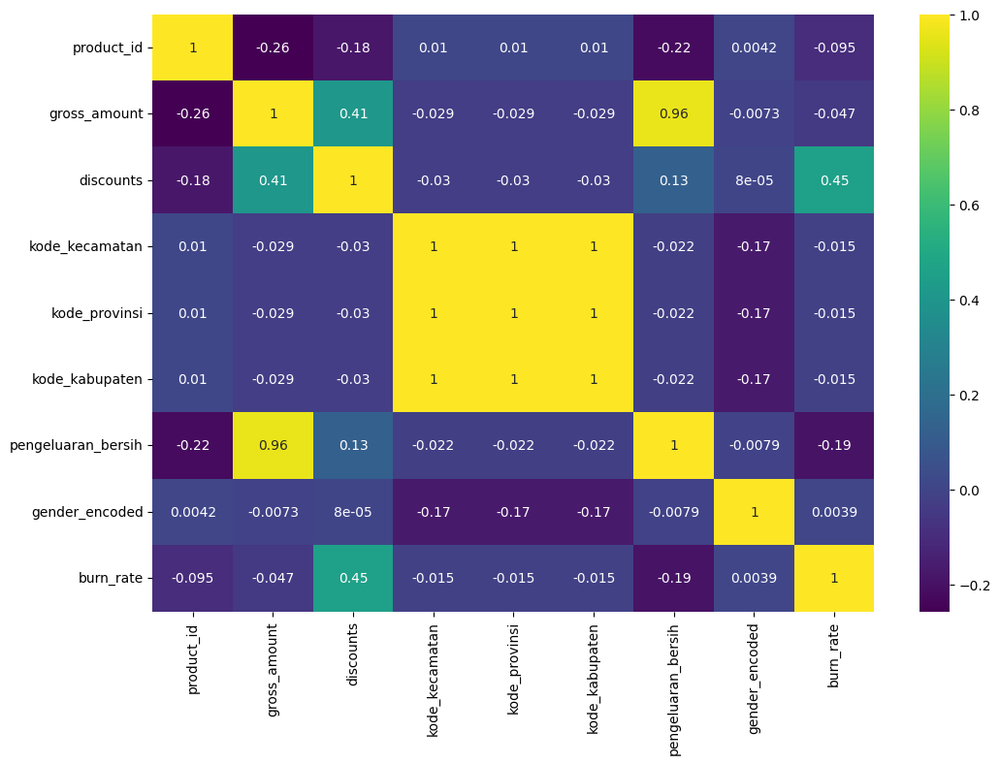

In [ ]:
df_heatmap= df_dataset.select_dtypes(include = ['float64', 'int64'])
k = len(df_heatmap.columns)
cm = df_heatmap.corr()
plt.figure(figsize = (12, 8))
sns.heatmap(cm, annot = True, cmap = 'viridis')

Berdasarkan heatmap, terdapat variabel yang memang tergolong cukup menonjol yakni:


* pengeluaran_bersih vs gross_amount : 0.96
* gross_amount vs product_id : -0.26
* pengeluaran_bersih vs product_id : -0.22
* discounts vs burn_rate : 0.45
* gross_amount vs discounts : 0.41



In [ ]:
num = df_dataset.select_dtypes(include = np.number)
numcorr = num.corr()

Menampilkan korelasi fitur-fitur terhadap "money_spent"

In [ ]:
Num = numcorr['gross_amount'].sort_values(ascending = False).to_frame()
cm = sns.light_palette("lightgreen", as_cmap = True)
korelasi = Num.style.background_gradient(cmap = cm)
korelasi

,gross_amount
gross_amount,1.000000
pengeluaran_bersih,0.957413
discounts,0.406549
age,0.000263
gender_encoded,-0.007283
kode_provinsi,-0.029066
kode_kabupaten,-0.029170
kode_kecamatan,-0.029170
burn_rate,-0.046590
product_id,-0.256292


## VIF (Variance Inflation Factors)

In [ ]:
# Variabel yang ingin diperiksa VIF-nya (fitur-fitur numerik)
numeric_features = ['pengeluaran_bersih','discounts','gross_amount', 'burn_rate']  # Ganti dengan fitur-fitur yang relevan

# Buat DataFrame baru hanya dengan fitur-fitur numerik
numeric_df = df_dataset[numeric_features]

In [ ]:
df_heatmap.columns

Index(['product_id', 'gross_amount', 'discounts', 'kode_kecamatan',
       'kode_provinsi', 'kode_kabupaten', 'pengeluaran_bersih',
       'gender_encoded', 'burn_rate'],
      dtype='object')

In [ ]:
df_heatmap.var()

product_id            3.041909e+01
gross_amount          9.317576e+09
discounts             7.891339e+08
kode_kecamatan        1.028514e+10
kode_provinsi         1.032430e+02
kode_kabupaten        1.028542e+06
pengeluaran_bersih    7.901905e+09
gender_encoded        1.765930e-01
burn_rate             1.265114e+03
dtype: float64

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Hitung VIF dan Toleransi
vif_data = pd.DataFrame()
vif_data["Features"] = df_heatmap.columns
vif_data["VIF"] = [variance_inflation_factor(df_heatmap.values, i) for i in range(len(df_heatmap.columns))]
vif_data["Tolerance"] = 1 / vif_data["VIF"]

vif_data

,Features,VIF,Tolerance
0,product_id,3.132112e+00,3.192734e-01
1,gross_amount,inf,0.000000e+00
2,discounts,inf,0.000000e+00
3,kode_kecamatan,3.691533e+09,2.708902e-10
4,kode_provinsi,5.260650e+04,1.900906e-05
5,kode_kabupaten,3.689883e+09,2.710113e-10
6,pengeluaran_bersih,inf,0.000000e+00
7,gender_encoded,3.738055e+00,2.675188e-01
8,burn_rate,1.794824e+00,5.571578e-01


In [ ]:
def format_decimal(value):
    if isinstance(value, (int, float)):
        return f"{value:.2f}"
    else:
        return value

vif_data = vif_data.applymap(format_decimal)

In [ ]:
vif_data

,Features,VIF,Tolerance
0,product_id,3.13,0.32
1,gross_amount,inf,0.00
2,discounts,inf,0.00
3,kode_kecamatan,3691532595.48,0.00
4,kode_provinsi,52606.50,0.00
5,kode_kabupaten,3689882708.30,0.00
6,pengeluaran_bersih,inf,0.00
7,gender_encoded,3.74,0.27
8,burn_rate,1.79,0.56


# KPI

In [ ]:
# AOV dari transaksi data
total_income = df_dataset['pengeluaran_bersih'].sum()
total_transaction = df_dataset['id_trx'].nunique()

aov = total_income / total_transaction
print("Average Order Value (AOV):", aov)

Average Order Value (AOV): 48638.88247010327


Menunjukkan rata-rata nilai transaksi bersih per transaksi unik, yang dalam kasus ini adalah Rp4,638,827.40.

In [ ]:
# Order Frequency
total_orders = len(df_dataset)
total_customers = df_dataset['user_id'].nunique()

order_frequency = total_orders / total_customers
print("Order Frequency:", order_frequency)

Order Frequency: 30.803507074000027


rata rata order frequency transaksi customer di angka 30 kali

In [ ]:
# Average Selling Price
total_income = df_dataset['pengeluaran_bersih'].sum()
unit_terjual = df_dataset['id_trx'].count()

asp = total_income / unit_terjual
print("Average Selling Price (ASP):", asp)

Average Selling Price (ASP): 46833.08196635918


Menunjukkan rata-rata pengeluaran bersih per transaksi, yang dalam kasus ini adalah Rp46,833.08

In [ ]:
# Average Transaction Unit (ATU)
unit_terjual = df_dataset['id_trx'].count()
total_transaction = df_dataset['id_trx'].nunique()

atu = unit_terjual/total_transaction
print("Average Transaction Unit (ATU):", atu)

Average Transaction Unit (ATU): 1.0385582248258018


Menunjukkan rata-rata jumlah transaksi per item unik, yang dalam kasus ini adalah 1.04

# Baseline Model

Dataset yang akan siap sedia untuk dimodelling, disini ide kami akan melakukan clustering berdasarkan tiap provinsi. Tim kami mendapatkan wilayah Provinsi Jawa tengah, Kalimantan Tengah, Kalimantan Selatan, dan Papua Selatan. Dengan alasan pertimbangan adalah pastilah tiap provinsi memeiliki karakteristik customer yang berbeda dengan provinsi lainnya sehingga akan mengkategorikannya sesuai dengan business rekomendasi sesuai dengan kondisi regionalnya.

## KMeans Clustering

Alasan pemilihan model KMeans Clustering, yaitu:
* Keseimbangan akurasi dengan dataset yang cukup besar
* Metodenya memiliki efisiensi komputasi yang baik ketika data besar
* skalabilitas yang baik
* Interpretasi hasil yang mudah



In [ ]:
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

Dikarenakan jumlah row yang berbeda tiap provinsi, kami melakukan Random Sampling menyesuaikan dengan jumlah baris terendah kedua menjadi 134616.

## Jawa Tengah

In [ ]:
data_jateng = df_dataset.loc[df_dataset["kode_provinsi"] == 33]

In [ ]:
sample_jateng = data_jateng.sample(n = 134616, random_state = 42)
sample_jateng

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
765349,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,2023-10-02,1976-10-23,11900.0,47,0,2024-06-06,Thursday,June,2024,0.000000
1622786,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,2023-10-25,1994-02-07,71200.0,30,1,2024-12-24,Tuesday,December,2024,25.833333
290552,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,2023-11-06,1992-02-08,121700.0,32,1,2024-11-20,Wednesday,November,2024,0.000000
2387203,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,2023-12-29,1992-12-13,0.0,31,1,2024-12-23,Monday,December,2024,100.000000
259391,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,2023-10-15,1991-10-09,9800.0,32,1,2024-10-06,Sunday,October,2024,27.407407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1037204,TRX1747994,SC3373041001007,3,95900.0,43500.0,2024-04-09,Food & Drink,337304,JAWA TENGAH,33,...,2023-11-30,1975-11-14,52400.0,48,0,2024-04-09,Tuesday,April,2024,45.359750
2345782,TRX952654,SC3309192005004,4,37700.0,0.0,2024-03-21,Ride Hailing,330919,JAWA TENGAH,33,...,2023-12-20,1999-06-21,37700.0,24,1,2024-03-21,Thursday,March,2024,0.000000
1345148,TRX2063810,SC3318192006002,1,41600.0,40000.0,2024-06-13,Man Fashion,331819,JAWA TENGAH,33,...,2023-12-31,2003-04-04,1600.0,21,1,2024-06-13,Thursday,June,2024,96.153846
331777,TRX1023139,SC3329162003020,1,26700.0,0.0,2024-04-27,Man Fashion,332916,JAWA TENGAH,33,...,2023-11-26,1994-09-05,26700.0,29,1,2024-04-27,Saturday,April,2024,0.000000


In [ ]:
df1 = sample_jateng[["age", "product_id", "gender_encoded", "pengeluaran_bersih", "burn_rate"]]

In [ ]:
inertia = []
for i in range(1, 9):
    model = KMeans(n_clusters = i, random_state = 42)
    model.fit(df1)
    inertia.append(model.inertia_)
inertia

[1091044560814468.4,
 406026973064188.1,
 208286355714097.4,
 126989641057542.66,
 85047924540255.31,
 60469644195675.1,
 45060359689124.484,
 35324452038714.945]

In [ ]:
inertia_df1 = pd.DataFrame({'Inertia':inertia}, index = [i for i in range(1, 9)])
inertia_df1

,Inertia
1,1.091045e+15
2,4.060270e+14
3,2.082864e+14
4,1.269896e+14
5,8.504792e+13
6,6.046964e+13
7,4.506036e+13
8,3.532445e+13


Text(0.5, 1.0, 'Elbow Method')

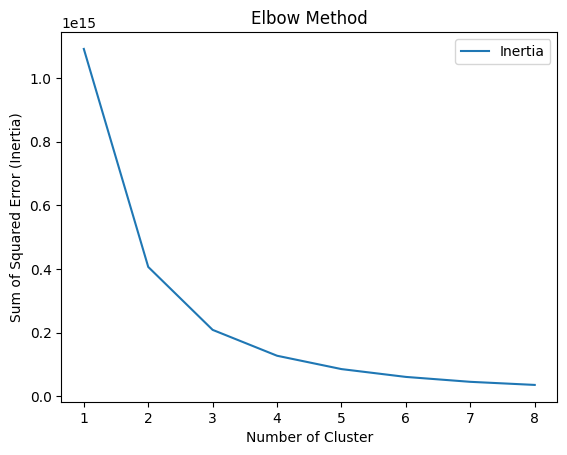

In [ ]:
inertia_df1.plot(kind = 'line')
plt.ylabel('Sum of Squared Error (Inertia)')
plt.xlabel('Number of Cluster')
plt.title('Elbow Method')

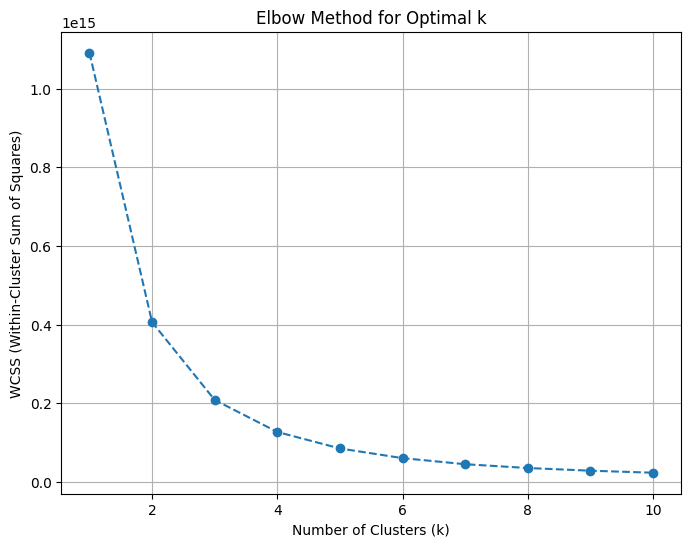

In [ ]:
wcss = []

# Try different values of k (number of clusters)
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans.fit(df1)
    # Calculate the WCSS (inertia) for each k
    wcss.append(kmeans.inertia_)

# Plot the Elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()

Berdasarkan hasil elbow method kami memilih untuk mengambil jumlah 2 kluster karena itu pilihan bijak jumlah cluster yang optimal

In [ ]:
modelKM = KMeans(n_clusters = 2 ,random_state = 42)
modelKM.fit(df1)

KMeans(n_clusters=2, random_state=42)

In [ ]:
modelKM.predict(df1)

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [ ]:
sample_jateng['Cluster_KM'] = modelKM.predict(df1)
sample_jateng

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM
765349,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,1976-10-23,11900.0,47,0,2024-06-06,Thursday,June,2024,0.000000,0
1622786,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,1994-02-07,71200.0,30,1,2024-12-24,Tuesday,December,2024,25.833333,0
290552,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,1992-02-08,121700.0,32,1,2024-11-20,Wednesday,November,2024,0.000000,0
2387203,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,1992-12-13,0.0,31,1,2024-12-23,Monday,December,2024,100.000000,0
259391,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,1991-10-09,9800.0,32,1,2024-10-06,Sunday,October,2024,27.407407,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1037204,TRX1747994,SC3373041001007,3,95900.0,43500.0,2024-04-09,Food & Drink,337304,JAWA TENGAH,33,...,1975-11-14,52400.0,48,0,2024-04-09,Tuesday,April,2024,45.359750,0
2345782,TRX952654,SC3309192005004,4,37700.0,0.0,2024-03-21,Ride Hailing,330919,JAWA TENGAH,33,...,1999-06-21,37700.0,24,1,2024-03-21,Thursday,March,2024,0.000000,0
1345148,TRX2063810,SC3318192006002,1,41600.0,40000.0,2024-06-13,Man Fashion,331819,JAWA TENGAH,33,...,2003-04-04,1600.0,21,1,2024-06-13,Thursday,June,2024,96.153846,0
331777,TRX1023139,SC3329162003020,1,26700.0,0.0,2024-04-27,Man Fashion,332916,JAWA TENGAH,33,...,1994-09-05,26700.0,29,1,2024-04-27,Saturday,April,2024,0.000000,0


In [ ]:
df1['Cluster_KM'] = modelKM.predict(df1)
df1

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
765349,47,18,0,11900.0,0.000000,0
1622786,30,14,1,71200.0,25.833333,0
290552,32,2,1,121700.0,0.000000,0
2387203,31,14,1,0.0,100.000000,0
259391,32,15,1,9800.0,27.407407,0
...,...,...,...,...,...,...
1037204,48,3,0,52400.0,45.359750,0
2345782,24,4,1,37700.0,0.000000,0
1345148,21,1,1,1600.0,96.153846,0
331777,29,1,1,26700.0,0.000000,0


In [ ]:
sample_jateng['Cluster_KM'].value_counts()

Cluster_KM
0    124805
1      9811
Name: count, dtype: int64

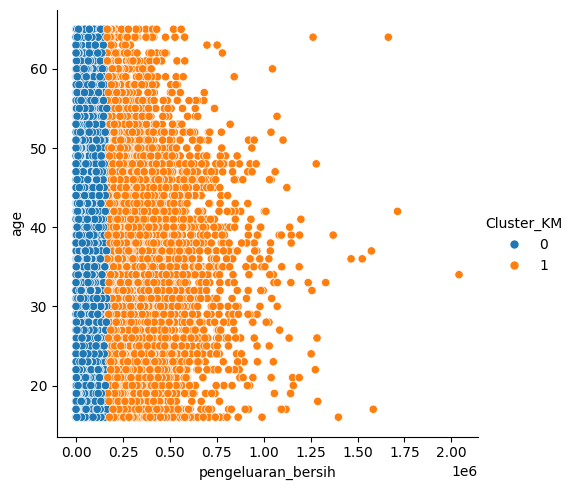

In [ ]:
sns.relplot(x = 'pengeluaran_bersih', y = 'age', data = sample_jateng, hue = 'Cluster_KM', palette = 'tab10')

dari interpretasi ini, kemampuan rate daya beli masyarakat di Jawa tengah terbagi dalam golongan Tinggi (High level) dan (low level). dalam kasus ini

* cluster 0 adalah : rendah (low level)
* cluster 1 adalah : tinggi (high level)


In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah',1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
sample_jateng['Kategori'] = sample_jateng['Cluster_KM'].replace(label_dict)
sample_jateng

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
765349,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,11900.0,47,0,2024-06-06,Thursday,June,2024,0.000000,0,rendah
1622786,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,71200.0,30,1,2024-12-24,Tuesday,December,2024,25.833333,0,rendah
290552,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,121700.0,32,1,2024-11-20,Wednesday,November,2024,0.000000,0,rendah
2387203,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,0.0,31,1,2024-12-23,Monday,December,2024,100.000000,0,rendah
259391,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,9800.0,32,1,2024-10-06,Sunday,October,2024,27.407407,0,rendah
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1037204,TRX1747994,SC3373041001007,3,95900.0,43500.0,2024-04-09,Food & Drink,337304,JAWA TENGAH,33,...,52400.0,48,0,2024-04-09,Tuesday,April,2024,45.359750,0,rendah
2345782,TRX952654,SC3309192005004,4,37700.0,0.0,2024-03-21,Ride Hailing,330919,JAWA TENGAH,33,...,37700.0,24,1,2024-03-21,Thursday,March,2024,0.000000,0,rendah
1345148,TRX2063810,SC3318192006002,1,41600.0,40000.0,2024-06-13,Man Fashion,331819,JAWA TENGAH,33,...,1600.0,21,1,2024-06-13,Thursday,June,2024,96.153846,0,rendah
331777,TRX1023139,SC3329162003020,1,26700.0,0.0,2024-04-27,Man Fashion,332916,JAWA TENGAH,33,...,26700.0,29,1,2024-04-27,Saturday,April,2024,0.000000,0,rendah


### Metric Evaluation

In [ ]:
# Menggunakan silhouette score untuk mengevaluasi hasil klaster
silhouette_avg = silhouette_score(df1, sample_jateng['Cluster_KM'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.8218535809506261


In [ ]:
# Menggunakan davies bouldin score untuk mengevaluasi hasil klaster
dbi_avg = davies_bouldin_score(df1, sample_jateng['Cluster_KM'])
print(f"Davies Bouldin Score: {dbi_avg}")

Davies Bouldin Score: 0.49857303861427715


In [ ]:
# Menggunakan calinski harabasz score untuk mengevaluasi hasil klaster
calinski_avg = calinski_harabasz_score(df1, sample_jateng['Cluster_KM'])
print(f"Calinski Harabasz Score: {calinski_avg}")

Calinski Harabasz Score: 227110.68858630804


Berdasarkan apa yang dilihat dari metric evaluation, interpretasi

* Skor Siluet: Nilai skor siluet yang kami peroleh adalah **0.8213855908659261**
, yang menunjukkan bahwa kluster yang dibuat oleh algoritma pengelompokan Anda memiliki pemisahan yang baik, dengan titik data dalam kluster yang serupa satu sama lain dan berbeda dengan kluster lain.


* Skor Davies-Bouldin: Skor Davies-Bouldin yang kami dapatkan adalah **0.498573783681427715**
. Nilai yang lebih rendah pada skor ini menandakan bahwa kluster yang dibuat memiliki pemisahan yang baik, dengan setiap kluster jauh dari kluster lain.


* Skor Calinski-Harabasz: Skor Calinski-Harabasz yang kami peroleh adalah **22710.68856363804**
, yang menunjukkan bahwa kluster yang dibuat padat dan terpisah dengan baik.


Secara keseluruhan, metrik-metrik ini menunjukkan bahwa algoritma pengelompokan kami telah berkinerja dengan baik dalam mengelompokkan data

## Kalimantan Selatan

In [ ]:
data_kalsel = df_dataset.loc[df_dataset["kode_provinsi"] == 63]

In [ ]:
sample_kalsel = data_kalsel.sample(n = 134616, random_state = 42)
sample_kalsel

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
2245126,TRX539525,SC6372061003048,5,101900.0,0.0,2024-11-10,Keperluan Rumah Tangga,637206,KALIMANTAN SELATAN,63,...,2023-12-18,1990-02-11,101900.0,34,0,2024-11-10,Sunday,November,2024,0.0
2329694,TRX627428,SC6305101007004,2,22000.0,0.0,2024-08-27,Woman Fashion,630510,KALIMANTAN SELATAN,63,...,2023-11-23,1977-07-06,22000.0,46,1,2024-08-27,Tuesday,August,2024,0.0
2268158,TRX563217,SC6302062011007,3,3900.0,0.0,2024-04-29,Food & Drink,630206,KALIMANTAN SELATAN,63,...,2023-11-15,2001-02-06,3900.0,23,1,2024-04-29,Monday,April,2024,0.0
2244778,TRX539177,SC6372061003036,14,14400.0,0.0,2024-03-01,Kesehatan,637206,KALIMANTAN SELATAN,63,...,2023-11-25,2007-08-10,14400.0,16,0,2024-03-01,Friday,March,2024,0.0
2296235,TRX592154,SC6310072001005,7,43000.0,0.0,2024-08-09,Keperluan Anak,631007,KALIMANTAN SELATAN,63,...,2023-11-30,1989-05-01,43000.0,35,1,2024-08-09,Friday,August,2024,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2271618,TRX566740,SC6309122004001,1,10400.0,0.0,2024-06-21,Man Fashion,630912,KALIMANTAN SELATAN,63,...,2023-12-17,1983-08-22,10400.0,40,1,2024-06-21,Friday,June,2024,0.0
2280743,TRX576028,SC6309072005001,17,152000.0,0.0,2024-10-23,Hotel,630907,KALIMANTAN SELATAN,63,...,2023-10-26,1979-07-20,152000.0,44,1,2024-10-23,Wednesday,October,2024,0.0
2215240,TRX508454,SC6307082019002,17,700.0,0.0,2024-08-07,Hotel,630708,KALIMANTAN SELATAN,63,...,2023-10-23,1978-04-09,700.0,46,1,2024-08-07,Wednesday,August,2024,0.0
2407068,TRX507801,SC6307072004004,17,2000.0,0.0,2024-04-02,Hotel,630707,KALIMANTAN SELATAN,63,...,2023-11-18,2002-12-01,2000.0,21,1,2024-04-02,Tuesday,April,2024,0.0


In [ ]:
df2 = sample_kalsel[["age", "product_id", "gender_encoded", "pengeluaran_bersih", "burn_rate"]]

In [ ]:
inertia = []
for i in range(1, 9):
    model = KMeans(n_clusters = i, random_state = 42)
    model.fit(df2)
    inertia.append(model.inertia_)
inertia

[865285105529038.4,
 344129254953208.75,
 182900963022742.2,
 112802909200647.14,
 76850902785787.3,
 54715425345480.83,
 40511227184709.305,
 31745031819284.547]

In [ ]:
inertia_df2 = pd.DataFrame({'Inertia':inertia}, index = [i for i in range(1, 9)])
inertia_df2

,Inertia
1,8.652851e+14
2,3.441293e+14
3,1.829010e+14
4,1.128029e+14
5,7.685090e+13
6,5.471543e+13
7,4.051123e+13
8,3.174503e+13


Text(0.5, 1.0, 'Elbow Method')

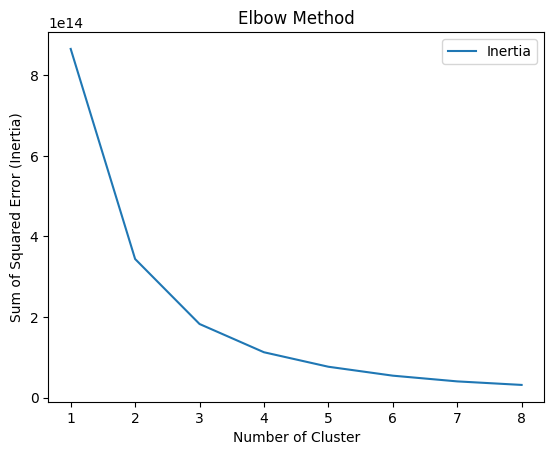

In [ ]:
inertia_df2.plot(kind = 'line')
plt.ylabel('Sum of Squared Error (Inertia)')
plt.xlabel('Number of Cluster')
plt.title('Elbow Method')

Berdasarkan hasil elbow method kami memilih untuk mengambil jumlah 2 kluster karena itu pilihan bijak jumlah cluster yang optimal

In [ ]:
modelKM2 = KMeans(n_clusters = 2, random_state = 42)
modelKM2.fit(df2)

KMeans(n_clusters=2, random_state=42)

In [ ]:
modelKM2.predict(df2)

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [ ]:
sample_kalsel['Cluster_KM'] = modelKM2.predict(df2)
sample_kalsel

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM
2245126,TRX539525,SC6372061003048,5,101900.0,0.0,2024-11-10,Keperluan Rumah Tangga,637206,KALIMANTAN SELATAN,63,...,1990-02-11,101900.0,34,0,2024-11-10,Sunday,November,2024,0.0,0
2329694,TRX627428,SC6305101007004,2,22000.0,0.0,2024-08-27,Woman Fashion,630510,KALIMANTAN SELATAN,63,...,1977-07-06,22000.0,46,1,2024-08-27,Tuesday,August,2024,0.0,0
2268158,TRX563217,SC6302062011007,3,3900.0,0.0,2024-04-29,Food & Drink,630206,KALIMANTAN SELATAN,63,...,2001-02-06,3900.0,23,1,2024-04-29,Monday,April,2024,0.0,0
2244778,TRX539177,SC6372061003036,14,14400.0,0.0,2024-03-01,Kesehatan,637206,KALIMANTAN SELATAN,63,...,2007-08-10,14400.0,16,0,2024-03-01,Friday,March,2024,0.0,0
2296235,TRX592154,SC6310072001005,7,43000.0,0.0,2024-08-09,Keperluan Anak,631007,KALIMANTAN SELATAN,63,...,1989-05-01,43000.0,35,1,2024-08-09,Friday,August,2024,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2271618,TRX566740,SC6309122004001,1,10400.0,0.0,2024-06-21,Man Fashion,630912,KALIMANTAN SELATAN,63,...,1983-08-22,10400.0,40,1,2024-06-21,Friday,June,2024,0.0,0
2280743,TRX576028,SC6309072005001,17,152000.0,0.0,2024-10-23,Hotel,630907,KALIMANTAN SELATAN,63,...,1979-07-20,152000.0,44,1,2024-10-23,Wednesday,October,2024,0.0,0
2215240,TRX508454,SC6307082019002,17,700.0,0.0,2024-08-07,Hotel,630708,KALIMANTAN SELATAN,63,...,1978-04-09,700.0,46,1,2024-08-07,Wednesday,August,2024,0.0,0
2407068,TRX507801,SC6307072004004,17,2000.0,0.0,2024-04-02,Hotel,630707,KALIMANTAN SELATAN,63,...,2002-12-01,2000.0,21,1,2024-04-02,Tuesday,April,2024,0.0,0


In [ ]:
df2['Cluster_KM'] = modelKM.predict(df2)
df2

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2245126,34,5,0,101900.0,0.0,0
2329694,46,2,1,22000.0,0.0,0
2268158,23,3,1,3900.0,0.0,0
2244778,16,14,0,14400.0,0.0,0
2296235,35,7,1,43000.0,0.0,0
...,...,...,...,...,...,...
2271618,40,1,1,10400.0,0.0,0
2280743,44,17,1,152000.0,0.0,0
2215240,46,17,1,700.0,0.0,0
2407068,21,17,1,2000.0,0.0,0


In [ ]:
sample_kalsel['Cluster_KM'].value_counts()

Cluster_KM
0    127027
1      7589
Name: count, dtype: int64

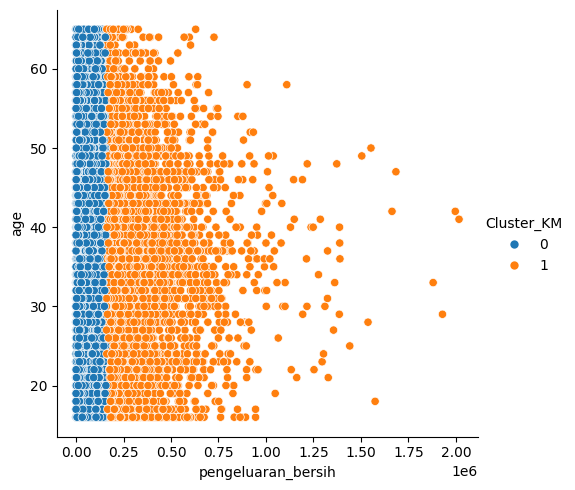

In [ ]:
sns.relplot(x = 'pengeluaran_bersih', y = 'age', data = sample_kalsel, hue = 'Cluster_KM', palette = 'tab10')

dari interpretasi ini, kemampuan rate daya beli masyarakat di Kalimantan Selatan terbagi dalam golongan Tinggi (High level) dan (low level). dalam kasus ini

* cluster 0 adalah : rendah (low level)
* cluster 1 adalah : tinggi (high level)

In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
sample_kalsel['Kategori'] = sample_kalsel['Cluster_KM'].replace(label_dict)
sample_kalsel

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2245126,TRX539525,SC6372061003048,5,101900.0,0.0,2024-11-10,Keperluan Rumah Tangga,637206,KALIMANTAN SELATAN,63,...,101900.0,34,0,2024-11-10,Sunday,November,2024,0.0,0,rendah
2329694,TRX627428,SC6305101007004,2,22000.0,0.0,2024-08-27,Woman Fashion,630510,KALIMANTAN SELATAN,63,...,22000.0,46,1,2024-08-27,Tuesday,August,2024,0.0,0,rendah
2268158,TRX563217,SC6302062011007,3,3900.0,0.0,2024-04-29,Food & Drink,630206,KALIMANTAN SELATAN,63,...,3900.0,23,1,2024-04-29,Monday,April,2024,0.0,0,rendah
2244778,TRX539177,SC6372061003036,14,14400.0,0.0,2024-03-01,Kesehatan,637206,KALIMANTAN SELATAN,63,...,14400.0,16,0,2024-03-01,Friday,March,2024,0.0,0,rendah
2296235,TRX592154,SC6310072001005,7,43000.0,0.0,2024-08-09,Keperluan Anak,631007,KALIMANTAN SELATAN,63,...,43000.0,35,1,2024-08-09,Friday,August,2024,0.0,0,rendah
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2271618,TRX566740,SC6309122004001,1,10400.0,0.0,2024-06-21,Man Fashion,630912,KALIMANTAN SELATAN,63,...,10400.0,40,1,2024-06-21,Friday,June,2024,0.0,0,rendah
2280743,TRX576028,SC6309072005001,17,152000.0,0.0,2024-10-23,Hotel,630907,KALIMANTAN SELATAN,63,...,152000.0,44,1,2024-10-23,Wednesday,October,2024,0.0,0,rendah
2215240,TRX508454,SC6307082019002,17,700.0,0.0,2024-08-07,Hotel,630708,KALIMANTAN SELATAN,63,...,700.0,46,1,2024-08-07,Wednesday,August,2024,0.0,0,rendah
2407068,TRX507801,SC6307072004004,17,2000.0,0.0,2024-04-02,Hotel,630707,KALIMANTAN SELATAN,63,...,2000.0,21,1,2024-04-02,Tuesday,April,2024,0.0,0,rendah


### Metric Evaluation

In [ ]:
# Menggunakan silhouette score untuk mengevaluasi hasil klaster
silhouette_avg = silhouette_score(df2, sample_kalsel['Cluster_KM'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.8433986085769336


In [ ]:
# Menggunakan davies bouldin score untuk mengevaluasi hasil klaster
dbi_avg = davies_bouldin_score(df2, sample_kalsel['Cluster_KM'])
print(f"Davies Bouldin Score: {dbi_avg}")

Davies Bouldin Score: 0.5017923790733344


In [ ]:
# Menggunakan calinski harabasz score untuk mengevaluasi hasil klaster
calinski_avg = calinski_harabasz_score(df2, sample_kalsel['Cluster_KM'])
print(f"Calinski Harabasz Score: {calinski_avg}")

Calinski Harabasz Score: 203862.14694249327


Berdasarkan apa yang dilihat dari metric evaluation, interpretasi

* Skor Siluet: Nilai skor siluet yang kami peroleh adalah **0.8433986085769336**
, yang menunjukkan bahwa kluster yang dibuat oleh algoritma pengelompokan Anda memiliki pemisahan yang baik, dengan titik data dalam kluster yang serupa satu sama lain dan berbeda dengan kluster lain.


* Skor Davies-Bouldin: Skor Davies-Bouldin yang kami dapatkan adalah **0.5017923790733344**
. Nilai yang lebih rendah pada skor ini menandakan bahwa kluster yang dibuat memiliki pemisahan yang baik, dengan setiap kluster jauh dari kluster lain.


* Skor Calinski-Harabasz: Skor Calinski-Harabasz yang kami peroleh adalah **203862.14694249327**
, yang menunjukkan bahwa kluster yang dibuat padat dan terpisah dengan baik.


Secara keseluruhan, metrik-metrik ini menunjukkan bahwa algoritma pengelompokan kami telah berkinerja dengan baik dalam mengelompokkan data

## Kalimantan Tengah

In [ ]:
data_kalteng = df_dataset.loc[df_dataset["kode_provinsi"] == 62]
data_kalteng

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
2037513,TRX588193,SC6204022009001,1,49500.0,0.0,2024-05-12,Man Fashion,620402,KALIMANTAN TENGAH,62,...,2023-12-02,1978-07-11,49500.0,45,1,2024-05-12,Sunday,May,2024,0.000000
2037514,TRX588194,SC6204022009001,1,130500.0,30000.0,2024-02-03,Man Fashion,620402,KALIMANTAN TENGAH,62,...,2023-12-02,1978-07-11,100500.0,45,1,2024-02-03,Saturday,February,2024,22.988506
2037515,TRX588195,SC6204022009001,2,88400.0,0.0,2024-01-20,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,2023-12-02,1978-07-11,88400.0,45,1,2024-01-20,Saturday,January,2024,0.000000
2037516,TRX588196,SC6204022009001,2,51600.0,20000.0,2024-09-18,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,2023-12-02,1978-07-11,31600.0,45,1,2024-09-18,Wednesday,September,2024,38.759690
2037517,TRX588197,SC6204022009001,3,194900.0,0.0,2024-02-09,Food & Drink,620402,KALIMANTAN TENGAH,62,...,2023-12-02,1978-07-11,194900.0,45,1,2024-02-09,Friday,February,2024,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,0.0,2024-01-05,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,2024-10-22,2005-06-09,1100.0,18,1,2024-01-05,Friday,January,2024,0.000000
2418903,TRX634419,SC6203092020002,10,2600.0,0.0,2024-07-09,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,2024-10-22,2005-06-09,2600.0,18,1,2024-07-09,Tuesday,July,2024,0.000000
2418904,TRX595914,SC6204012005001,6,12200.0,0.0,2024-06-18,Travel,620401,KALIMANTAN TENGAH,62,...,2023-12-08,1993-12-09,12200.0,30,0,2024-06-18,Tuesday,June,2024,0.000000
2418905,TRX595915,SC6204012005001,6,1600.0,0.0,2024-04-04,Travel,620401,KALIMANTAN TENGAH,62,...,2023-12-08,1993-12-09,1600.0,30,0,2024-04-04,Thursday,April,2024,0.000000


In [ ]:
df3 = data_kalteng[["age", "product_id", "gender_encoded", "pengeluaran_bersih", "burn_rate"]]

In [ ]:
inertia = []
for i in range(1, 9):
    model = KMeans(n_clusters = i, random_state = 42)
    model.fit(df3)
    inertia.append(model.inertia_)
inertia

[953632151867360.0,
 354828547831039.56,
 183167521795701.25,
 110804073302845.97,
 74542044484049.1,
 54342762356372.56,
 40507564466719.36,
 30965357243101.504]

In [ ]:
inertia_df3 = pd.DataFrame({'Inertia':inertia}, index = [i for i in range(1, 9)])
inertia_df3

,Inertia
1,9.536322e+14
2,3.548285e+14
3,1.831675e+14
4,1.108041e+14
5,7.454204e+13
6,5.434276e+13
7,4.050756e+13
8,3.096536e+13


Text(0.5, 1.0, 'Elbow Method')

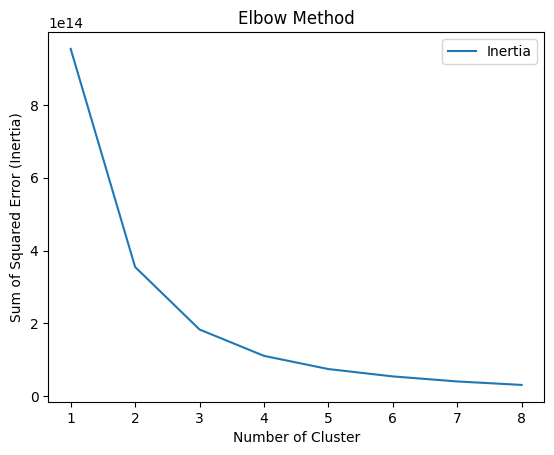

In [ ]:
inertia_df3.plot(kind = 'line')
plt.ylabel('Sum of Squared Error (Inertia)')
plt.xlabel('Number of Cluster')
plt.title('Elbow Method')

Berdasarkan hasil elbow method kami memilih untuk mengambil jumlah 2 kluster karena itu pilihan bijak jumlah cluster yang optimal

In [ ]:
modelKM3 = KMeans(n_clusters = 2, random_state = 42)
modelKM3.fit(df3)

KMeans(n_clusters=2, random_state=42)

In [ ]:
modelKM3.predict(df3)

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [ ]:
data_kalteng['Cluster_KM'] = modelKM3.predict(df3)
data_kalteng.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM
2037513,TRX588193,SC6204022009001,1,49500.0,0.0,2024-05-12,Man Fashion,620402,KALIMANTAN TENGAH,62,...,1978-07-11,49500.0,45,1,2024-05-12,Sunday,May,2024,0.000000,0
2037514,TRX588194,SC6204022009001,1,130500.0,30000.0,2024-02-03,Man Fashion,620402,KALIMANTAN TENGAH,62,...,1978-07-11,100500.0,45,1,2024-02-03,Saturday,February,2024,22.988506,0
2037515,TRX588195,SC6204022009001,2,88400.0,0.0,2024-01-20,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,1978-07-11,88400.0,45,1,2024-01-20,Saturday,January,2024,0.000000,0
2037516,TRX588196,SC6204022009001,2,51600.0,20000.0,2024-09-18,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,1978-07-11,31600.0,45,1,2024-09-18,Wednesday,September,2024,38.759690,0
2037517,TRX588197,SC6204022009001,3,194900.0,0.0,2024-02-09,Food & Drink,620402,KALIMANTAN TENGAH,62,...,1978-07-11,194900.0,45,1,2024-02-09,Friday,February,2024,0.000000,1


In [ ]:
df3['Cluster_KM'] = modelKM.predict(df3)
df3

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2037513,45,1,1,49500.0,0.000000,0
2037514,45,1,1,100500.0,22.988506,0
2037515,45,2,1,88400.0,0.000000,0
2037516,45,2,1,31600.0,38.759690,0
2037517,45,3,1,194900.0,0.000000,1
...,...,...,...,...,...,...
2418902,18,10,1,1100.0,0.000000,0
2418903,18,10,1,2600.0,0.000000,0
2418904,30,6,0,12200.0,0.000000,0
2418905,30,6,0,1600.0,0.000000,0


In [ ]:
data_kalteng['Cluster_KM'].value_counts()

Cluster_KM
0    124413
1     10203
Name: count, dtype: int64

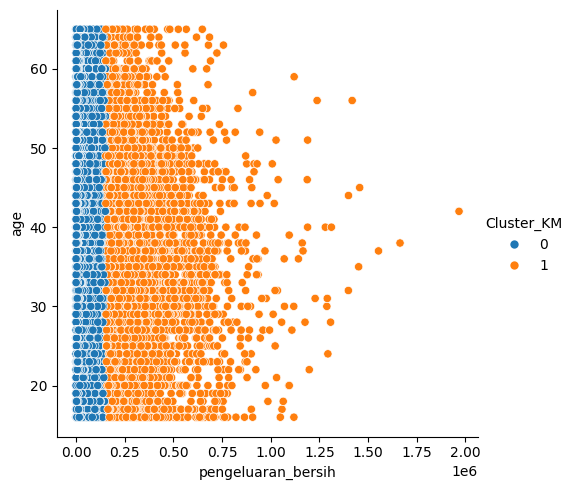

In [ ]:
sns.relplot(x = 'pengeluaran_bersih', y = 'age', data = data_kalteng, hue = 'Cluster_KM', palette = 'tab10')

dari interpretasi ini, kemampuan rate daya beli masyarakat di Kalimantan tengah terbagi dalam golongan Tinggi (High level) dan (low level). dalam kasus ini

* cluster 0 adalah : rendah (low level)
* cluster 1 adalah : tinggi (high level)

In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
data_kalteng['Kategori'] = data_kalteng['Cluster_KM'].replace(label_dict)
data_kalteng

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2037513,TRX588193,SC6204022009001,1,49500.0,0.0,2024-05-12,Man Fashion,620402,KALIMANTAN TENGAH,62,...,49500.0,45,1,2024-05-12,Sunday,May,2024,0.000000,0,rendah
2037514,TRX588194,SC6204022009001,1,130500.0,30000.0,2024-02-03,Man Fashion,620402,KALIMANTAN TENGAH,62,...,100500.0,45,1,2024-02-03,Saturday,February,2024,22.988506,0,rendah
2037515,TRX588195,SC6204022009001,2,88400.0,0.0,2024-01-20,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,88400.0,45,1,2024-01-20,Saturday,January,2024,0.000000,0,rendah
2037516,TRX588196,SC6204022009001,2,51600.0,20000.0,2024-09-18,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,31600.0,45,1,2024-09-18,Wednesday,September,2024,38.759690,0,rendah
2037517,TRX588197,SC6204022009001,3,194900.0,0.0,2024-02-09,Food & Drink,620402,KALIMANTAN TENGAH,62,...,194900.0,45,1,2024-02-09,Friday,February,2024,0.000000,1,tinggi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2418902,TRX634418,SC6203092020002,10,1100.0,0.0,2024-01-05,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,1100.0,18,1,2024-01-05,Friday,January,2024,0.000000,0,rendah
2418903,TRX634419,SC6203092020002,10,2600.0,0.0,2024-07-09,"Transportasi (Kereta, Pesawat, Kapal)",620309,KALIMANTAN TENGAH,62,...,2600.0,18,1,2024-07-09,Tuesday,July,2024,0.000000,0,rendah
2418904,TRX595914,SC6204012005001,6,12200.0,0.0,2024-06-18,Travel,620401,KALIMANTAN TENGAH,62,...,12200.0,30,0,2024-06-18,Tuesday,June,2024,0.000000,0,rendah
2418905,TRX595915,SC6204012005001,6,1600.0,0.0,2024-04-04,Travel,620401,KALIMANTAN TENGAH,62,...,1600.0,30,0,2024-04-04,Thursday,April,2024,0.000000,0,rendah


### Metric Evaluation

In [ ]:
# Menggunakan silhouette score untuk mengevaluasi hasil klaster
silhouette_avg = silhouette_score(df3, data_kalteng['Cluster_KM'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.8213570302024611


In [ ]:
# Menggunakan davies bouldin score untuk mengevaluasi hasil klaster
dbi_avg = davies_bouldin_score(df3, data_kalteng['Cluster_KM'])
print(f"Davies Bouldin Score: {dbi_avg}")

Davies Bouldin Score: 0.4986279571514888


In [ ]:
# Menggunakan calinski harabasz score untuk mengevaluasi hasil klaster
calinski_avg = calinski_harabasz_score(df3, data_kalteng['Cluster_KM'])
print(f"Calinski Harabasz Score: {calinski_avg}")

Calinski Harabasz Score: 227172.8083315875


Berdasarkan apa yang dilihat dari metric evaluation, interpretasi

* Skor Siluet: Nilai skor siluet yang kami peroleh adalah **0.8213570302024611**
, yang menunjukkan bahwa kluster yang dibuat oleh algoritma pengelompokan Anda memiliki pemisahan yang baik, dengan titik data dalam kluster yang serupa satu sama lain dan berbeda dengan kluster lain.


* Skor Davies-Bouldin: Skor Davies-Bouldin yang kami dapatkan adalah **0.4986279571514888**
. Nilai yang lebih rendah pada skor ini menandakan bahwa kluster yang dibuat memiliki pemisahan yang baik, dengan setiap kluster jauh dari kluster lain.


* Skor Calinski-Harabasz: Skor Calinski-Harabasz yang kami peroleh adalah **227172.8083315875**
, yang menunjukkan bahwa kluster yang dibuat padat dan terpisah dengan baik.


Secara keseluruhan, metrik-metrik ini menunjukkan bahwa algoritma pengelompokan kami telah berkinerja dengan baik dalam mengelompokkan data

## Papua Selatan

In [ ]:
data_papua = df_dataset.loc[df_dataset["kode_provinsi"] == 93]
data_papua

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
2336740,TRX346871,SC9302032009001,1,422400.0,0.0,2024-04-04,Man Fashion,930203,PAPUA SELATAN,93,...,2023-12-31,1986-02-12,422400.0,38,0,2024-04-04,Thursday,April,2024,0.000000
2336741,TRX346872,SC9302032009001,1,357600.0,0.0,2024-02-12,Man Fashion,930203,PAPUA SELATAN,93,...,2023-12-31,1986-02-12,357600.0,38,0,2024-02-12,Monday,February,2024,0.000000
2336742,TRX346873,SC9302032009001,2,28700.0,0.0,2024-03-09,Woman Fashion,930203,PAPUA SELATAN,93,...,2023-12-31,1986-02-12,28700.0,38,0,2024-03-09,Saturday,March,2024,0.000000
2336743,TRX346874,SC9302032009001,2,31300.0,0.0,2024-06-01,Woman Fashion,930203,PAPUA SELATAN,93,...,2023-12-31,1986-02-12,31300.0,38,0,2024-06-01,Saturday,June,2024,0.000000
2336744,TRX346875,SC9302032009001,3,11500.0,0.0,2024-06-02,Food & Drink,930203,PAPUA SELATAN,93,...,2023-12-31,1986-02-12,11500.0,38,0,2024-06-02,Sunday,June,2024,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2411737,TRX350909,SC9301062001009,15,6200.0,6200.0,2024-09-11,Investasi,930106,PAPUA SELATAN,93,...,2023-10-05,1991-01-23,0.0,33,0,2024-09-11,Wednesday,September,2024,100.000000
2411738,TRX350912,SC9301062001009,17,29400.0,0.0,2024-10-07,Hotel,930106,PAPUA SELATAN,93,...,2023-10-05,1991-01-23,29400.0,33,0,2024-10-07,Monday,October,2024,0.000000
2411739,TRX350913,SC9301062001009,17,20600.0,20000.0,2024-02-27,Hotel,930106,PAPUA SELATAN,93,...,2023-10-05,1991-01-23,600.0,33,0,2024-02-27,Tuesday,February,2024,97.087379
2411740,TRX350899,SC9301062001009,10,7400.0,0.0,2024-07-16,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,2023-10-05,1991-01-23,7400.0,33,0,2024-07-16,Tuesday,July,2024,0.000000


In [ ]:
sample_papua = data_papua.sample(n = 134616, random_state = 42, replace = True)
sample_papua

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,join_date,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate
2339914,TRX350082,SC9301062007003,4,17300.0,16100.0,2024-08-28,Ride Hailing,930106,PAPUA SELATAN,93,...,2023-11-04,1989-12-02,1200.0,34,0,2024-08-28,Wednesday,August,2024,93.063584
2340247,TRX350410,SC9301062002005,10,3700.0,0.0,2024-10-14,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,2023-10-29,1975-12-20,3700.0,48,0,2024-10-14,Monday,October,2024,0.000000
2337600,TRX347768,SC9301011006016,5,87400.0,0.0,2024-12-16,Keperluan Rumah Tangga,930101,PAPUA SELATAN,93,...,2023-12-11,1994-04-24,87400.0,30,1,2024-12-16,Monday,December,2024,0.000000
2338034,TRX348185,SC9301011005030,10,3900.0,0.0,2024-03-05,"Transportasi (Kereta, Pesawat, Kapal)",930101,PAPUA SELATAN,93,...,2023-12-14,1974-11-16,3900.0,49,0,2024-03-05,Tuesday,March,2024,0.000000
2337870,TRX348039,SC9301011005002,17,30000.0,6900.0,2024-04-09,Hotel,930101,PAPUA SELATAN,93,...,2023-12-27,1970-06-08,23100.0,53,1,2024-04-09,Tuesday,April,2024,23.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2339006,TRX349162,SC9301052007011,11,8000.0,0.0,2024-01-22,Top Up Game,930105,PAPUA SELATAN,93,...,2023-11-13,1991-04-11,8000.0,33,1,2024-01-22,Monday,January,2024,0.000000
2340489,TRX350665,SC9301062003006,16,11400.0,0.0,2024-04-12,Sewa Motor/Mobil,930106,PAPUA SELATAN,93,...,2023-11-17,2007-03-01,11400.0,17,0,2024-04-12,Friday,April,2024,0.000000
2340480,TRX350652,SC9301062003006,8,24000.0,0.0,2024-08-27,Elektronik,930106,PAPUA SELATAN,93,...,2023-11-17,2007-03-01,24000.0,17,0,2024-08-27,Tuesday,August,2024,0.000000
2339458,TRX349638,SC9301062013003,12,2900.0,0.0,2024-02-17,Otomotif,930106,PAPUA SELATAN,93,...,2023-10-13,1992-11-16,2900.0,31,0,2024-02-17,Saturday,February,2024,0.000000


In [ ]:
df4 = sample_papua[["age", "product_id", "gender_encoded", "pengeluaran_bersih", "burn_rate"]]

In [ ]:
inertia = []
for i in range(1, 9):
    model = KMeans(n_clusters = i, random_state = 42)
    model.fit(df4)
    inertia.append(model.inertia_)
inertia

[651448164345317.8,
 263101603288581.06,
 154613358234317.0,
 86501502190481.11,
 53046649683831.58,
 37169870204575.734,
 28112582820066.77,
 21343859921240.02]

In [ ]:
inertia_df4 = pd.DataFrame({'Inertia':inertia}, index = [i for i in range(1, 9)])
inertia_df4

,Inertia
1,6.514482e+14
2,2.631016e+14
3,1.546134e+14
4,8.650150e+13
5,5.304665e+13
6,3.716987e+13
7,2.811258e+13
8,2.134386e+13


Text(0.5, 1.0, 'Elbow Method')

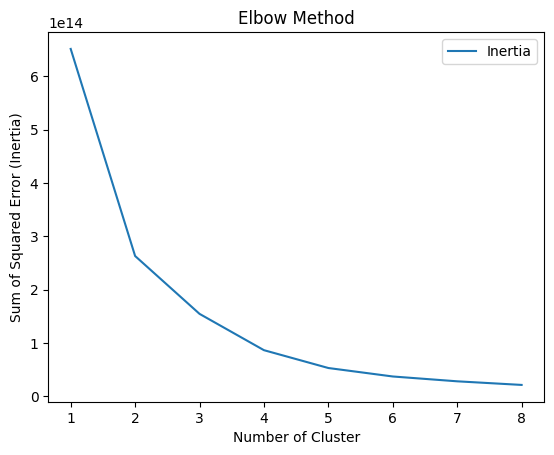

In [ ]:
inertia_df4.plot(kind = 'line')
plt.ylabel('Sum of Squared Error (Inertia)')
plt.xlabel('Number of Cluster')
plt.title('Elbow Method')

Berdasarkan hasil elbow method kami memilih untuk mengambil jumlah 2 kluster karena itu pilihan bijak jumlah cluster yang optimal

In [ ]:
modelKM4 = KMeans(n_clusters = 2, random_state = 42)
modelKM4.fit(df4)

KMeans(n_clusters=2, random_state=42)

In [ ]:
modelKM4.predict(df4)

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

In [ ]:
sample_papua['Cluster_KM'] = modelKM4.predict(df4)
sample_papua

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,birth,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM
2339914,TRX350082,SC9301062007003,4,17300.0,16100.0,2024-08-28,Ride Hailing,930106,PAPUA SELATAN,93,...,1989-12-02,1200.0,34,0,2024-08-28,Wednesday,August,2024,93.063584,0
2340247,TRX350410,SC9301062002005,10,3700.0,0.0,2024-10-14,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,1975-12-20,3700.0,48,0,2024-10-14,Monday,October,2024,0.000000,0
2337600,TRX347768,SC9301011006016,5,87400.0,0.0,2024-12-16,Keperluan Rumah Tangga,930101,PAPUA SELATAN,93,...,1994-04-24,87400.0,30,1,2024-12-16,Monday,December,2024,0.000000,0
2338034,TRX348185,SC9301011005030,10,3900.0,0.0,2024-03-05,"Transportasi (Kereta, Pesawat, Kapal)",930101,PAPUA SELATAN,93,...,1974-11-16,3900.0,49,0,2024-03-05,Tuesday,March,2024,0.000000,0
2337870,TRX348039,SC9301011005002,17,30000.0,6900.0,2024-04-09,Hotel,930101,PAPUA SELATAN,93,...,1970-06-08,23100.0,53,1,2024-04-09,Tuesday,April,2024,23.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2339006,TRX349162,SC9301052007011,11,8000.0,0.0,2024-01-22,Top Up Game,930105,PAPUA SELATAN,93,...,1991-04-11,8000.0,33,1,2024-01-22,Monday,January,2024,0.000000,0
2340489,TRX350665,SC9301062003006,16,11400.0,0.0,2024-04-12,Sewa Motor/Mobil,930106,PAPUA SELATAN,93,...,2007-03-01,11400.0,17,0,2024-04-12,Friday,April,2024,0.000000,0
2340480,TRX350652,SC9301062003006,8,24000.0,0.0,2024-08-27,Elektronik,930106,PAPUA SELATAN,93,...,2007-03-01,24000.0,17,0,2024-08-27,Tuesday,August,2024,0.000000,0
2339458,TRX349638,SC9301062013003,12,2900.0,0.0,2024-02-17,Otomotif,930106,PAPUA SELATAN,93,...,1992-11-16,2900.0,31,0,2024-02-17,Saturday,February,2024,0.000000,0


In [ ]:
df4['Cluster_KM'] = modelKM4.predict(df4)
df4

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2339914,34,4,0,1200.0,93.063584,0
2340247,48,10,0,3700.0,0.000000,0
2337600,30,5,1,87400.0,0.000000,0
2338034,49,10,0,3900.0,0.000000,0
2337870,53,17,1,23100.0,23.000000,0
...,...,...,...,...,...,...
2339006,33,11,1,8000.0,0.000000,0
2340489,17,16,0,11400.0,0.000000,0
2340480,17,8,0,24000.0,0.000000,0
2339458,31,12,0,2900.0,0.000000,0


In [ ]:
sample_papua['Cluster_KM'].value_counts()

Cluster_KM
0    122351
1     12265
Name: count, dtype: int64

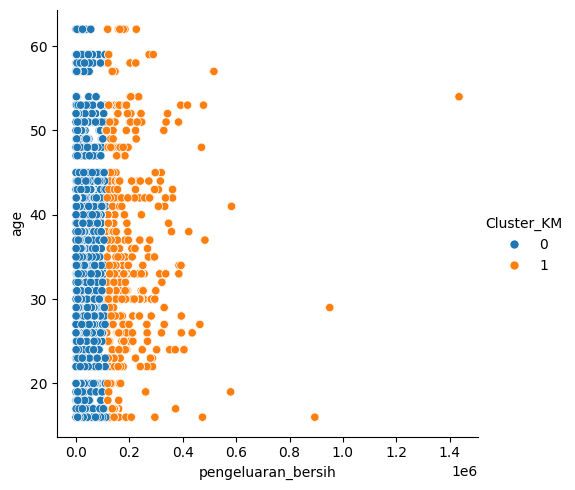

In [ ]:
sns.relplot(x = 'pengeluaran_bersih', y = 'age', data = sample_papua, hue = 'Cluster_KM', palette = 'tab10')

dari interpretasi ini, kemampuan rate daya beli masyarakat di Papua Selatan terbagi dalam golongan Tinggi (High level) dan (low level). dalam kasus ini

* cluster 0 adalah : rendah (low level)
* cluster 1 adalah : tinggi (high level)

In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
sample_papua['Kategori'] = sample_papua['Cluster_KM'].replace(label_dict)
sample_papua

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2339914,TRX350082,SC9301062007003,4,17300.0,16100.0,2024-08-28,Ride Hailing,930106,PAPUA SELATAN,93,...,1200.0,34,0,2024-08-28,Wednesday,August,2024,93.063584,0,rendah
2340247,TRX350410,SC9301062002005,10,3700.0,0.0,2024-10-14,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,3700.0,48,0,2024-10-14,Monday,October,2024,0.000000,0,rendah
2337600,TRX347768,SC9301011006016,5,87400.0,0.0,2024-12-16,Keperluan Rumah Tangga,930101,PAPUA SELATAN,93,...,87400.0,30,1,2024-12-16,Monday,December,2024,0.000000,0,rendah
2338034,TRX348185,SC9301011005030,10,3900.0,0.0,2024-03-05,"Transportasi (Kereta, Pesawat, Kapal)",930101,PAPUA SELATAN,93,...,3900.0,49,0,2024-03-05,Tuesday,March,2024,0.000000,0,rendah
2337870,TRX348039,SC9301011005002,17,30000.0,6900.0,2024-04-09,Hotel,930101,PAPUA SELATAN,93,...,23100.0,53,1,2024-04-09,Tuesday,April,2024,23.000000,0,rendah
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2339006,TRX349162,SC9301052007011,11,8000.0,0.0,2024-01-22,Top Up Game,930105,PAPUA SELATAN,93,...,8000.0,33,1,2024-01-22,Monday,January,2024,0.000000,0,rendah
2340489,TRX350665,SC9301062003006,16,11400.0,0.0,2024-04-12,Sewa Motor/Mobil,930106,PAPUA SELATAN,93,...,11400.0,17,0,2024-04-12,Friday,April,2024,0.000000,0,rendah
2340480,TRX350652,SC9301062003006,8,24000.0,0.0,2024-08-27,Elektronik,930106,PAPUA SELATAN,93,...,24000.0,17,0,2024-08-27,Tuesday,August,2024,0.000000,0,rendah
2339458,TRX349638,SC9301062013003,12,2900.0,0.0,2024-02-17,Otomotif,930106,PAPUA SELATAN,93,...,2900.0,31,0,2024-02-17,Saturday,February,2024,0.000000,0,rendah


### Metric Evaluation

In [ ]:
# Menggunakan silhouette score untuk mengevaluasi hasil klaster
silhouette_avg = silhouette_score(df4, sample_papua['Cluster_KM'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.8131624796667561


In [ ]:
# Menggunakan davies bouldin score untuk mengevaluasi hasil klaster
dbi_avg = davies_bouldin_score(df4, sample_papua['Cluster_KM'])
print(f"Davies Bouldin Score: {dbi_avg}")

Davies Bouldin Score: 0.5007729201439017


In [ ]:
# Menggunakan calinski harabasz score untuk mengevaluasi hasil klaster
calinski_avg = calinski_harabasz_score(df4, sample_papua['Cluster_KM'])
print(f"Calinski Harabasz Score: {calinski_avg}")

Calinski Harabasz Score: 198694.6613709996


Berdasarkan apa yang dilihat dari metric evaluation, interpretasi

* Skor Siluet: Nilai skor siluet yang kami peroleh adalah **0.8131624796667561**
, yang menunjukkan bahwa kluster yang dibuat oleh algoritma pengelompokan Anda memiliki pemisahan yang baik, dengan titik data dalam kluster yang serupa satu sama lain dan berbeda dengan kluster lain.


* Skor Davies-Bouldin: Skor Davies-Bouldin yang kami dapatkan adalah **0.5007729201439017**
. Nilai yang lebih rendah pada skor ini menandakan bahwa kluster yang dibuat memiliki pemisahan yang baik, dengan setiap kluster jauh dari kluster lain.


* Skor Calinski-Harabasz: Skor Calinski-Harabasz yang kami peroleh adalah **198694.6613709996**
, yang menunjukkan bahwa kluster yang dibuat padat dan terpisah dengan baik.


Secara keseluruhan, metrik-metrik ini menunjukkan bahwa algoritma pengelompokan kami telah berkinerja dengan baik dalam mengelompokkan data

# EDA After Clustering

## Overview

### Jawa Tengah

In [ ]:
df1.head()

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
765349,47,18,0,11900.0,0.000000,0
1622786,30,14,1,71200.0,25.833333,0
290552,32,2,1,121700.0,0.000000,0
2387203,31,14,1,0.0,100.000000,0
259391,32,15,1,9800.0,27.407407,0


In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
df1['Kategori'] = df1['Cluster_KM'].replace(label_dict)
df1

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM,Kategori
765349,47,18,0,11900.0,0.000000,0,rendah
1622786,30,14,1,71200.0,25.833333,0,rendah
290552,32,2,1,121700.0,0.000000,0,rendah
2387203,31,14,1,0.0,100.000000,0,rendah
259391,32,15,1,9800.0,27.407407,0,rendah
...,...,...,...,...,...,...,...
1037204,48,3,0,52400.0,45.359750,0,rendah
2345782,24,4,1,37700.0,0.000000,0,rendah
1345148,21,1,1,1600.0,96.153846,0,rendah
331777,29,1,1,26700.0,0.000000,0,rendah


In [ ]:
sample_jateng.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
765349,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,11900.0,47,0,2024-06-06,Thursday,June,2024,0.000000,0,rendah
1622786,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,71200.0,30,1,2024-12-24,Tuesday,December,2024,25.833333,0,rendah
290552,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,121700.0,32,1,2024-11-20,Wednesday,November,2024,0.000000,0,rendah
2387203,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,0.0,31,1,2024-12-23,Monday,December,2024,100.000000,0,rendah
259391,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,9800.0,32,1,2024-10-06,Sunday,October,2024,27.407407,0,rendah


### Kalimantan Selatan

In [ ]:
df2.head()

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2245126,34,5,0,101900.0,0.0,0
2329694,46,2,1,22000.0,0.0,0
2268158,23,3,1,3900.0,0.0,0
2244778,16,14,0,14400.0,0.0,0
2296235,35,7,1,43000.0,0.0,0


In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
df2['Kategori'] = df2['Cluster_KM'].replace(label_dict)
df2

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM,Kategori
2245126,34,5,0,101900.0,0.0,0,rendah
2329694,46,2,1,22000.0,0.0,0,rendah
2268158,23,3,1,3900.0,0.0,0,rendah
2244778,16,14,0,14400.0,0.0,0,rendah
2296235,35,7,1,43000.0,0.0,0,rendah
...,...,...,...,...,...,...,...
2271618,40,1,1,10400.0,0.0,0,rendah
2280743,44,17,1,152000.0,0.0,0,rendah
2215240,46,17,1,700.0,0.0,0,rendah
2407068,21,17,1,2000.0,0.0,0,rendah


In [ ]:
sample_kalsel.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2245126,TRX539525,SC6372061003048,5,101900.0,0.0,2024-11-10,Keperluan Rumah Tangga,637206,KALIMANTAN SELATAN,63,...,101900.0,34,0,2024-11-10,Sunday,November,2024,0.0,0,rendah
2329694,TRX627428,SC6305101007004,2,22000.0,0.0,2024-08-27,Woman Fashion,630510,KALIMANTAN SELATAN,63,...,22000.0,46,1,2024-08-27,Tuesday,August,2024,0.0,0,rendah
2268158,TRX563217,SC6302062011007,3,3900.0,0.0,2024-04-29,Food & Drink,630206,KALIMANTAN SELATAN,63,...,3900.0,23,1,2024-04-29,Monday,April,2024,0.0,0,rendah
2244778,TRX539177,SC6372061003036,14,14400.0,0.0,2024-03-01,Kesehatan,637206,KALIMANTAN SELATAN,63,...,14400.0,16,0,2024-03-01,Friday,March,2024,0.0,0,rendah
2296235,TRX592154,SC6310072001005,7,43000.0,0.0,2024-08-09,Keperluan Anak,631007,KALIMANTAN SELATAN,63,...,43000.0,35,1,2024-08-09,Friday,August,2024,0.0,0,rendah


### Kalimantan Tengah

In [ ]:
df3.head()

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2037513,45,1,1,49500.0,0.000000,0
2037514,45,1,1,100500.0,22.988506,0
2037515,45,2,1,88400.0,0.000000,0
2037516,45,2,1,31600.0,38.759690,0
2037517,45,3,1,194900.0,0.000000,1


In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
df3['Kategori'] = df3['Cluster_KM'].replace(label_dict)
df3

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM,Kategori
2037513,45,1,1,49500.0,0.000000,0,rendah
2037514,45,1,1,100500.0,22.988506,0,rendah
2037515,45,2,1,88400.0,0.000000,0,rendah
2037516,45,2,1,31600.0,38.759690,0,rendah
2037517,45,3,1,194900.0,0.000000,1,tinggi
...,...,...,...,...,...,...,...
2418902,18,10,1,1100.0,0.000000,0,rendah
2418903,18,10,1,2600.0,0.000000,0,rendah
2418904,30,6,0,12200.0,0.000000,0,rendah
2418905,30,6,0,1600.0,0.000000,0,rendah


In [ ]:
data_kalteng.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2037513,TRX588193,SC6204022009001,1,49500.0,0.0,2024-05-12,Man Fashion,620402,KALIMANTAN TENGAH,62,...,49500.0,45,1,2024-05-12,Sunday,May,2024,0.000000,0,rendah
2037514,TRX588194,SC6204022009001,1,130500.0,30000.0,2024-02-03,Man Fashion,620402,KALIMANTAN TENGAH,62,...,100500.0,45,1,2024-02-03,Saturday,February,2024,22.988506,0,rendah
2037515,TRX588195,SC6204022009001,2,88400.0,0.0,2024-01-20,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,88400.0,45,1,2024-01-20,Saturday,January,2024,0.000000,0,rendah
2037516,TRX588196,SC6204022009001,2,51600.0,20000.0,2024-09-18,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,31600.0,45,1,2024-09-18,Wednesday,September,2024,38.759690,0,rendah
2037517,TRX588197,SC6204022009001,3,194900.0,0.0,2024-02-09,Food & Drink,620402,KALIMANTAN TENGAH,62,...,194900.0,45,1,2024-02-09,Friday,February,2024,0.000000,1,tinggi


### Papua Selatan

In [ ]:
df4.head()

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
2339914,34,4,0,1200.0,93.063584,0
2340247,48,10,0,3700.0,0.000000,0
2337600,30,5,1,87400.0,0.000000,0
2338034,49,10,0,3900.0,0.000000,0
2337870,53,17,1,23100.0,23.000000,0


In [ ]:
# Membuat dictionary untuk mapping label
label_dict = {0: 'rendah', 1: 'tinggi'}

# Memberikan label kategori pada kolom 'Cluster KM'
df4['Kategori'] = df4['Cluster_KM'].replace(label_dict)
df4

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM,Kategori
2339914,34,4,0,1200.0,93.063584,0,rendah
2340247,48,10,0,3700.0,0.000000,0,rendah
2337600,30,5,1,87400.0,0.000000,0,rendah
2338034,49,10,0,3900.0,0.000000,0,rendah
2337870,53,17,1,23100.0,23.000000,0,rendah
...,...,...,...,...,...,...,...
2339006,33,11,1,8000.0,0.000000,0,rendah
2340489,17,16,0,11400.0,0.000000,0,rendah
2340480,17,8,0,24000.0,0.000000,0,rendah
2339458,31,12,0,2900.0,0.000000,0,rendah


In [ ]:
sample_papua.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
2339914,TRX350082,SC9301062007003,4,17300.0,16100.0,2024-08-28,Ride Hailing,930106,PAPUA SELATAN,93,...,1200.0,34,0,2024-08-28,Wednesday,August,2024,93.063584,0,rendah
2340247,TRX350410,SC9301062002005,10,3700.0,0.0,2024-10-14,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,3700.0,48,0,2024-10-14,Monday,October,2024,0.000000,0,rendah
2337600,TRX347768,SC9301011006016,5,87400.0,0.0,2024-12-16,Keperluan Rumah Tangga,930101,PAPUA SELATAN,93,...,87400.0,30,1,2024-12-16,Monday,December,2024,0.000000,0,rendah
2338034,TRX348185,SC9301011005030,10,3900.0,0.0,2024-03-05,"Transportasi (Kereta, Pesawat, Kapal)",930101,PAPUA SELATAN,93,...,3900.0,49,0,2024-03-05,Tuesday,March,2024,0.000000,0,rendah
2337870,TRX348039,SC9301011005002,17,30000.0,6900.0,2024-04-09,Hotel,930101,PAPUA SELATAN,93,...,23100.0,53,1,2024-04-09,Tuesday,April,2024,23.000000,0,rendah


## KPI

In [ ]:
df_sample_modeling = pd.concat([sample_jateng, sample_kalsel, data_kalteng, sample_papua], ignore_index = True)
df_sample_modeling

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,pengeluaran_bersih,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori
0,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,11900.0,47,0,2024-06-06,Thursday,June,2024,0.000000,0,rendah
1,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,71200.0,30,1,2024-12-24,Tuesday,December,2024,25.833333,0,rendah
2,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,121700.0,32,1,2024-11-20,Wednesday,November,2024,0.000000,0,rendah
3,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,0.0,31,1,2024-12-23,Monday,December,2024,100.000000,0,rendah
4,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,9800.0,32,1,2024-10-06,Sunday,October,2024,27.407407,0,rendah
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538459,TRX349162,SC9301052007011,11,8000.0,0.0,2024-01-22,Top Up Game,930105,PAPUA SELATAN,93,...,8000.0,33,1,2024-01-22,Monday,January,2024,0.000000,0,rendah
538460,TRX350665,SC9301062003006,16,11400.0,0.0,2024-04-12,Sewa Motor/Mobil,930106,PAPUA SELATAN,93,...,11400.0,17,0,2024-04-12,Friday,April,2024,0.000000,0,rendah
538461,TRX350652,SC9301062003006,8,24000.0,0.0,2024-08-27,Elektronik,930106,PAPUA SELATAN,93,...,24000.0,17,0,2024-08-27,Tuesday,August,2024,0.000000,0,rendah
538462,TRX349638,SC9301062013003,12,2900.0,0.0,2024-02-17,Otomotif,930106,PAPUA SELATAN,93,...,2900.0,31,0,2024-02-17,Saturday,February,2024,0.000000,0,rendah


In [ ]:
# AOV dari transaksi data
total_income_sample = df_sample_modeling['pengeluaran_bersih'].sum()
total_transaction_sample = df_sample_modeling['id_trx'].nunique()

aov_sample = total_income_sample / total_transaction_sample
print("Average Order Value (AOV):", aov_sample)

Average Order Value (AOV): 61416.98410766214


In [ ]:
# Order Frequency
total_orders_sample = len(df_sample_modeling)
total_customers_sample = df_sample_modeling['user_id'].nunique()

order_frequency_sample = total_orders_sample / total_customers_sample
print("Order Frequency:", order_frequency_sample)

Order Frequency: 7.88969801755337


In [ ]:
# Average Selling Price
total_income_sample = df_sample_modeling['pengeluaran_bersih'].sum()
unit_terjual_sample = df_sample_modeling['id_trx'].count()

asp_sample = total_income_sample / unit_terjual_sample
print("Average Selling Price (ASP):", asp_sample)

Average Selling Price (ASP): 42164.97964580733


In [ ]:
# Average Transaction Unit (ATU)
unit_terjual_sample = df_sample_modeling['id_trx'].count()
total_transaction_sample = df_sample_modeling['id_trx'].nunique()

atu_sample = unit_terjual_sample / total_transaction_sample
print("Average Transaction Unit (ATU):", atu_sample)

Average Transaction Unit (ATU): 1.456587543112193


## Distribution pengeluaran bersih dan usia customer

### Jawa Tengah

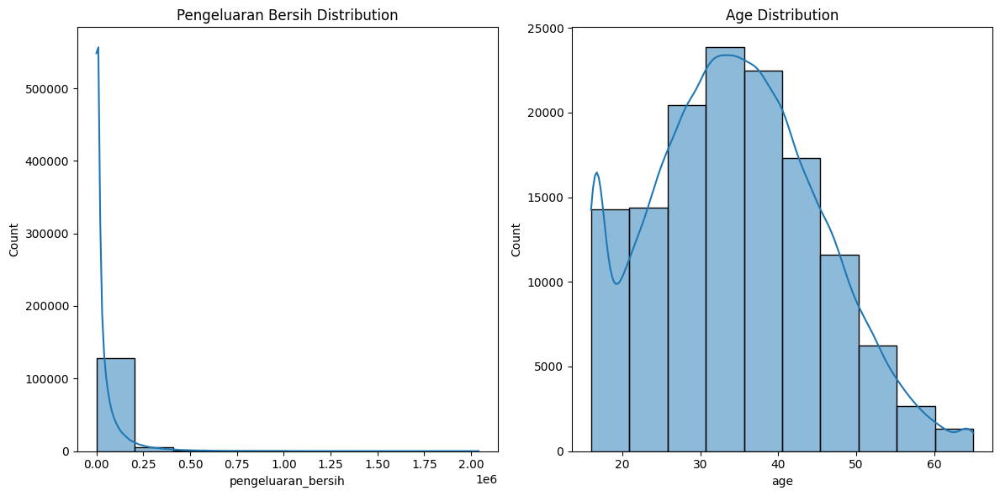

In [ ]:
# Pengeluaran Bersih and Age Analysis
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data = df1, x = 'pengeluaran_bersih', bins = 10, kde = True)
plt.title('Pengeluaran Bersih Distribution')

plt.subplot(1, 2, 2)
sns.histplot(data = df1, x = 'age', bins = 10, kde = True)
plt.title('Age Distribution')

plt.tight_layout()
plt.show()

Berdasarkan deskripsi grafik yang diberikan:

* Pengeluaran Bersih: Distribusi pengeluaran bersih menunjukkan bahwa sebagian besar nilai terkonsentrasi di ujung bawah skala, dengan puncak diatas 500,000 sebelum menurun tajam. Ini menunjukkan bahwa di Provinsi Jawa Tengah, sebagian besar pengeluaran bersih cenderung rendah.
* Distribusi Usia: Grafik usia menunjukkan variasi di berbagai kelompok usia yang bervariasi. Ada beberapa puncak dan lembah, yang menunjukkan adanya keragaman dalam distribusi usia populasi di Provinsi Jawa Tengah.

### Kalimantan Selatan

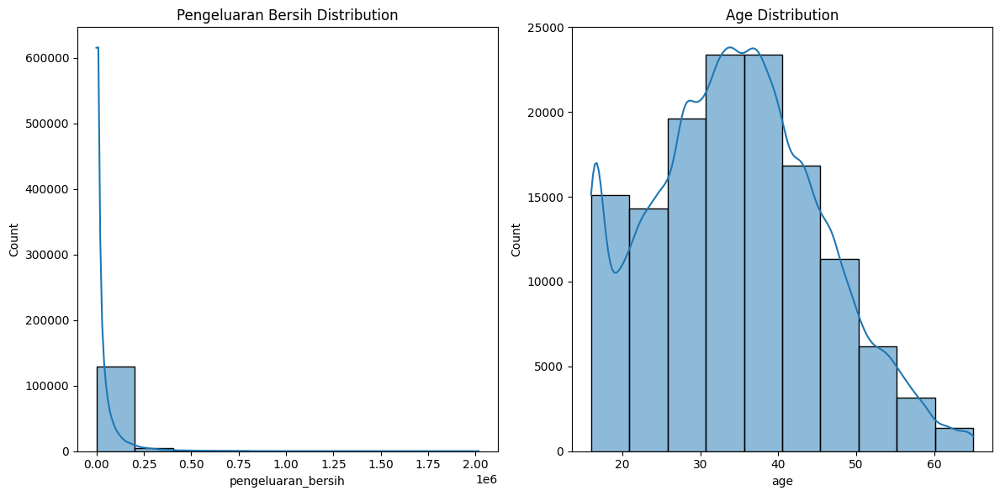

In [ ]:
# Pengeluaran Bersih and Age Analysis
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data = df2, x = 'pengeluaran_bersih', bins = 10, kde = True)
plt.title('Pengeluaran Bersih Distribution')

plt.subplot(1, 2, 2)
sns.histplot(data = df2, x = 'age', bins = 10, kde = True)
plt.title('Age Distribution')

plt.tight_layout()
plt.show()

Berdasarkan deskripsi grafik yang diberikan:

* Pengeluaran Bersih: Distribusi pengeluaran bersih menunjukkan bahwa sebagian besar nilai terkonsentrasi di ujung bawah skala, dengan puncak sekitar 600,000 sebelum menurun tajam. Ini menunjukkan bahwa di Provinsi Kalimantan Selatan, sebagian besar pengeluaran bersih cenderung rendah.
* Distribusi Usia: Grafik usia menunjukkan variasi di berbagai kelompok usia yang bervariasi. Ada beberapa puncak dan lembah, yang menunjukkan adanya keragaman dalam distribusi usia populasi di Provinsi Kalimantan Selatan.

### Kalimantan Tengah

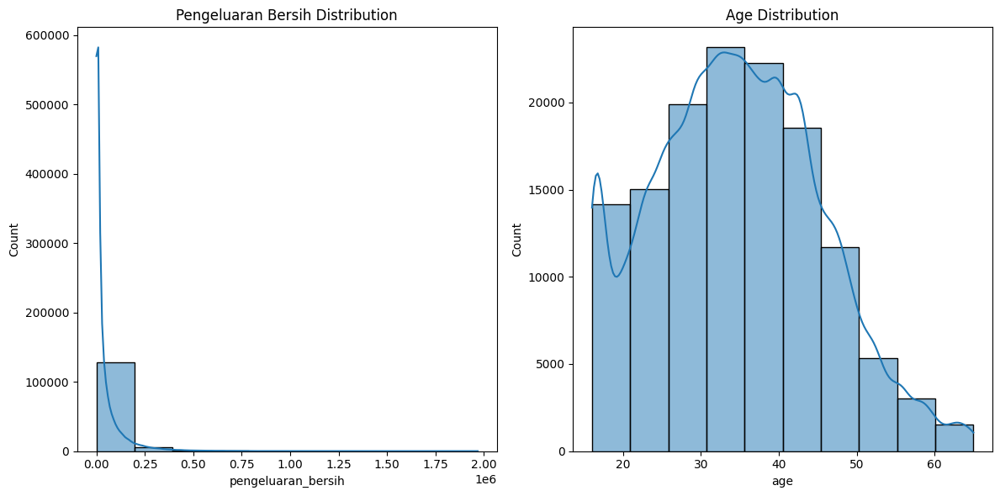

In [ ]:
# Pengeluaran Bersih and Age Analysis
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data = df3, x = 'pengeluaran_bersih', bins = 10, kde = True)
plt.title('Pengeluaran Bersih Distribution')

plt.subplot(1, 2, 2)
sns.histplot(data = df3, x = 'age', bins = 10, kde = True)
plt.title('Age Distribution')

plt.tight_layout()
plt.show()

Berdasarkan deskripsi grafik yang diberikan:

* Pengeluaran Bersih: Distribusi pengeluaran bersih menunjukkan bahwa sebagian besar nilai terkonsentrasi di ujung bawah skala, dengan puncak hampir mendekati 600,000 sebelum menurun tajam. Ini menunjukkan bahwa di Provinsi Kalimantan Selatan, sebagian besar pengeluaran bersih cenderung rendah.
* Distribusi Usia: Grafik usia menunjukkan variasi di berbagai kelompok usia yang bervariasi. Ada beberapa puncak dan lembah, yang menunjukkan adanya keragaman dalam distribusi usia populasi di Provinsi Kalimantan Tengah.

### Papua Selatan

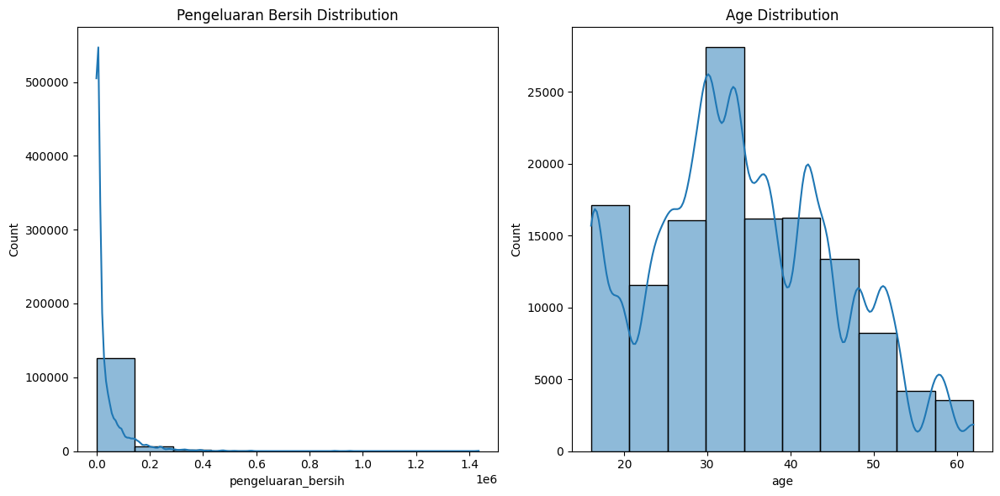

In [ ]:
# Pengeluaran Bersih and Age Analysis
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1)
sns.histplot(data = df4, x = 'pengeluaran_bersih', bins = 10, kde = True)
plt.title('Pengeluaran Bersih Distribution')

plt.subplot(1, 2, 2)
sns.histplot(data = df4, x = 'age', bins = 10, kde = True)
plt.title('Age Distribution')

plt.tight_layout()
plt.show()

Berdasarkan deskripsi grafik yang diberikan:

* Pengeluaran Bersih: Distribusi pengeluaran bersih menunjukkan bahwa sebagian besar nilai terkonsentrasi di ujung bawah skala, dengan puncak sekitar 500,000 sebelum menurun tajam. Ini menunjukkan bahwa di Provinsi Papua, sebagian besar pengeluaran bersih cenderung rendah.
* Distribusi Usia: Grafik usia menunjukkan variasi di berbagai kelompok usia yang bervariasi. Ada beberapa puncak dan lembah, yang menunjukkan adanya keragaman dalam distribusi usia populasi di Provinsi Papua

## Segmentasi kluster dari setiap rata-rata fitur

### Jawa Tengah

In [ ]:
df_segm_analysis_df1 = df1.groupby(['Kategori']).mean()

In [ ]:
df_segm_analysis_df1 = df_segm_analysis_df1.applymap(format_decimal)

In [ ]:
df_segm_analysis_df1

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
Kategori,,,,,,
rendah,34.62,8.33,0.80,27951.69,21.72,0.00
tinggi,34.68,4.74,0.78,302378.59,5.86,1.00


In [ ]:
grouped_df1 = sample_jateng.groupby(['month', 'Kategori'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts_df1 = grouped_df1.size()

# Ubah menjadi DataFrame
dt_df1 = pd.DataFrame(transaction_counts_df1, columns = ['Transaction Count'])

# Reset index
dt_df1.reset_index(inplace=True)
dt_df1

,month,Kategori,Transaction Count
0,April,rendah,10525
1,April,tinggi,819
2,August,rendah,10329
3,August,tinggi,782
4,December,rendah,10448
5,December,tinggi,780
6,February,rendah,10495
7,February,tinggi,811
8,January,rendah,10272
9,January,tinggi,828


### Kalimantan Selatan

In [ ]:
df_segm_analysis_df2 = df2.groupby(['Kategori']).mean()

In [ ]:
df_segm_analysis_df2 = df_segm_analysis_df2.applymap(format_decimal)

In [ ]:
df_segm_analysis_df2

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
Kategori,,,,,,
rendah,34.65,8.37,0.69,25029.17,20.24,0.00
tinggi,34.60,6.88,0.67,301457.23,4.71,1.00


In [ ]:
grouped_df2 = sample_kalsel.groupby(['month', 'Kategori'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts_df2 = grouped_df2.size()

# Ubah menjadi DataFrame
dt_df2 = pd.DataFrame(transaction_counts_df2, columns = ['Transaction Count'])

# Reset index
dt_df2.reset_index(inplace = True)
dt_df2

,month,Kategori,Transaction Count
0,April,rendah,10477
1,April,tinggi,586
2,August,rendah,10591
3,August,tinggi,658
4,December,rendah,10639
5,December,tinggi,638
6,February,rendah,10519
7,February,tinggi,651
8,January,rendah,10559
9,January,tinggi,660


### Kalimantan Tengah

In [ ]:
df_segm_analysis_df3 = df3.groupby(['Kategori']).mean()

In [ ]:
df_segm_analysis_df3 = df_segm_analysis_df3.applymap(format_decimal)

In [ ]:
df_segm_analysis_df3

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
Kategori,,,,,,
rendah,34.70,8.30,0.45,26860.83,19.23,0.00
tinggi,34.77,5.94,0.45,294450.90,4.61,1.00


In [ ]:
grouped_df3 = data_kalteng.groupby(['month', 'Kategori'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts_df3 = grouped_df3.size()

# Ubah menjadi DataFrame
dt_df3 = pd.DataFrame(transaction_counts_df3, columns = ['Transaction Count'])

# Reset index
dt_df3.reset_index(inplace = True)
dt_df3

,month,Kategori,Transaction Count
0,April,rendah,10325
1,April,tinggi,826
2,August,rendah,10392
3,August,tinggi,838
4,December,rendah,10298
5,December,tinggi,850
6,February,rendah,10208
7,February,tinggi,846
8,January,rendah,10253
9,January,tinggi,863


### Papua Selatan

In [ ]:
df_segm_analysis_df4 = df4.groupby(['Kategori']).mean()

In [ ]:
df_segm_analysis_df4 = df_segm_analysis_df4.applymap(format_decimal)

In [ ]:
df_segm_analysis_df4

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM
Kategori,,,,,,
rendah,34.38,8.70,0.57,19265.94,22.26,0.00
tinggi,35.64,5.69,0.52,205912.74,3.86,1.00


In [ ]:
grouped_df4 = sample_papua.groupby(['month', 'Kategori'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts_df4 = grouped_df4.size()

# Ubah menjadi DataFrame
dt_df4 = pd.DataFrame(transaction_counts_df4, columns = ['Transaction Count'])

# Reset index
dt_df4.reset_index(inplace = True)
dt_df4

,month,Kategori,Transaction Count
0,April,rendah,11156
1,April,tinggi,895
2,August,rendah,10299
3,August,tinggi,1284
4,December,rendah,9650
5,December,tinggi,963
6,February,rendah,9641
7,February,tinggi,849
8,January,rendah,9608
9,January,tinggi,1048


## Total transaction each month by kategori cluster

### Jawa Tengah

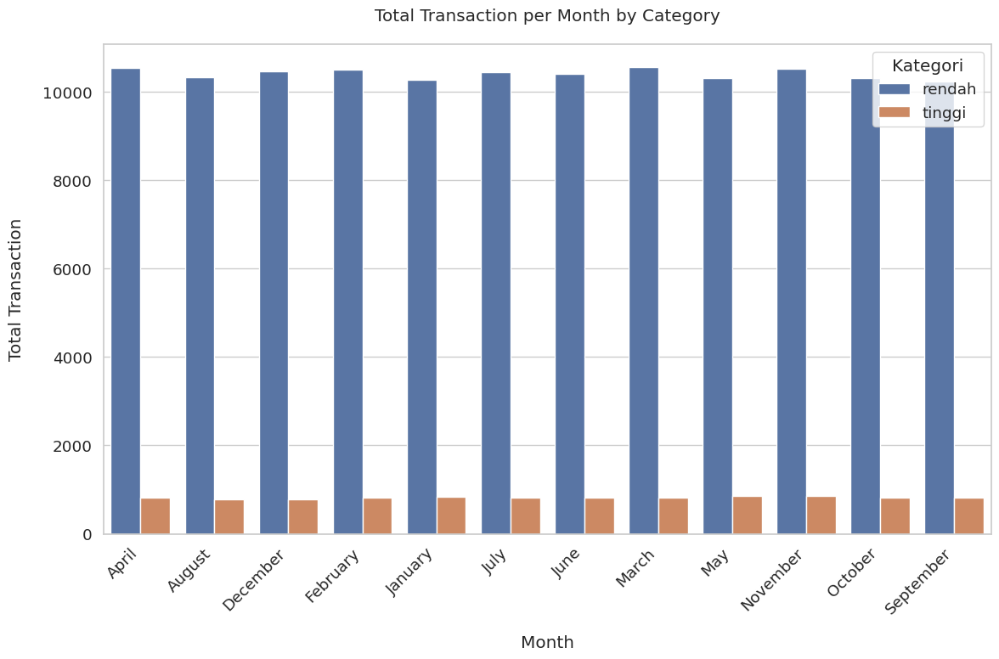

In [ ]:
# Mengatur ukuran font dan gaya plot
sns.set(font_scale = 1.2)
sns.set_style("whitegrid")

# Membuat bar plot
plt.figure(figsize = (12, 8))
barplot = sns.barplot(data = dt_df1, x = 'month', y = 'Transaction Count', hue = 'Kategori', dodge = True)

# Memutar label bulan pada sumbu x agar tidak tumpang tindih
barplot.set_xticklabels(barplot.get_xticklabels(), rotation = 45, horizontalalignment = 'right')

# Menambahkan label dan judul
plt.xlabel('Month', labelpad = 15)
plt.ylabel('Total Transaction', labelpad = 15)
plt.title('Total Transaction per Month by Category', pad = 20)

# Menampilkan plot
plt.tight_layout()
plt.show()

### Kalimantan Selatan

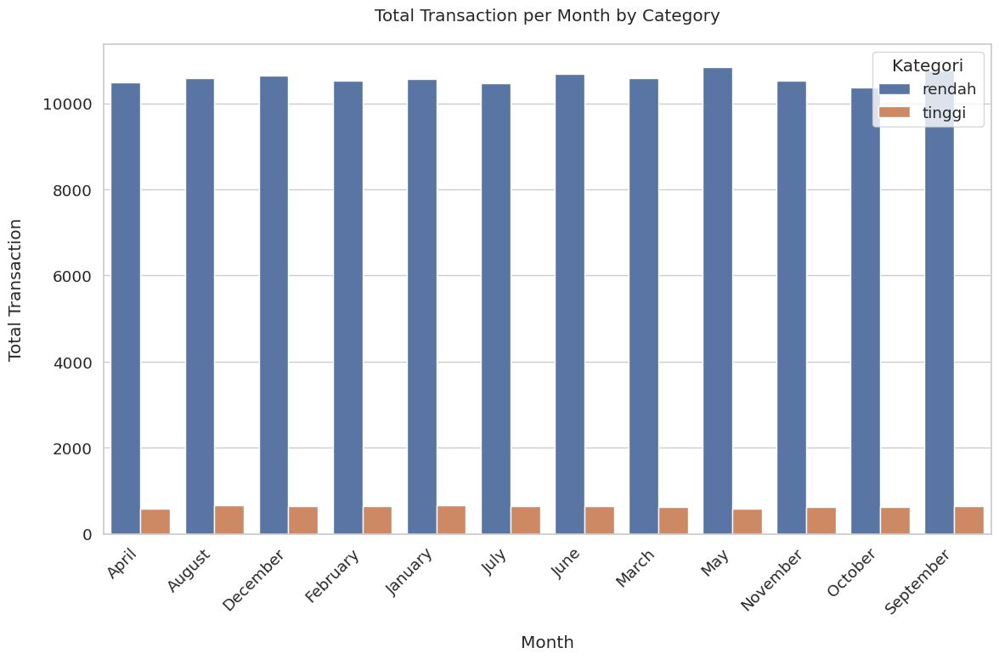

In [ ]:
# Mengatur ukuran font dan gaya plot
sns.set(font_scale = 1.2)
sns.set_style("whitegrid")

# Membuat bar plot
plt.figure(figsize = (12, 8))
barplot = sns.barplot(data = dt_df2, x = 'month', y = 'Transaction Count', hue = 'Kategori', dodge = True)

# Memutar label bulan pada sumbu x agar tidak tumpang tindih
barplot.set_xticklabels(barplot.get_xticklabels(), rotation = 45, horizontalalignment = 'right')

# Menambahkan label dan judul
plt.xlabel('Month', labelpad = 15)
plt.ylabel('Total Transaction', labelpad = 15)
plt.title('Total Transaction per Month by Category', pad = 20)

# Menampilkan plot
plt.tight_layout()
plt.show()

### Kalimantan Tengah

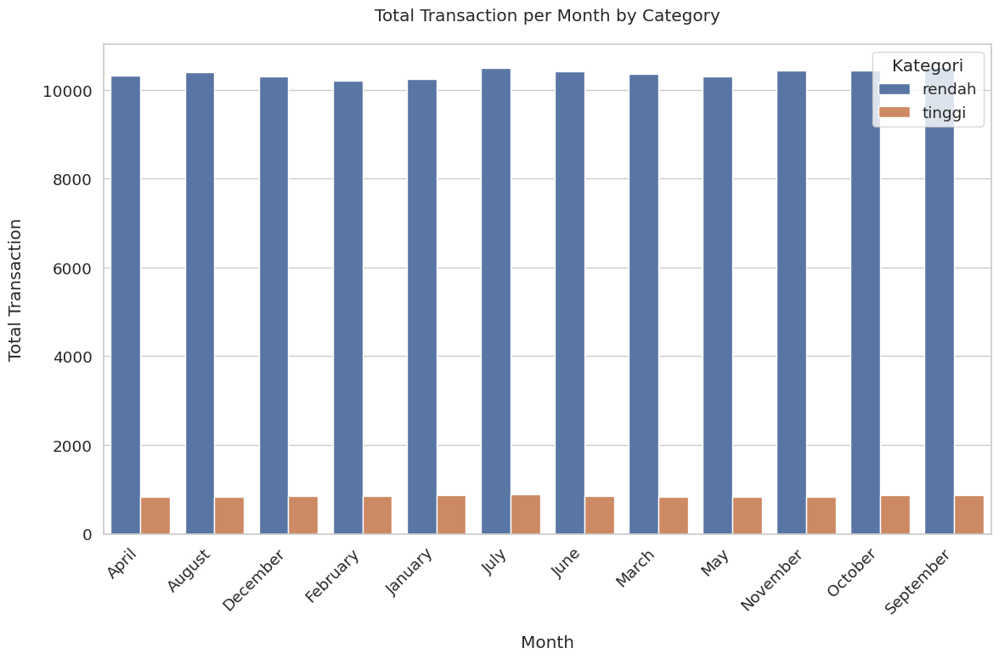

In [ ]:
# Mengatur ukuran font dan gaya plot
sns.set(font_scale = 1.2)
sns.set_style("whitegrid")

# Membuat bar plot
plt.figure(figsize = (12, 8))
barplot = sns.barplot(data = dt_df3, x = 'month', y = 'Transaction Count', hue = 'Kategori', dodge = True)

# Memutar label bulan pada sumbu x agar tidak tumpang tindih
barplot.set_xticklabels(barplot.get_xticklabels(), rotation = 45, horizontalalignment = 'right')

# Menambahkan label dan judul
plt.xlabel('Month', labelpad = 15)
plt.ylabel('Total Transaction', labelpad = 15)
plt.title('Total Transaction per Month by Category', pad = 20)

# Menampilkan plot
plt.tight_layout()
plt.show()

### Papua Selatan

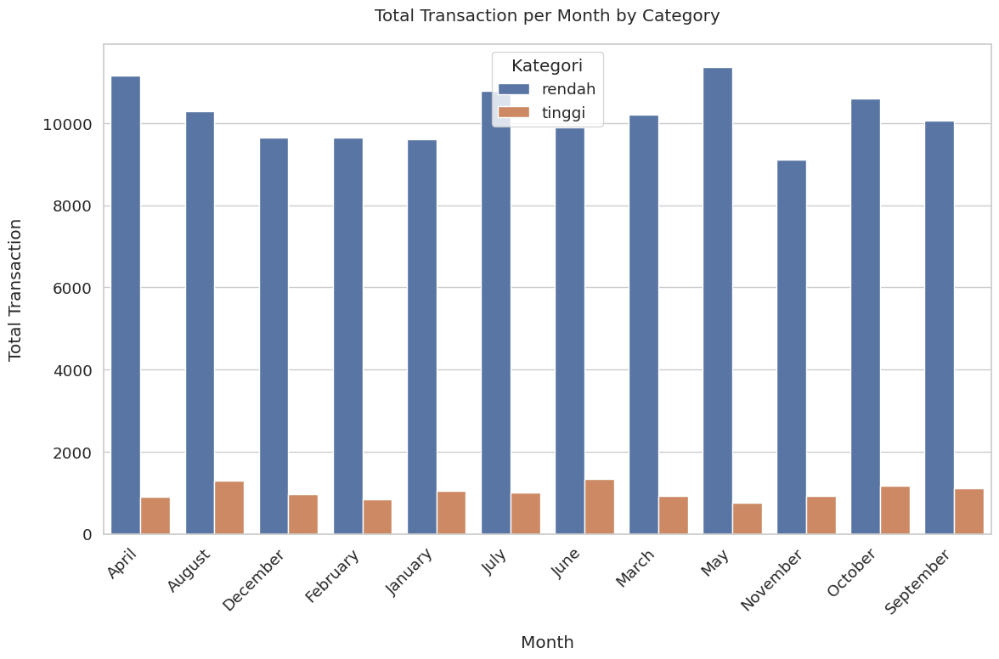

In [ ]:
# Mengatur ukuran font dan gaya plot
sns.set(font_scale = 1.2)
sns.set_style("whitegrid")

# Membuat bar plot
plt.figure(figsize = (12, 8))
barplot = sns.barplot(data = dt_df4, x = 'month', y = 'Transaction Count', hue = 'Kategori', dodge = True)

# Memutar label bulan pada sumbu x agar tidak tumpang tindih
barplot.set_xticklabels(barplot.get_xticklabels(), rotation = 45, horizontalalignment = 'right')

# Menambahkan label dan judul
plt.xlabel('Month', labelpad = 15)
plt.ylabel('Total Transaction', labelpad = 15)
plt.title('Total Transaction per Month by Category', pad = 20)

# Menampilkan plot
plt.tight_layout()
plt.show()

## Proporsi gender customer

### Jawa Tengah

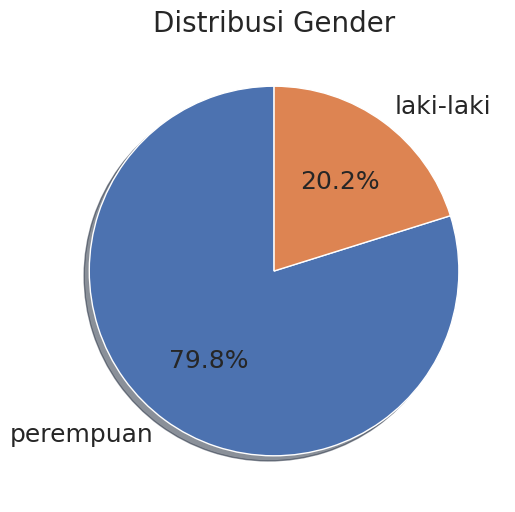

In [ ]:
gender_counts_df1 = sample_jateng['gender'].value_counts()

# Membuat pie chart
plt.figure(figsize = (8, 6))  # Ukuran plot
plt.pie(
    gender_counts_df1,
    labels = gender_counts_df1.index,
    autopct = "%.1f%%",
    shadow = True,
    startangle = 90,
    textprops = {'fontsize': 18}
)

# Menambahkan judul
plt.title('Distribusi Gender', fontsize = 20)

# Menampilkan pie chart
plt.show()

### Kalimantan Selatan

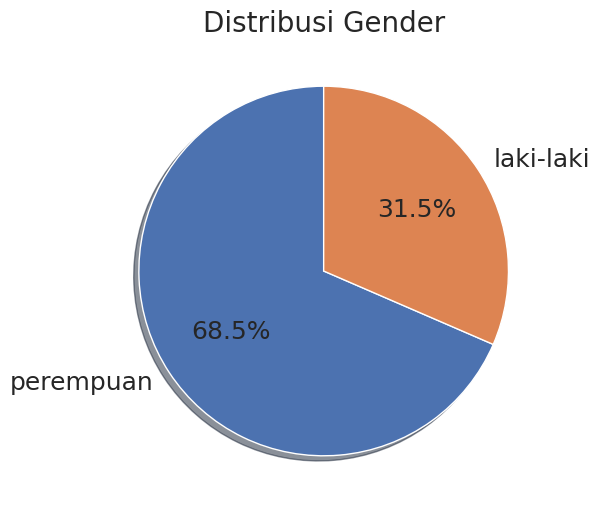

In [ ]:
gender_counts_df2 = sample_kalsel['gender'].value_counts()

# Membuat pie chart
plt.figure(figsize = (8, 6))  # Ukuran plot
plt.pie(
    gender_counts_df2,
    labels = gender_counts_df2.index,
    autopct = "%.1f%%",
    shadow = True,
    startangle = 90,
    textprops = {'fontsize': 18}
)

# Menambahkan judul
plt.title('Distribusi Gender', fontsize = 20)

# Menampilkan pie chart
plt.show()

### Kalimantan Tengah

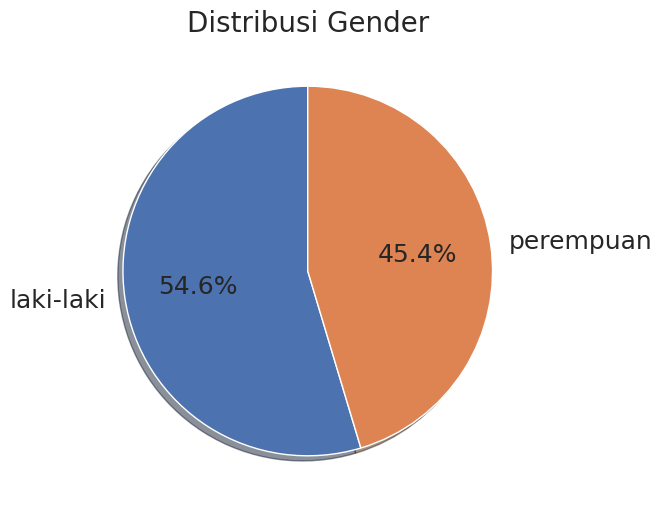

In [ ]:
gender_counts_df3 = data_kalteng['gender'].value_counts()

# Membuat pie chart
plt.figure(figsize = (8, 6))  # Ukuran plot
plt.pie(
    gender_counts_df3,
    labels = gender_counts_df3.index,
    autopct = "%.1f%%",
    shadow = True,
    startangle = 90,
    textprops = {'fontsize': 18}
)

# Menambahkan judul
plt.title('Distribusi Gender', fontsize = 20)

# Menampilkan pie chart
plt.show()

### Papua

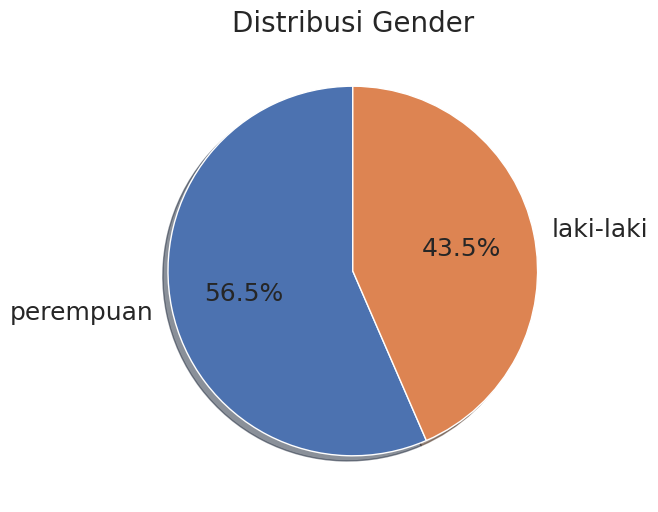

In [ ]:
gender_counts_df4 = sample_papua['gender'].value_counts()

# Membuat pie chart
plt.figure(figsize = (8, 6))  # Ukuran plot
plt.pie(
    gender_counts_df4,
    labels = gender_counts_df4.index,
    autopct = "%.1f%%",
    shadow = True,
    startangle = 90,
    textprops = {'fontsize': 18}
)

# Menambahkan judul
plt.title('Distribusi Gender', fontsize = 20)

# Menampilkan pie chart
plt.show()

## Produk yang dibeli berdasarkan gender customer

### Jawa Tengah

In [ ]:
df1_grouped = sample_jateng.groupby(['gender', 'product_name']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_grouped_jateng = df1_grouped.reset_index(name = 'Transaction Count')

# Menampilkan DataFrame yang telah dikelompokkan
df_grouped_jateng

,gender,product_name,Transaction Count
0,laki-laki,Elektronik,2195
1,laki-laki,Food & Drink,2713
2,laki-laki,Hotel,1952
3,laki-laki,Investasi,1775
4,laki-laki,Keperluan Anak,871
5,laki-laki,Keperluan Rumah Tangga,2184
6,laki-laki,Kesehatan,2148
7,laki-laki,Man Fashion,2688
8,laki-laki,Other,143
9,laki-laki,Otomotif,2178


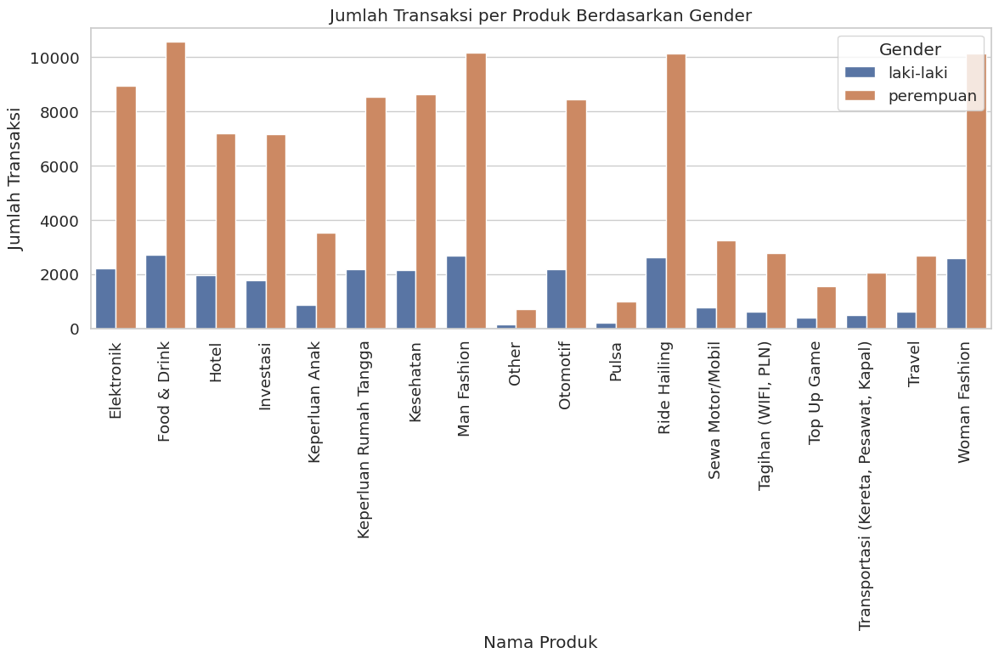

In [ ]:
# Membuat visualisasi menggunakan bar plot
plt.figure(figsize = (12, 8))
sns.barplot(data = df_grouped_jateng, x = 'product_name', y = 'Transaction Count', hue = 'gender')
plt.title('Jumlah Transaksi per Produk Berdasarkan Gender')
plt.xlabel('Nama Produk')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation = 90)
plt.legend(title = 'Gender')
plt.tight_layout()
plt.show()

Berdasarkan grafik diatas, jenis kelamin customer di Provinsi Jawa Tengah didominasi oleh Perempuan.

### Kalimantan Selatan

In [ ]:
df2_grouped = sample_kalsel.groupby(['gender', 'product_name']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_grouped_kalsel = df2_grouped.reset_index(name = 'Transaction Count')

# Menampilkan DataFrame yang telah dikelompokkan
df_grouped_kalsel

,gender,product_name,Transaction Count
0,laki-laki,Elektronik,3478
1,laki-laki,Food & Drink,3513
2,laki-laki,Hotel,3051
3,laki-laki,Investasi,1493
4,laki-laki,Keperluan Anak,1953
5,laki-laki,Keperluan Rumah Tangga,3615
6,laki-laki,Kesehatan,3200
7,laki-laki,Man Fashion,3643
8,laki-laki,Other,403
9,laki-laki,Otomotif,3509


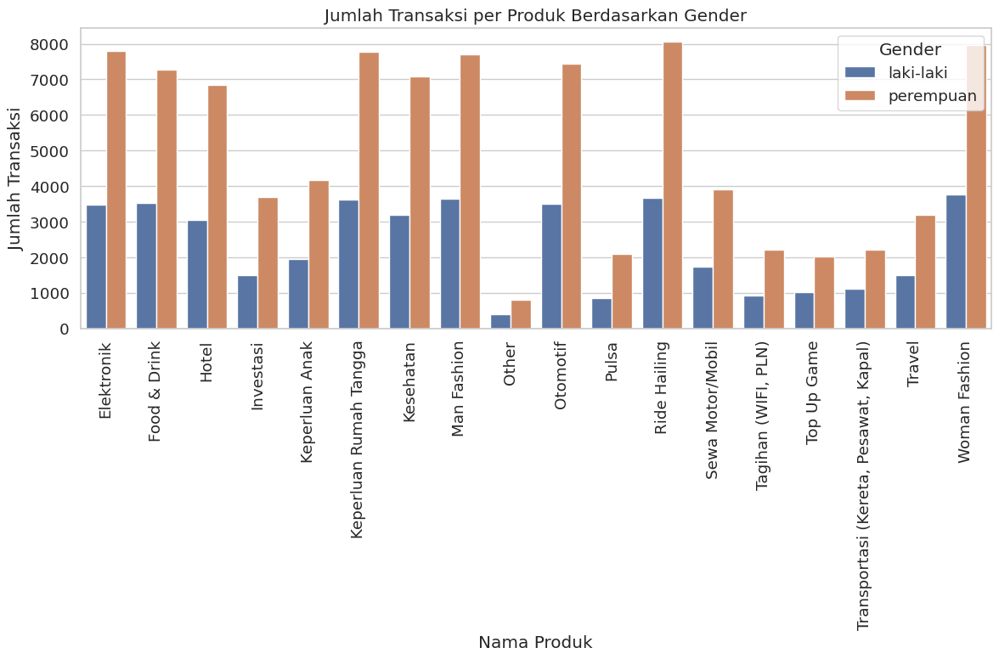

In [ ]:
# Membuat visualisasi menggunakan bar plot
plt.figure(figsize = (12, 8))
sns.barplot(data = df_grouped_kalsel, x = 'product_name', y = 'Transaction Count', hue = 'gender')
plt.title('Jumlah Transaksi per Produk Berdasarkan Gender')
plt.xlabel('Nama Produk')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation = 90)
plt.legend(title = 'Gender')
plt.tight_layout()
plt.show()

Berdasarkan grafik diatas, jenis kelamin customer di Provinsi Kalimantan Selatan didominasi oleh Perempuan.

### Kalimantan Tengah

In [ ]:
df3_grouped = data_kalteng.groupby(['gender', 'product_name']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_grouped_kalteng = df3_grouped.reset_index(name = 'Transaction Count')

# Menampilkan DataFrame yang telah dikelompokkan
df_grouped_kalteng

,gender,product_name,Transaction Count
0,laki-laki,Elektronik,4172
1,laki-laki,Food & Drink,6617
2,laki-laki,Hotel,3683
3,laki-laki,Investasi,3845
4,laki-laki,Keperluan Anak,2588
5,laki-laki,Keperluan Rumah Tangga,6287
6,laki-laki,Kesehatan,6390
7,laki-laki,Man Fashion,6351
8,laki-laki,Other,992
9,laki-laki,Otomotif,5986


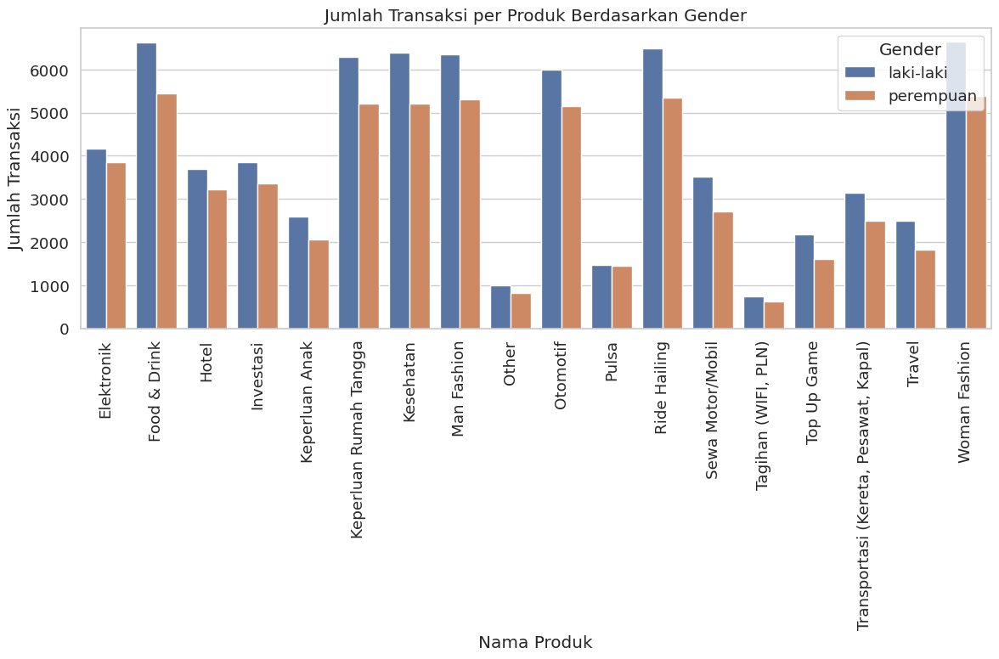

In [ ]:
# Membuat visualisasi menggunakan bar plot
plt.figure(figsize = (12, 8))
sns.barplot(data = df_grouped_kalteng, x = 'product_name', y = 'Transaction Count', hue = 'gender')
plt.title('Jumlah Transaksi per Produk Berdasarkan Gender')
plt.xlabel('Nama Produk')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation = 90)
plt.legend(title = 'Gender')
plt.tight_layout()
plt.show()

Berdasarkan grafik diatas, jenis kelamin customer di Provinsi Kalimantan Tengah didominasi oleh Laki-Laki.

### Papua Selatan

In [ ]:
df4_grouped = sample_papua.groupby(['gender', 'product_name']).size()

# Mengubah hasil pengelompokkan menjadi DataFrame
df_grouped_papua = df4_grouped.reset_index(name = 'Transaction Count')

# Menampilkan DataFrame yang telah dikelompokkan
df_grouped_papua

,gender,product_name,Transaction Count
0,laki-laki,Elektronik,4584
1,laki-laki,Food & Drink,4628
2,laki-laki,Hotel,4222
3,laki-laki,Investasi,3914
4,laki-laki,Keperluan Anak,2257
5,laki-laki,Keperluan Rumah Tangga,4440
6,laki-laki,Kesehatan,2551
7,laki-laki,Man Fashion,5429
8,laki-laki,Other,522
9,laki-laki,Otomotif,4276


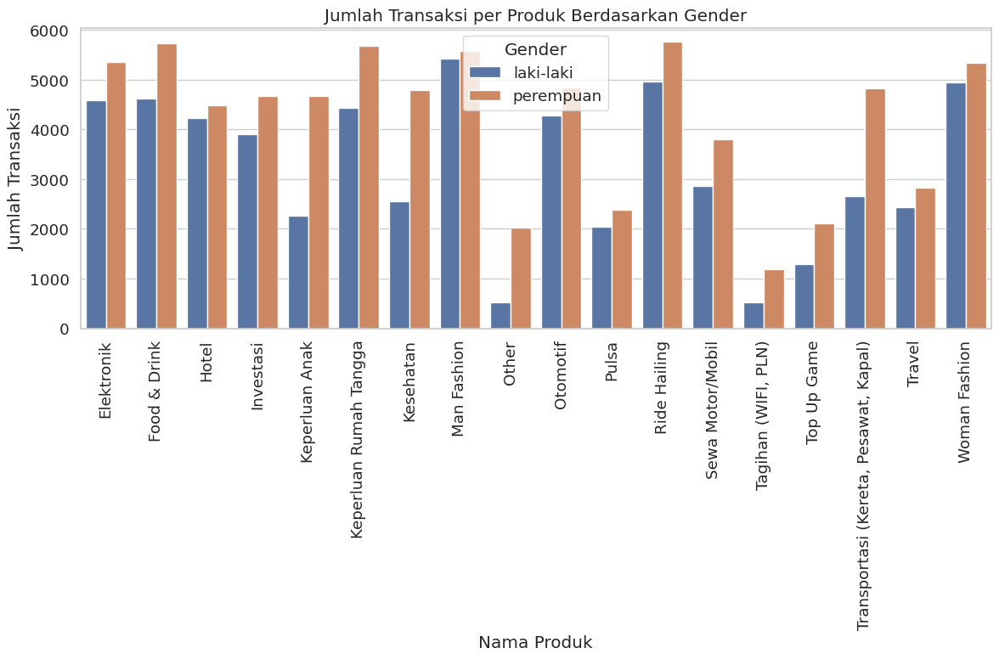

In [ ]:
# Membuat visualisasi menggunakan bar plot
plt.figure(figsize = (12, 8))
sns.barplot(data = df_grouped_papua, x = 'product_name', y = 'Transaction Count', hue = 'gender')
plt.title('Jumlah Transaksi per Produk Berdasarkan Gender')
plt.xlabel('Nama Produk')
plt.ylabel('Jumlah Transaksi')
plt.xticks(rotation = 90)
plt.legend(title = 'Gender')
plt.tight_layout()
plt.show()

Berdasarkan diatas, jenis kelamin customer di Provinsi Papua didominasi oleh Perempuan

## Produk apa saja yang paling banyak dipurchase oleh customer dan bagaimana dengan berdasarkan cluster customer

### Jawa Tengah

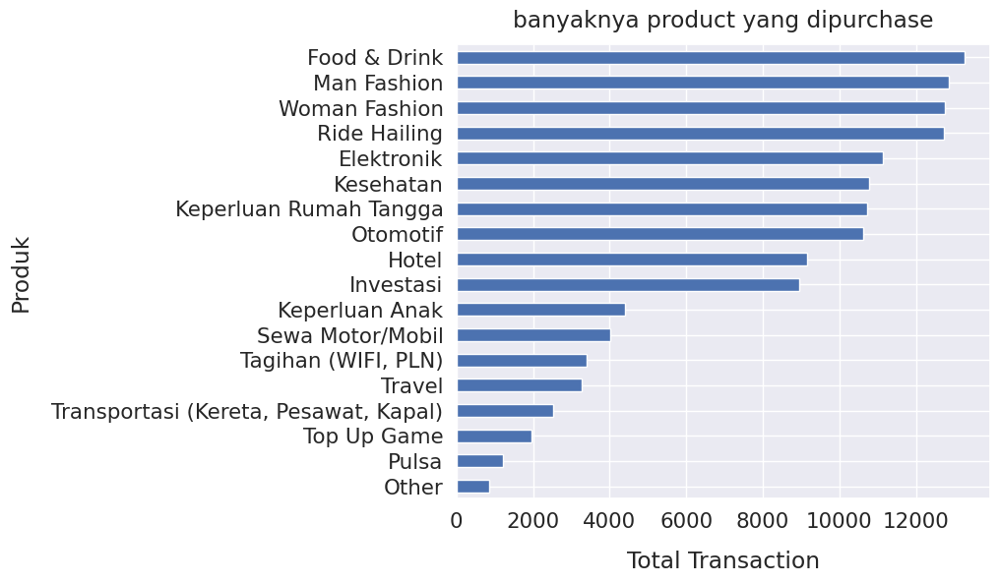

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_df1 = sample_jateng['product_name'].value_counts().sort_values(ascending = True)

month_counts_df1.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Produk", labelpad = 14)
plt.title("banyaknya product yang dipurchase", y = 1.02)
plt.show()

Top 3 produk yang dibeli oleh customer Jawa Tengah:
* Food & Drink
* Man Fashion
* Woman Fashion

### Kalimantan Selatan

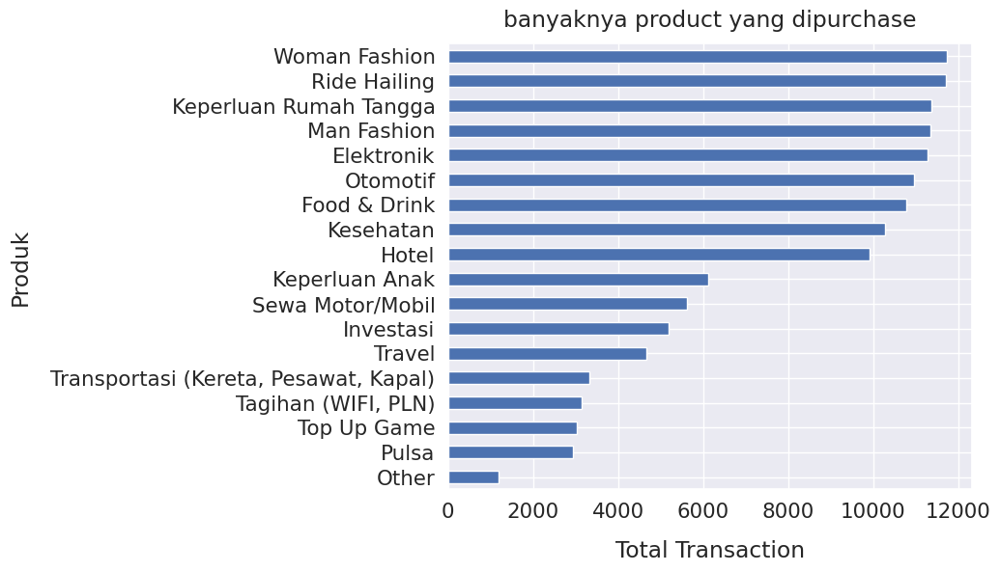

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_df2 = sample_kalsel['product_name'].value_counts().sort_values(ascending = True)

month_counts_df2.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Produk", labelpad = 14)
plt.title("banyaknya product yang dipurchase", y = 1.02)
plt.show()

Top 3 produk yang dibeli oleh customer Kalimantan Selatan:
* Woman Fashion
* Ride Hailing
* Keperluan Rumah Tangga



### Kalimantan Tengah

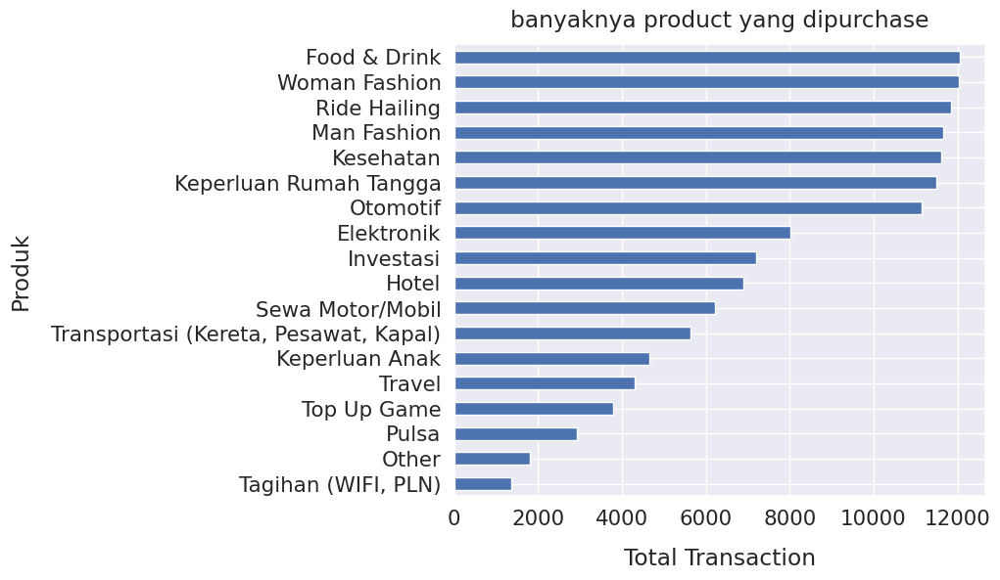

In [ ]:
sns.set(font_scale  = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_df3 = data_kalteng['product_name'].value_counts().sort_values(ascending = True)

month_counts_df3.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Produk", labelpad = 14)
plt.title("banyaknya product yang dipurchase", y = 1.02)
plt.show()

Top 3 produk yang dibeli oleh customer Kalimantan Tengah:
* Food & Drink
* Woman Fashion
* Ride Hailing

### Papua Selatan

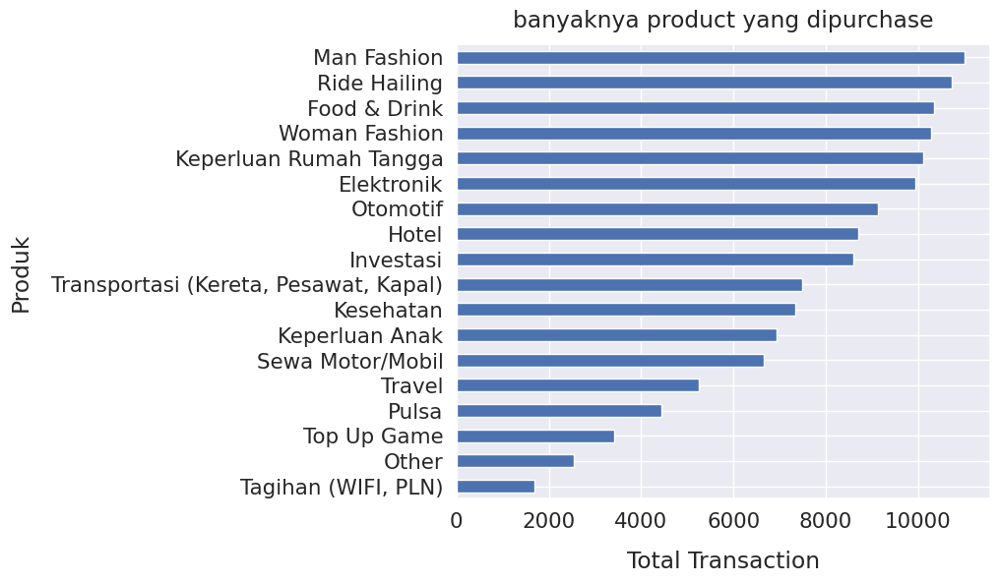

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_df4 = sample_papua['product_name'].value_counts().sort_values(ascending = True)

month_counts_df4.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Produk", labelpad = 14)
plt.title("banyaknya product yang dipurchase", y = 1.02)
plt.show()

Top 3 produk yang dibeli oleh customer Papua:
* Man Fashion
* Ride Hailing
* Food & Drink


## Pengeluaran bersih yang dikeluarkan berdasarkan kelompok umur

### Jawa Tengah

In [ ]:
# Fungsi untuk mengkategorikan usia
def categorize_age(age):
    if age <= 12:
        return 'Anak-anak'
    elif age <= 20:
        return 'Remaja'
    elif age < 55:
        return 'Dewasa'
    else:
        return 'Lanjut Usia'

# Menambahkan kolom 'age_group' ke DataFrame
sample_jateng['age_group'] = sample_jateng['age'].apply(categorize_age)

# Menampilkan Dataframe
sample_jateng.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori,age_group
765349,TRX1467531,SC3313061002008,18,11900.0,0.0,2024-06-06,"Tagihan (WIFI, PLN)",331306,JAWA TENGAH,33,...,47,0,2024-06-06,Thursday,June,2024,0.000000,0,rendah,Dewasa
1622786,TRX2345266,SC3317042001006,14,96000.0,24800.0,2024-12-24,Kesehatan,331704,JAWA TENGAH,33,...,30,1,2024-12-24,Tuesday,December,2024,25.833333,0,rendah,Dewasa
290552,TRX979243,SC3309102001002,2,121700.0,0.0,2024-11-20,Woman Fashion,330910,JAWA TENGAH,33,...,32,1,2024-11-20,Wednesday,November,2024,0.000000,0,rendah,Dewasa
2387203,TRX2683067,SC3312072003008,14,36300.0,36300.0,2024-12-23,Kesehatan,331207,JAWA TENGAH,33,...,31,1,2024-12-23,Monday,December,2024,100.000000,0,rendah,Dewasa
259391,TRX943003,SC3309052009002,15,13500.0,3700.0,2024-10-06,Investasi,330905,JAWA TENGAH,33,...,32,1,2024-10-06,Sunday,October,2024,27.407407,0,rendah,Dewasa


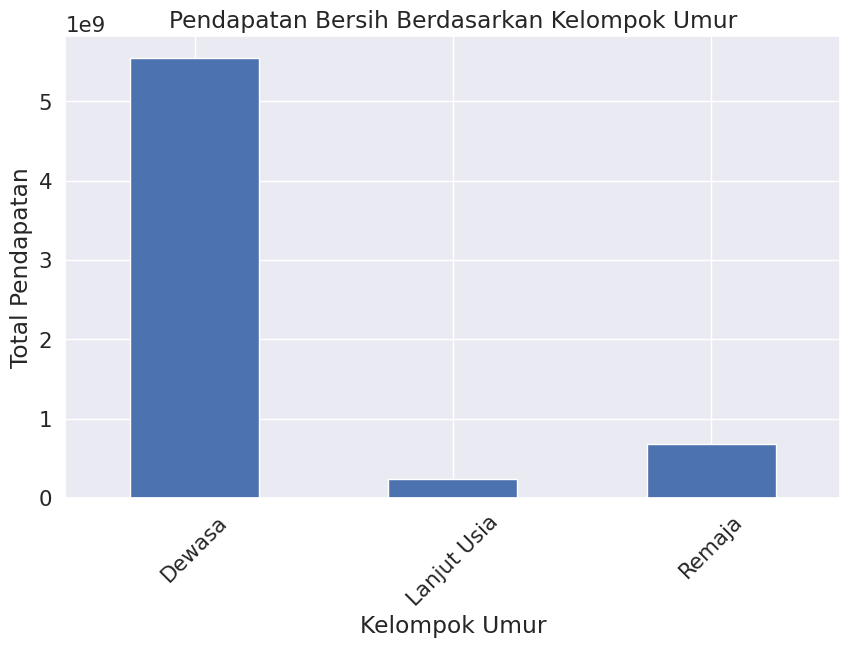

In [ ]:
income_by_age_group_df1 = sample_jateng.groupby('age_group')['pengeluaran_bersih'].sum()

# Membuat bar plot untuk menampilkan pendapatan per kelompok umur
plt.figure(figsize = (10, 6))
income_by_age_group_df1.plot(kind = 'bar')
plt.xlabel('Kelompok Umur')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan Bersih Berdasarkan Kelompok Umur')
plt.xticks(rotation = 45)
plt.show()

Terlihat bahwa segementasi customer didominasi oleh orang dewasa yang terbilang dalam usia produktif.

### Kalimantan Selatan

In [ ]:
# Fungsi untuk mengkategorikan usia
def categorize_age(age):
    if age <= 12:
        return 'Anak-anak'
    elif age <= 20:
        return 'Remaja'
    elif age < 55:
        return 'Dewasa'
    else:
        return 'Lanjut Usia'

# Menambahkan kolom 'age_group' ke DataFrame
sample_kalsel['age_group'] = sample_kalsel['age'].apply(categorize_age)

# Menampilkan Dataframe
sample_kalsel.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori,age_group
2245126,TRX539525,SC6372061003048,5,101900.0,0.0,2024-11-10,Keperluan Rumah Tangga,637206,KALIMANTAN SELATAN,63,...,34,0,2024-11-10,Sunday,November,2024,0.0,0,rendah,Dewasa
2329694,TRX627428,SC6305101007004,2,22000.0,0.0,2024-08-27,Woman Fashion,630510,KALIMANTAN SELATAN,63,...,46,1,2024-08-27,Tuesday,August,2024,0.0,0,rendah,Dewasa
2268158,TRX563217,SC6302062011007,3,3900.0,0.0,2024-04-29,Food & Drink,630206,KALIMANTAN SELATAN,63,...,23,1,2024-04-29,Monday,April,2024,0.0,0,rendah,Dewasa
2244778,TRX539177,SC6372061003036,14,14400.0,0.0,2024-03-01,Kesehatan,637206,KALIMANTAN SELATAN,63,...,16,0,2024-03-01,Friday,March,2024,0.0,0,rendah,Remaja
2296235,TRX592154,SC6310072001005,7,43000.0,0.0,2024-08-09,Keperluan Anak,631007,KALIMANTAN SELATAN,63,...,35,1,2024-08-09,Friday,August,2024,0.0,0,rendah,Dewasa


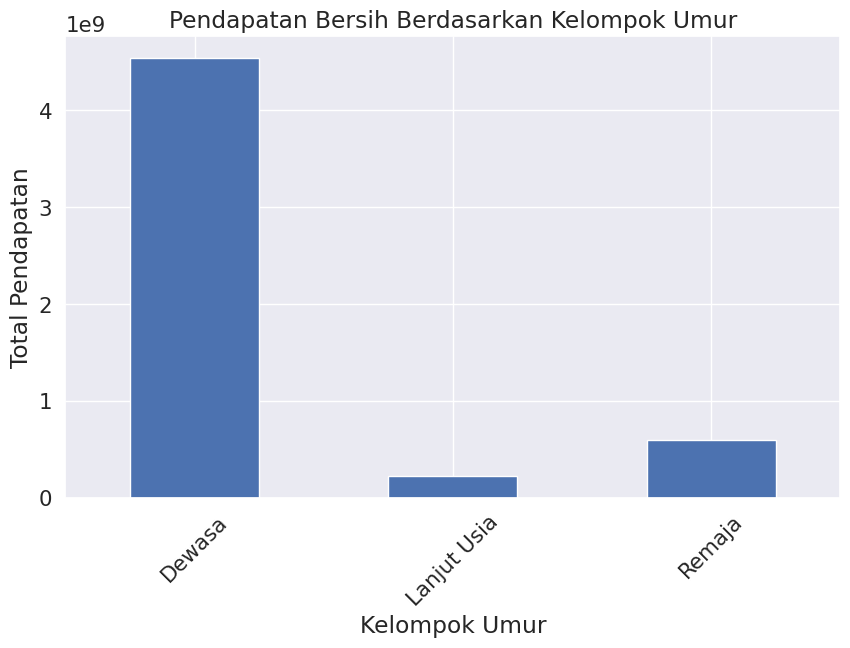

In [ ]:
income_by_age_group_df2 = sample_kalsel.groupby('age_group')['pengeluaran_bersih'].sum()

# Membuat bar plot untuk menampilkan pendapatan per kelompok umur
plt.figure(figsize = (10, 6))
income_by_age_group_df2.plot(kind = 'bar')
plt.xlabel('Kelompok Umur')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan Bersih Berdasarkan Kelompok Umur')
plt.xticks(rotation = 45)
plt.show()

Terlihat bahwa segementasi customer didominasi oleh orang dewasa yang terbilang dalam usia produktif.

### Kalimantan Tengah

In [ ]:
# Fungsi untuk mengkategorikan usia
def categorize_age(age):
    if age <= 12:
        return 'Anak-anak'
    elif age <= 20:
        return 'Remaja'
    elif age < 55:
        return 'Dewasa'
    else:
        return 'Lanjut Usia'

# Menambahkan kolom 'age_group' ke DataFrame
data_kalteng['age_group'] = data_kalteng['age'].apply(categorize_age)

# Menampilkan Dataframe
data_kalteng.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori,age_group
2037513,TRX588193,SC6204022009001,1,49500.0,0.0,2024-05-12,Man Fashion,620402,KALIMANTAN TENGAH,62,...,45,1,2024-05-12,Sunday,May,2024,0.000000,0,rendah,Dewasa
2037514,TRX588194,SC6204022009001,1,130500.0,30000.0,2024-02-03,Man Fashion,620402,KALIMANTAN TENGAH,62,...,45,1,2024-02-03,Saturday,February,2024,22.988506,0,rendah,Dewasa
2037515,TRX588195,SC6204022009001,2,88400.0,0.0,2024-01-20,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,45,1,2024-01-20,Saturday,January,2024,0.000000,0,rendah,Dewasa
2037516,TRX588196,SC6204022009001,2,51600.0,20000.0,2024-09-18,Woman Fashion,620402,KALIMANTAN TENGAH,62,...,45,1,2024-09-18,Wednesday,September,2024,38.759690,0,rendah,Dewasa
2037517,TRX588197,SC6204022009001,3,194900.0,0.0,2024-02-09,Food & Drink,620402,KALIMANTAN TENGAH,62,...,45,1,2024-02-09,Friday,February,2024,0.000000,1,tinggi,Dewasa


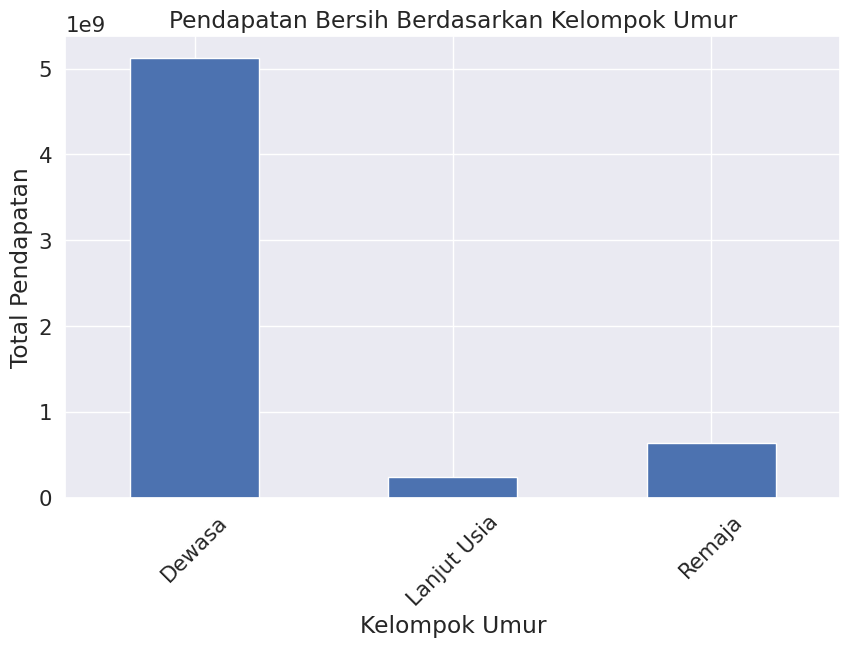

In [ ]:
income_by_age_group_df3 = data_kalteng.groupby('age_group')['pengeluaran_bersih'].sum()

# Membuat bar plot untuk menampilkan pendapatan per kelompok umur
plt.figure(figsize = (10, 6))
income_by_age_group_df3.plot(kind = 'bar')
plt.xlabel('Kelompok Umur')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan Bersih Berdasarkan Kelompok Umur')
plt.xticks(rotation = 45)
plt.show()

Terlihat bahwa segementasi customer didominasi oleh orang dewasa yang terbilang dalam usia produktif.

### Papua Selatan

In [ ]:
# Fungsi untuk mengkategorikan usia
def categorize_age(age):
    if age <= 12:
        return 'Anak-anak'
    elif age <= 20:
        return 'Remaja'
    elif age < 55:
        return 'Dewasa'
    else:
        return 'Lanjut Usia'

# Menambahkan kolom 'age_group' ke DataFrame
sample_papua['age_group'] = sample_papua['age'].apply(categorize_age)

# Menampikan Dataframe
sample_papua.head()

,id_trx,user_id,product_id,gross_amount,discounts,transaction_date,product_name,kode_kecamatan,nama_provinsi,kode_provinsi,...,age,gender_encoded,Dates,day,month,year,burn_rate,Cluster_KM,Kategori,age_group
2339914,TRX350082,SC9301062007003,4,17300.0,16100.0,2024-08-28,Ride Hailing,930106,PAPUA SELATAN,93,...,34,0,2024-08-28,Wednesday,August,2024,93.063584,0,rendah,Dewasa
2340247,TRX350410,SC9301062002005,10,3700.0,0.0,2024-10-14,"Transportasi (Kereta, Pesawat, Kapal)",930106,PAPUA SELATAN,93,...,48,0,2024-10-14,Monday,October,2024,0.000000,0,rendah,Dewasa
2337600,TRX347768,SC9301011006016,5,87400.0,0.0,2024-12-16,Keperluan Rumah Tangga,930101,PAPUA SELATAN,93,...,30,1,2024-12-16,Monday,December,2024,0.000000,0,rendah,Dewasa
2338034,TRX348185,SC9301011005030,10,3900.0,0.0,2024-03-05,"Transportasi (Kereta, Pesawat, Kapal)",930101,PAPUA SELATAN,93,...,49,0,2024-03-05,Tuesday,March,2024,0.000000,0,rendah,Dewasa
2337870,TRX348039,SC9301011005002,17,30000.0,6900.0,2024-04-09,Hotel,930101,PAPUA SELATAN,93,...,53,1,2024-04-09,Tuesday,April,2024,23.000000,0,rendah,Dewasa


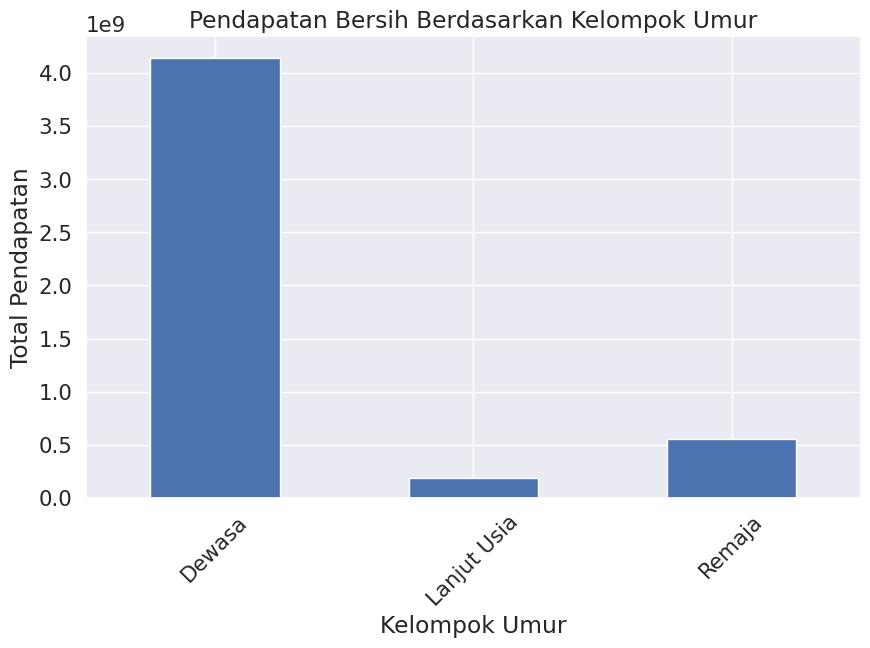

In [ ]:
income_by_age_group_df4 = sample_papua.groupby('age_group')['pengeluaran_bersih'].sum()

# Membuat bar plot untuk menampilkan pendapatan per kelompok umur
plt.figure(figsize = (10, 6))
income_by_age_group_df4.plot(kind = 'bar')
plt.xlabel('Kelompok Umur')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan Bersih Berdasarkan Kelompok Umur')
plt.xticks(rotation = 45)
plt.show()

Terlihat bahwa segementasi customer didominasi oleh orang dewasa yang terbilang dalam usia produktif.

## Product yang paling banyak dibeli oleh masing-masing cluster

### Jawa Tengah

In [ ]:
grouped_jateng = sample_jateng.groupby([ 'Kategori','product_name'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts = grouped_jateng.size()

# Ubah menjadi DataFrame
dt_jateng = pd.DataFrame(transaction_counts, columns = ['Transaction Count'])

# Reset index
dt_jateng.reset_index(inplace = True)
dt_jateng

,Kategori,product_name,Transaction Count
0,rendah,Elektronik,10638
1,rendah,Food & Drink,9655
2,rendah,Hotel,8871
3,rendah,Investasi,8865
4,rendah,Keperluan Anak,4397
5,rendah,Keperluan Rumah Tangga,10158
6,rendah,Kesehatan,10189
7,rendah,Man Fashion,11484
8,rendah,Other,853
9,rendah,Otomotif,10191


Dari dataframe diatas, produk yang banyak dibeli berdasarkan cluster di Provinsi Jawa Tengah sebagai berikut:
* kategori rendah : Woman Fashion
* kategori tinggi : Food & Drink

### Kalimantan Selatan

In [ ]:
grouped_kalsel = sample_kalsel.groupby([ 'Kategori','product_name'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts = grouped_kalsel.size()

# Ubah menjadi DataFrame
dt_kalsel = pd.DataFrame(transaction_counts, columns = ['Transaction Count'])

# Reset index
dt_kalsel.reset_index(inplace = True)
dt_kalsel

,Kategori,product_name,Transaction Count
0,rendah,Elektronik,10675
1,rendah,Food & Drink,10433
2,rendah,Hotel,9684
3,rendah,Investasi,5168
4,rendah,Keperluan Anak,6011
5,rendah,Keperluan Rumah Tangga,10152
6,rendah,Kesehatan,9713
7,rendah,Man Fashion,11126
8,rendah,Other,1192
9,rendah,Otomotif,9622


Dari dataframe diatas, produk yang banyak dibeli berdasarkan cluster di Provinsi Kalimantan Selatan adalah:
* kategori rendah : Woman Fashion
* kategori tinggi : Ride Hailing

### Kalimantan Tengah

In [ ]:
grouped_kalteng = data_kalteng.groupby([ 'Kategori','product_name'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts = grouped_kalteng.size()

# Ubah menjadi DataFrame
dt_kalteng = pd.DataFrame(transaction_counts, columns = ['Transaction Count'])

# Reset index
dt_kalteng.reset_index(inplace = True)
dt_kalteng

,Kategori,product_name,Transaction Count
0,rendah,Elektronik,7997
1,rendah,Food & Drink,9177
2,rendah,Hotel,6871
3,rendah,Investasi,7160
4,rendah,Keperluan Anak,4496
5,rendah,Keperluan Rumah Tangga,10585
6,rendah,Kesehatan,10117
7,rendah,Man Fashion,11085
8,rendah,Other,1809
9,rendah,Otomotif,10137


Dari dataframe diatas, produk yang banyak dibeli berdasarkan cluster di Provinsi Kalimantan Tengah sebagai berikut:
* kategori rendah : Man Fashion
* kategori tinggi : Food & Drink

### Papua Selatan

In [ ]:
grouped_papua = sample_papua.groupby([ 'Kategori','product_name'])

# Hitung banyaknya transaksi di setiap bulan untuk setiap kluster
transaction_counts = grouped_papua.size()

# Ubah menjadi DataFrame
dt_papua = pd.DataFrame(transaction_counts, columns = ['Transaction Count'])

# Reset index
dt_papua.reset_index(inplace=True)
dt_papua

,Kategori,product_name,Transaction Count
0,rendah,Elektronik,7148
1,rendah,Food & Drink,9537
2,rendah,Hotel,8647
3,rendah,Investasi,7847
4,rendah,Keperluan Anak,6784
5,rendah,Keperluan Rumah Tangga,5342
6,rendah,Kesehatan,7346
7,rendah,Man Fashion,9901
8,rendah,Other,2539
9,rendah,Otomotif,9129


Dari dataframe diatas, produk yang paling banyak dibeli berdasarkan cluster di Provinsi Papua Selatan yaitu:
* kategori rendah : Man Fashion
* kategori tinggi : Keperluan Rumah Tangga

## Tren transaksi di setiap bulannya

### Jawa Tengah

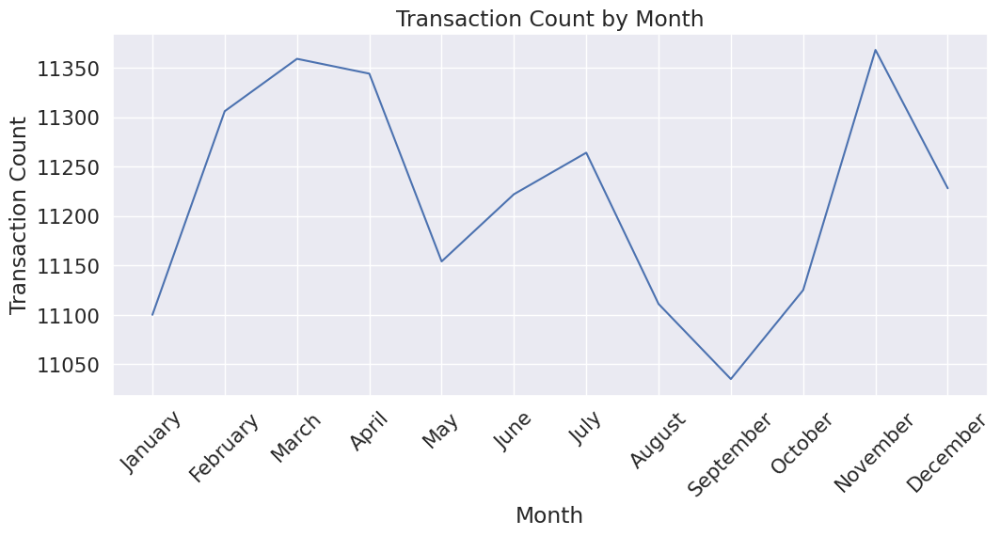

In [ ]:
# Pastikan 'month' di sample_jateng adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_jateng['month'] = pd.Categorical(sample_jateng['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah transaksi per bulan
transaction_count_by_month_jateng = sample_jateng.groupby('month').size()

# Buat plot jumlah transaksi per bulan
plt.figure(figsize = (12, 5))
plt.plot(transaction_count_by_month_jateng.index, transaction_count_by_month_jateng.values)
plt.xlabel('Month')
plt.ylabel('Transaction Count')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Transaction Count by Month')
plt.show()

Berdasarkan tren tiap bulannya, terjadi fluktuasi seperti terjadi penurunan di kuartal kedua yakni pada bulan April ke Mei. Bahkan terjadi puncak penuruannya di quartal ketiga yaitu bulan September lalu mengalami peningkatkan pesat hingga bulan November.

### Kalimantan Selatan

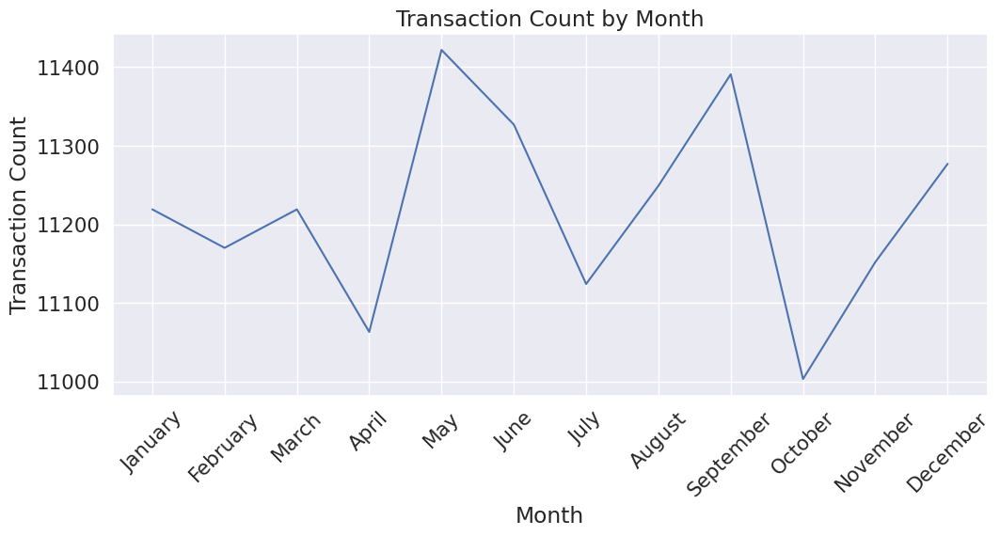

In [ ]:
# Pastikan 'month' di sample_kalsel adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_kalsel['month'] = pd.Categorical(sample_kalsel['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah transaksi per bulan
transaction_count_by_month_kalsel = sample_kalsel.groupby('month').size()

# Buat plot jumlah transaksi per bulan
plt.figure(figsize = (12, 5))
plt.plot(transaction_count_by_month_kalsel.index, transaction_count_by_month_kalsel.values)
plt.xlabel('Month')
plt.ylabel('Transaction Count')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Transaction Count by Month')
plt.show()

Berdasarkan tren tiap bulannya (grafik diatas) terjadi fluktuasi, seperti terjadi peningkatan di kuartal kedua yakni pada bulan Mei yang mana menjadi puncak transaksi terbesar pada tahun 2024. Selain itu, mengalami penurunan yang signifikan pada awal quarter keempat yaitu bulan Oktober sebelum mengalami peningkatan menjelang akhir tahun.

### Kalimantan Tengah

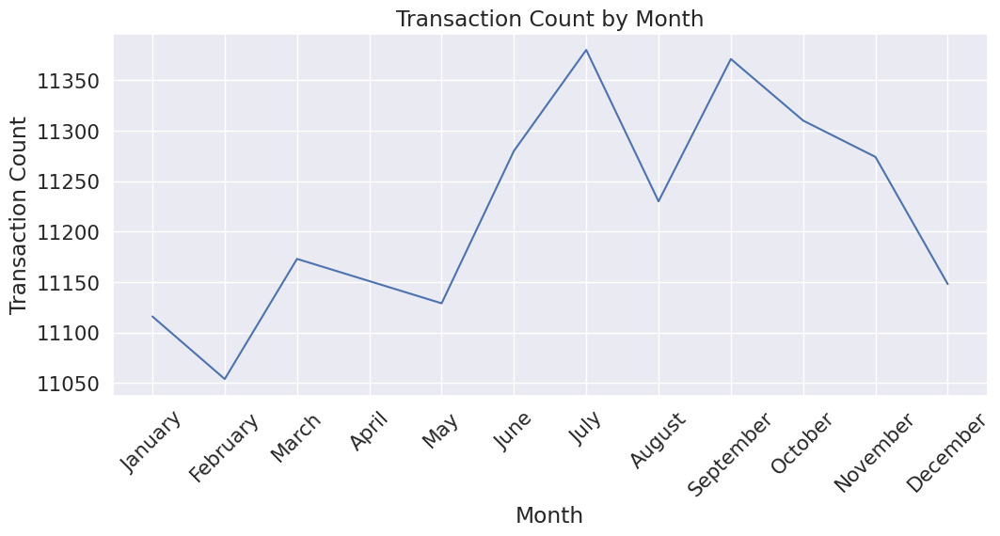

In [ ]:
# Pastikan 'month' di data_kalteng adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
data_kalteng['month'] = pd.Categorical(data_kalteng['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah transaksi per bulan
transaction_count_by_month_kalteng = data_kalteng.groupby('month').size()

# Buat plot jumlah transaksi per bulan
plt.figure(figsize = (12, 5))
plt.plot(transaction_count_by_month_kalteng.index, transaction_count_by_month_kalteng.values)
plt.xlabel('Month')
plt.ylabel('Transaction Count')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Transaction Count by Month')
plt.show()

Berdasarkan tren tiap bulannya, terjadi fluktuasi seperti terjadi penurunan di awal tahun yakni pada bulan Februari yang menjadi bulan dengan transaksi terendah lalu meningkat pada bulan selanjutnya. Bahkan terjadi puncak peningkatan di bulan Juli lalu mengalami penurunan di quarter tiga kembali menurun menjelang akhir tahun.

### Papua Selatan

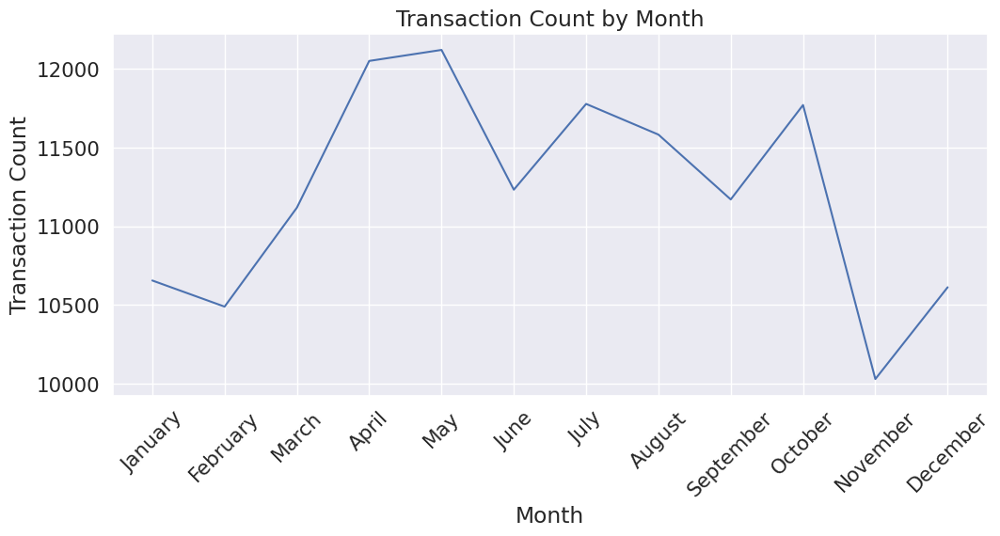

In [ ]:
# Pastikan 'month' di sample_papua adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_papua['month'] = pd.Categorical(sample_papua['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah transaksi per bulan
transaction_count_by_month_papua = sample_papua.groupby('month').size()

# Buat plot jumlah transaksi per bulan
plt.figure(figsize = (12, 5))
plt.plot(transaction_count_by_month_papua.index, transaction_count_by_month_papua.values)
plt.xlabel('Month')
plt.ylabel('Transaction Count')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Transaction Count by Month')
plt.show()

Berdasarkan tren tiap bulannya, terjadi fluktuasi seperti terjadi peningkatan di kuartal kedua yakni pada bulan Februari, Maret, dan Mei. Bahkan terjadi puncaknya di bulan Mei lalu mengalami penuruan di pertengahan tahun dan cenderung traffic mengalami penurunan menjelang akhir tahun.

## Trend akumulasi pendapatan yang diperoleh di setiap bulannya

### Jawa Tengah

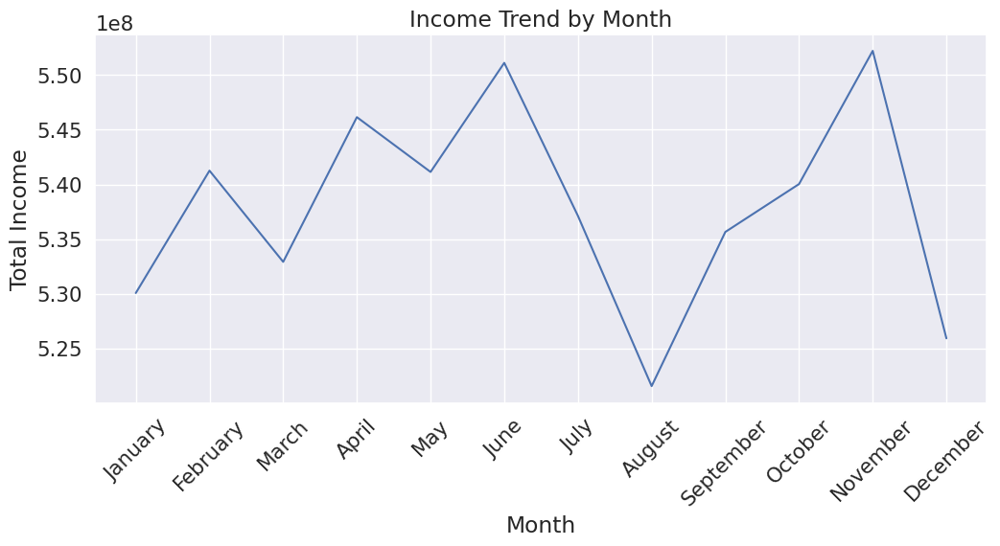

In [ ]:
# Pastikan 'month' di sample_jateng adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_jateng['month'] = pd.Categorical(sample_jateng['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah pendapatan per bulan
income_by_month_jateng = sample_jateng.groupby('month')['pengeluaran_bersih'].sum()

# Buat plot jumlah pendapatan per bulan
plt.figure(figsize = (12, 5))
plt.plot(income_by_month_jateng.index, income_by_month_jateng.values)
plt.xlabel('Month')
plt.ylabel('Total Income')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Income Trend by Month')
plt.show()

Pendapatan yang diperoleh dari bisnis tertinggi terjadi di bulan November, dimana pada bulan tersebut jumlah transaksi yang dilakukan sebanding dengan yang didapatkan yaitu sebagai puncak transaksi dan pendapatan pada tahun 2024 di perusahaan Super App.

### Kalimantan Selatan

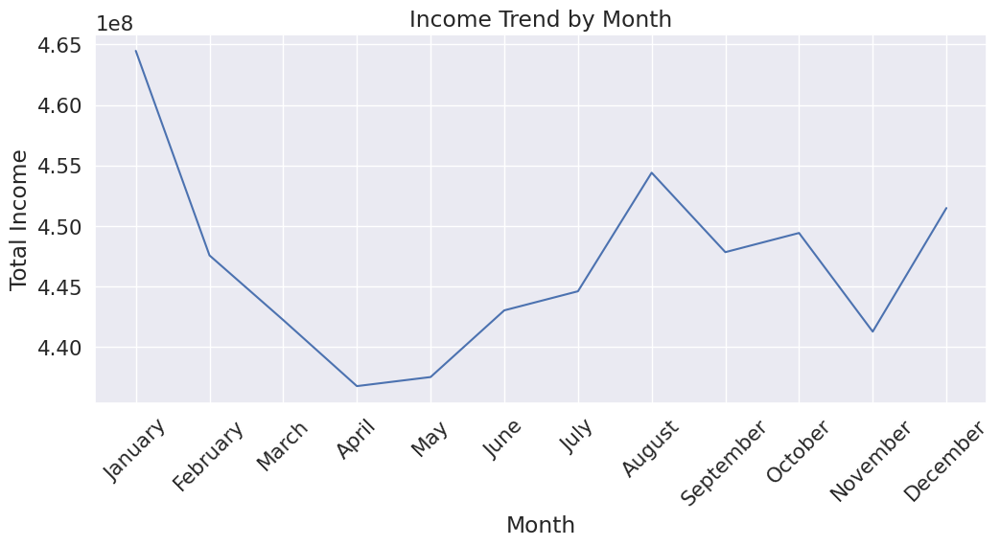

In [ ]:
# Pastikan 'month' di sample_kalsel adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_kalsel['month'] = pd.Categorical(sample_kalsel['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah pendapatan per bulan
income_by_month_kalsel = sample_kalsel.groupby('month')['pengeluaran_bersih'].sum()

# Buat plot jumlah pendapatan per bulan
plt.figure(figsize = (12, 5))
plt.plot(income_by_month_kalsel.index, income_by_month_kalsel.values)
plt.xlabel('Month')
plt.ylabel('Total Income')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Income Trend by Month')
plt.show()

Pendapatan yang diperoleh dari bisnis tertinggi terjadi di bulan Januari, meskipun banyaknya transaksi di bulan tersebut tergolong rendah. Namun, ada indikasi behavior tertentu di bulan Januari yang perlu dianalisa seperti product apa saja yang dibeli atau diskon yang diberikan di bulan Januari yang mengakibatkan pendapatan company cukup besar.

### Kalimantan Tengah

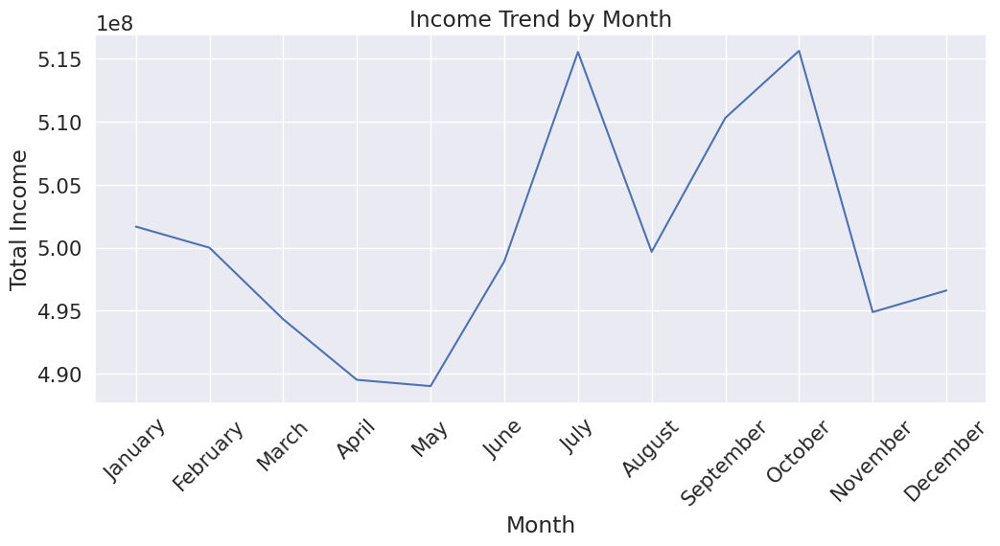

In [ ]:
# Pastikan 'month' di data_kalteng adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
data_kalteng['month'] = pd.Categorical(data_kalteng['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah pendapatan per bulan
income_by_month_kalteng = data_kalteng.groupby('month')['pengeluaran_bersih'].sum()

# Buat plot jumlah pendapatan per bulan
plt.figure(figsize = (12, 5))
plt.plot(income_by_month_kalteng.index, income_by_month_kalteng.values)
plt.xlabel('Month')
plt.ylabel('Total Income')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Income Trend by Month')
plt.show()

Pendapatan yang diperoleh dari bisnis tertinggi terjadi di bulan Juli, dimana pada bulan tersebut jumlah transaksi yang dilakukan sebanding dengan yang didapatkan yaitu sebagai puncak transaksi dan pendapatan pada tahun 2024 di perusahaan Super App.

### Papua Selatan

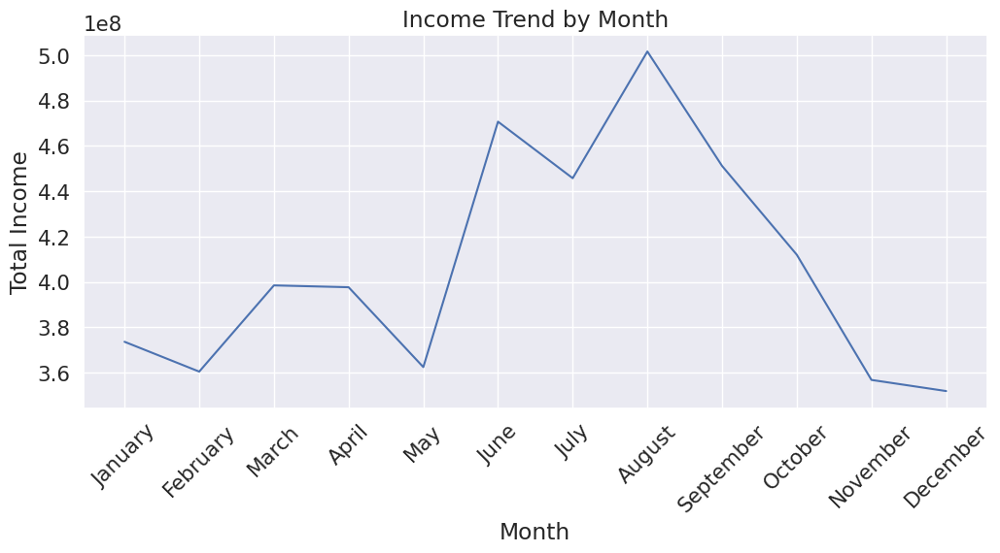

In [ ]:
# Pastikan 'month' di sample_papua adalah tipe data kategorikal dengan urutan bulan yang benar
bulan_urut = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
sample_papua['month'] = pd.Categorical(sample_papua['month'], categories = bulan_urut, ordered = True)

# Hitung jumlah pendapatan per bulan
income_by_month_papua = sample_papua.groupby('month')['pengeluaran_bersih'].sum()

# Buat plot jumlah pendapatan per bulan
plt.figure(figsize = (12, 5))
plt.plot(income_by_month_papua.index, income_by_month_papua.values)
plt.xlabel('Month')
plt.ylabel('Total Income')
plt.xticks(bulan_urut, rotation = 45)  # Set x-ticks to the ordered month names
plt.title('Income Trend by Month')
plt.show()

Pendapatan yang diperoleh dari bisnis tertinggi terjadi di bulan Agustus, meskipun banyaknya transaksi di bulan Agustus masih dalam rata rata. Namun, ada indikasi behavior tertentu di bulan Agustus yang perlu dianalisa seperti product apa saja yang dibeli di bulan agustus yang mengakibatkan pendapatan company cukup besar.

## Produk yang menghasilkan income tertinggi

### Jawa Tengah

In [ ]:
income_by_product_jateng = sample_jateng.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)
income_by_product_jateng

product_name
Food & Drink                             1.725472e+09
Ride Hailing                             8.908430e+08
Man Fashion                              8.657921e+08
Woman Fashion                            6.607375e+08
Keperluan Rumah Tangga                   4.464224e+08
Kesehatan                                4.410128e+08
Elektronik                               4.406520e+08
Otomotif                                 3.900586e+08
Hotel                                    2.712177e+08
Investasi                                1.581490e+08
Keperluan Anak                           3.689250e+07
Sewa Motor/Mobil                         3.516720e+07
Transportasi (Kereta, Pesawat, Kapal)    3.497670e+07
Tagihan (WIFI, PLN)                      2.324270e+07
Travel                                   1.660660e+07
Top Up Game                              8.500900e+06
Pulsa                                    5.425000e+06
Other                                    3.978500e+06
Name: pengeluar

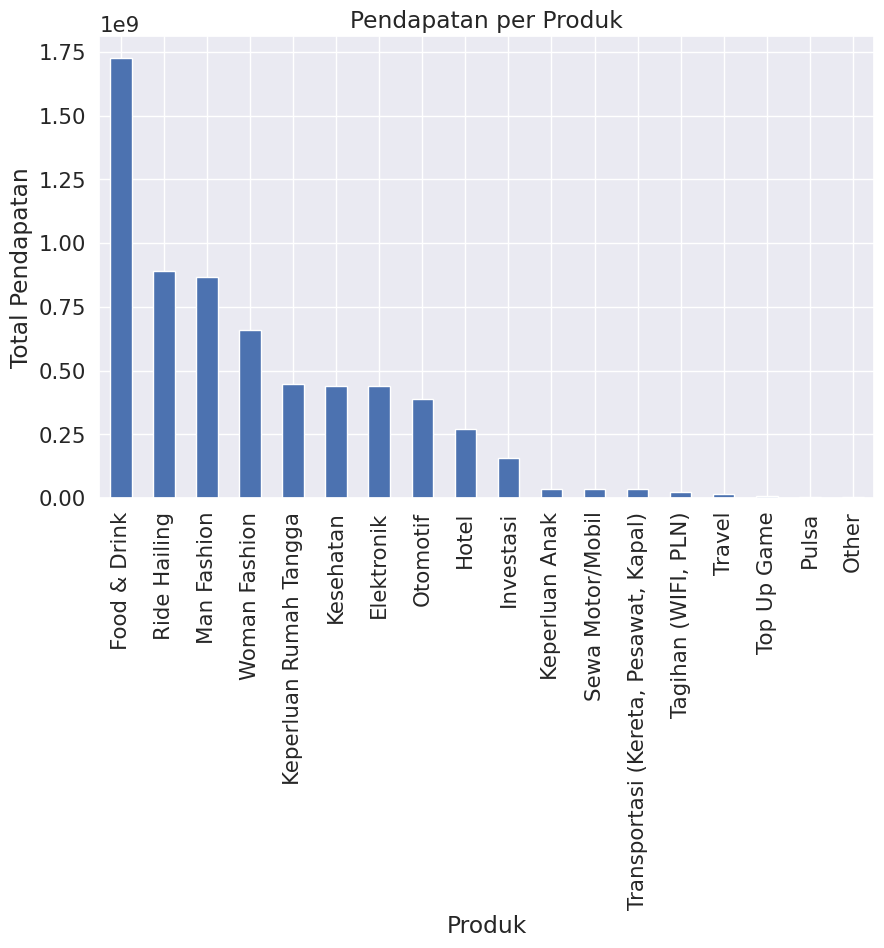

In [ ]:
#income_by_product_jateng = sample_jateng.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)

# Buat bar plot untuk menampilkan pendapatan per produk
plt.figure(figsize = (10, 6))
income_by_product_jateng.plot(kind = 'bar')
plt.xlabel('Produk')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan per Produk')
plt.show()

Akumulasi Pendapatan tertinggi dihasilkan dari produk Food & Drink, artinya Food & Drink paling laris dan paling banyak diminati oleh segmentasi customer Provinsi Jawa Tengah.

### Kalimantan Selatan

In [ ]:
income_by_product_kalsel = sample_kalsel.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)
income_by_product_kalsel

product_name
Ride Hailing                             1.228813e+09
Keperluan Rumah Tangga                   7.649905e+08
Otomotif                                 7.538531e+08
Elektronik                               5.140454e+08
Woman Fashion                            4.932665e+08
Kesehatan                                3.910611e+08
Food & Drink                             3.332813e+08
Man Fashion                              3.309950e+08
Hotel                                    2.564346e+08
Keperluan Anak                           9.181470e+07
Investasi                                4.765460e+07
Sewa Motor/Mobil                         3.754450e+07
Travel                                   2.864950e+07
Tagihan (WIFI, PLN)                      2.468330e+07
Transportasi (Kereta, Pesawat, Kapal)    2.148770e+07
Top Up Game                              1.806800e+07
Pulsa                                    1.730450e+07
Other                                    6.490600e+06
Name: pengeluar

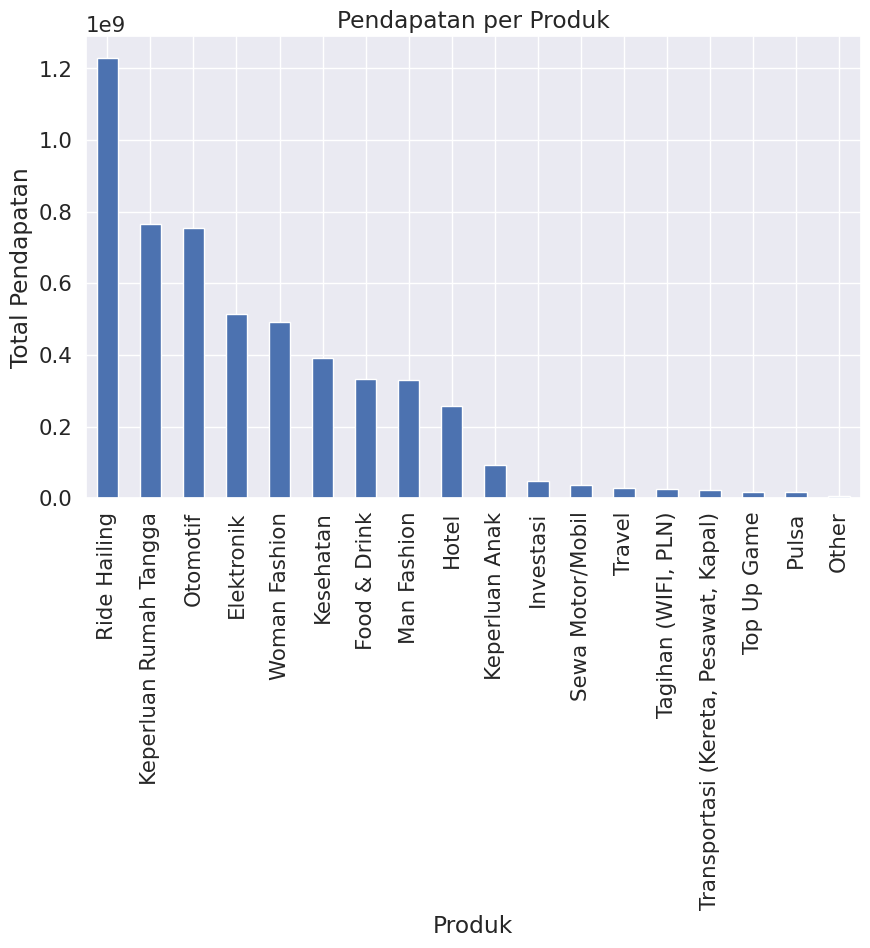

In [ ]:
#income_by_product_kalsel = sample_kalsel.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)

# Buat bar plot untuk menampilkan pendapatan per produk
plt.figure(figsize = (10, 6))
income_by_product_kalsel.plot(kind = 'bar')
plt.xlabel('Produk')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan per Produk')
plt.show()

Akumulasi Pendapatan tertinggi dihasilkan dari produk Ride Hailing, artinya Ride Hailing paling laris dan paling banyak diminati oleh segmentasi customer Provinsi Kalimantan Selatan.

### Kalimantan Tengah

In [ ]:
income_by_product_kalteng = data_kalteng.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)
income_by_product_kalteng

product_name
Food & Drink                             1.327107e+09
Ride Hailing                             8.981639e+08
Kesehatan                                8.141221e+08
Woman Fashion                            7.380073e+08
Otomotif                                 5.916811e+08
Keperluan Rumah Tangga                   5.754646e+08
Man Fashion                              4.758429e+08
Elektronik                               1.110824e+08
Sewa Motor/Mobil                         9.099890e+07
Investasi                                8.754600e+07
Keperluan Anak                           8.452390e+07
Hotel                                    7.925830e+07
Transportasi (Kereta, Pesawat, Kapal)    5.433090e+07
Travel                                   2.169650e+07
Top Up Game                              2.011930e+07
Pulsa                                    1.837800e+07
Other                                    1.042790e+07
Tagihan (WIFI, PLN)                      7.260200e+06
Name: pengeluar

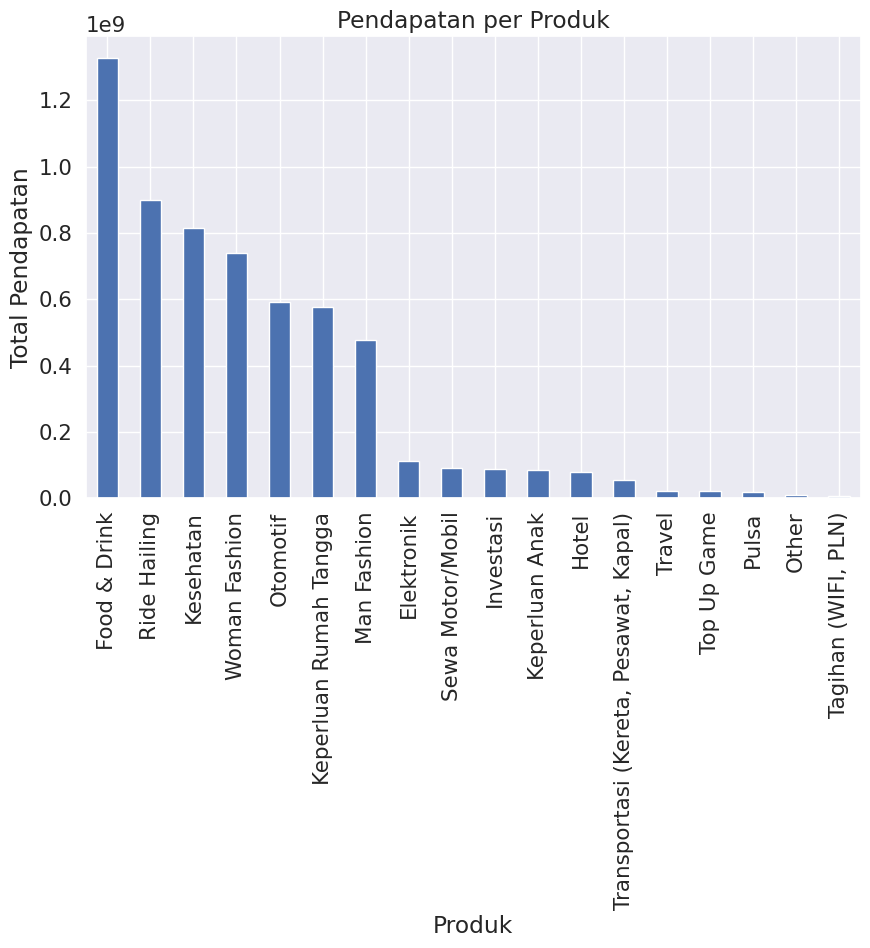

In [ ]:
#income_by_product_kalteng = data_kalteng.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)

# Buat bar plot untuk menampilkan pendapatan per produk
plt.figure(figsize = (10, 6))
income_by_product_kalteng.plot(kind = 'bar')
plt.xlabel('Produk')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan per Produk')
plt.show()

Akumulasi Pendapatan tertinggi dihasilkan dari produk Food & Drink, artinya Food & Drink paling laris dan paling banyak diminati oleh segmentasi customer Provinsi Kalimantan Tengah.

### Papua Selatan

In [ ]:
income_by_product_papua = sample_papua.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)
income_by_product_papua

product_name
Keperluan Rumah Tangga                   1.321635e+09
Elektronik                               8.449493e+08
Ride Hailing                             5.059736e+08
Man Fashion                              5.043931e+08
Food & Drink                             4.177299e+08
Woman Fashion                            3.494447e+08
Investasi                                2.765077e+08
Keperluan Anak                           1.298215e+08
Hotel                                    1.092820e+08
Otomotif                                 9.256370e+07
Sewa Motor/Mobil                         8.064640e+07
Kesehatan                                7.249810e+07
Transportasi (Kereta, Pesawat, Kapal)    6.895610e+07
Travel                                   4.045640e+07
Pulsa                                    2.652500e+07
Top Up Game                              2.157070e+07
Other                                    1.157390e+07
Tagihan (WIFI, PLN)                      8.199500e+06
Name: pengeluar

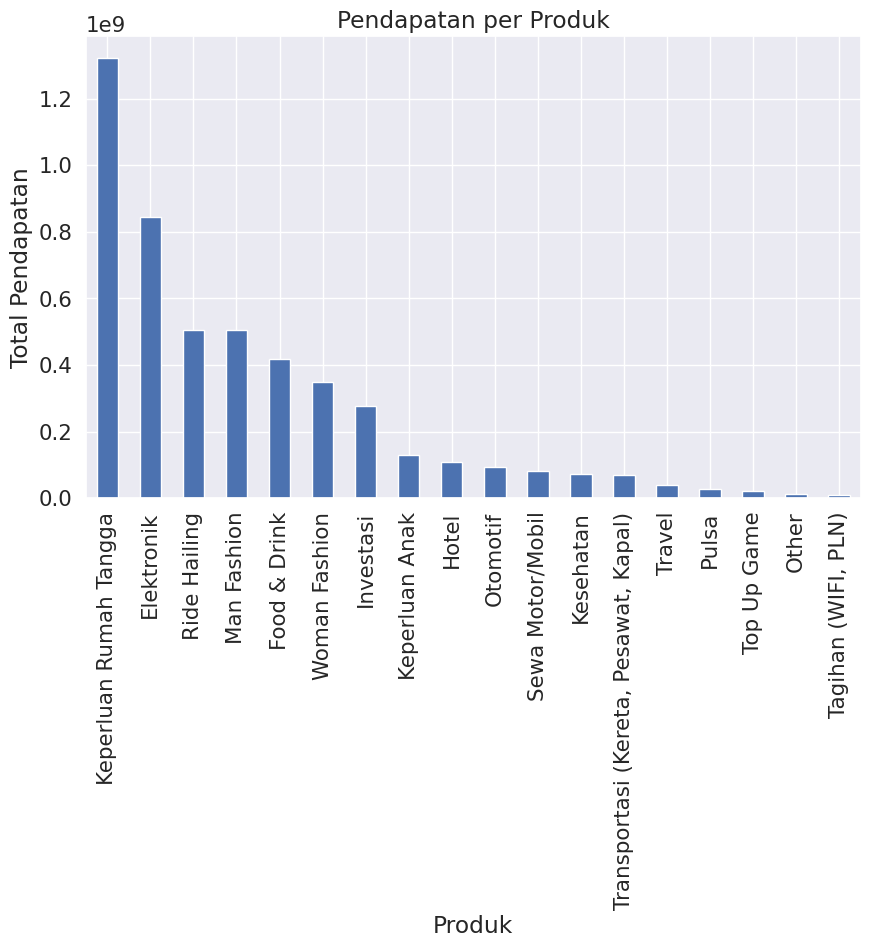

In [ ]:
#income_by_product_papua = sample_papua.groupby('product_name')['pengeluaran_bersih'].sum().sort_values(ascending = False)

# Buat bar plot untuk menampilkan pendapatan per produk
plt.figure(figsize = (10, 6))
income_by_product_papua.plot(kind = 'bar')
plt.xlabel('Produk')
plt.ylabel('Total Pendapatan')
plt.title('Pendapatan per Produk')
plt.show()

Akumulasi Pendapatan tertinggi dihasilkan dari produk keperluan rumah tangga, artinya keperluan rumah tangga paling laris dan paling banyak diminati oleh segmentasi customer Provinsi Papua.

## Traffic transaction per day

### Jawa Tengah

Text(0.5, 1.02, 'Traffic per Day')

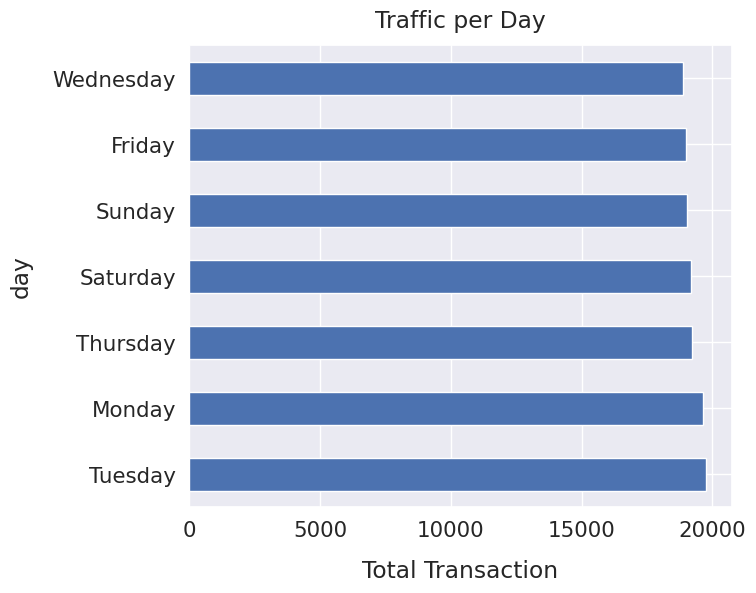

In [ ]:
sns.set(font_scale = 1.4)
sample_jateng['day'].value_counts().plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("day", labelpad = 14)
plt.title("Traffic per Day", y = 1.02)

Hari Selasa menjadi hari yang paling sibuk traffic karena total transaksinya menjadi yang tertinggi meskipun secara sekilas setiap harinya tidak memiliki perbedaan yang signifikan.

### Kalimantan Selatan

Text(0.5, 1.02, 'Traffic per Day')

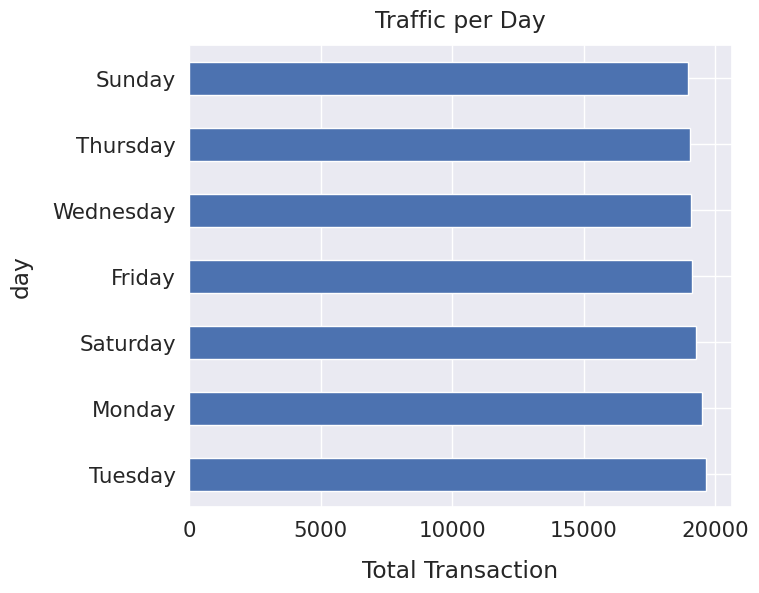

In [ ]:
sns.set(font_scale = 1.4)
sample_kalsel['day'].value_counts().plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("day", labelpad = 14)
plt.title("Traffic per Day", y = 1.02)

Hari selasa menjadi hari yang paling sibuk traffic karena total transaksinya menjadi yang tertinggi meskipun secara sekilas setiap harinya tidak memiliki perbedaan yang signifikan.

### Kalimantan Tengah

Text(0.5, 1.02, 'Traffic per Day')

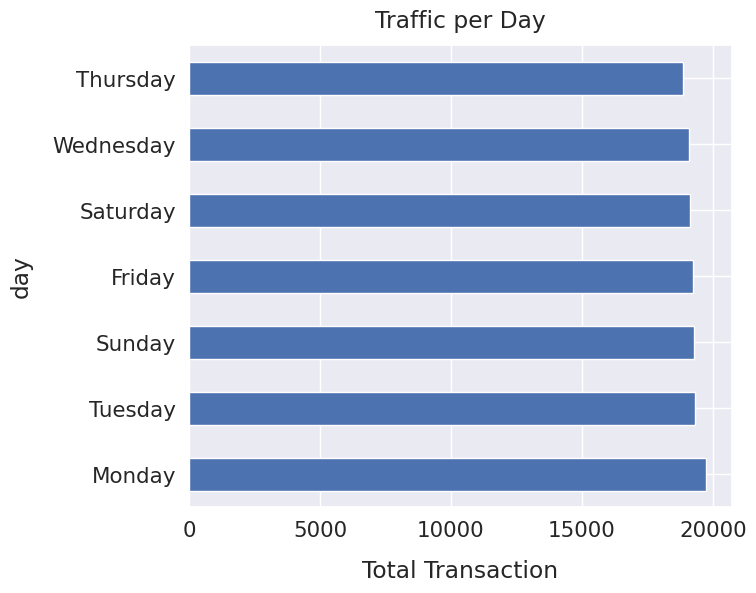

In [ ]:
sns.set(font_scale = 1.4)
data_kalteng['day'].value_counts().plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("day", labelpad = 14)
plt.title("Traffic per Day", y = 1.02)

Hari senin menjadi hari yang paling sibuk traffic karena total transaksinya menjadi yang tertinggi meskipun secara sekilas setiap harinya agak tidak memiliki jauh perbedaan yang signifikan.

### Papua Selatan

Text(0.5, 1.02, 'Traffic per Day')

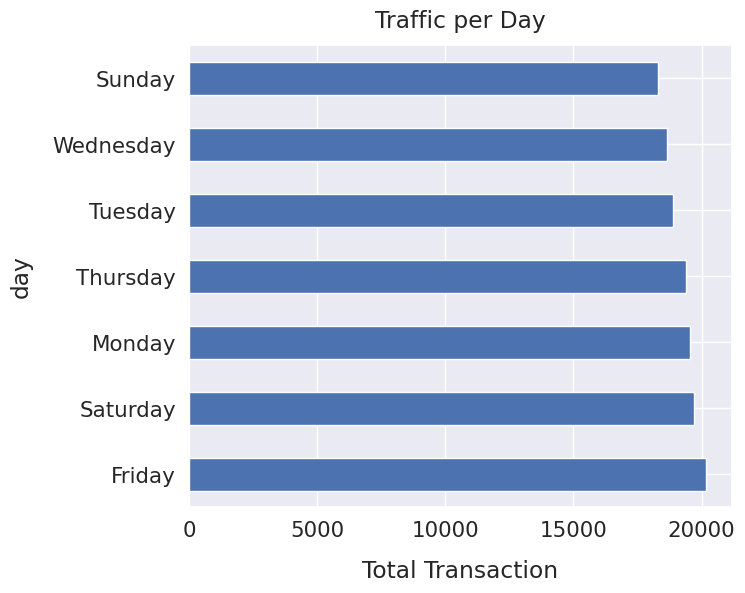

In [ ]:
sns.set(font_scale = 1.4)
sample_papua['day'].value_counts().plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("day", labelpad = 14)
plt.title("Traffic per Day", y = 1.02)

Hari jumat menjadi hari yang paling sibuk traffic karena total transaksinya menjadi yang tertinggi. Meskipun secara sekilas setiap harinya agak tidak memiliki jauh perbedaan yang signifikan.

## Distribusi banyaknya transaksi di setiap bulannya

### Jawa Tengah

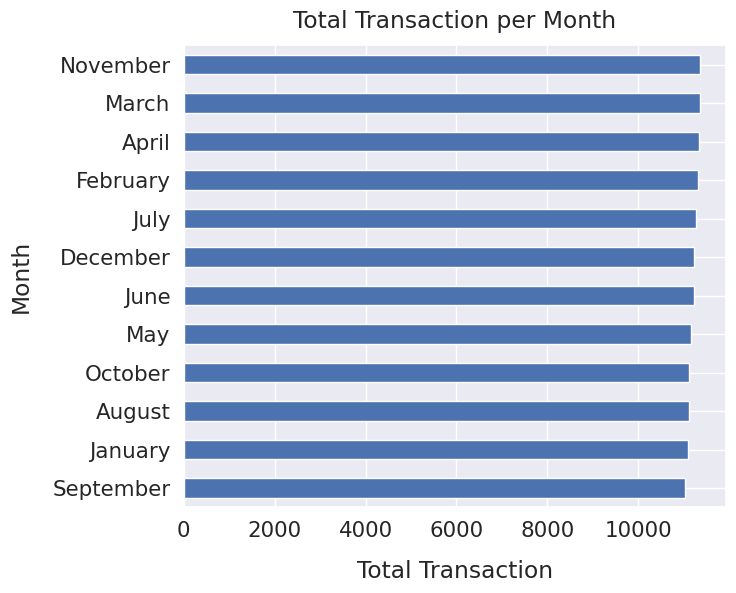

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_jateng = sample_jateng['month'].value_counts().sort_values(ascending = True)

month_counts_jateng.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Month", labelpad = 14)
plt.title("Total Transaction per Month", y = 1.02)
plt.show()

Puncak Transaksi: Bulan November menunjukkan jumlah transaksi tertinggi dengan jumlah tranksaksi melebihi 10.000 yang menandakan periode paling sibuk.

### Kalimantan Selatan

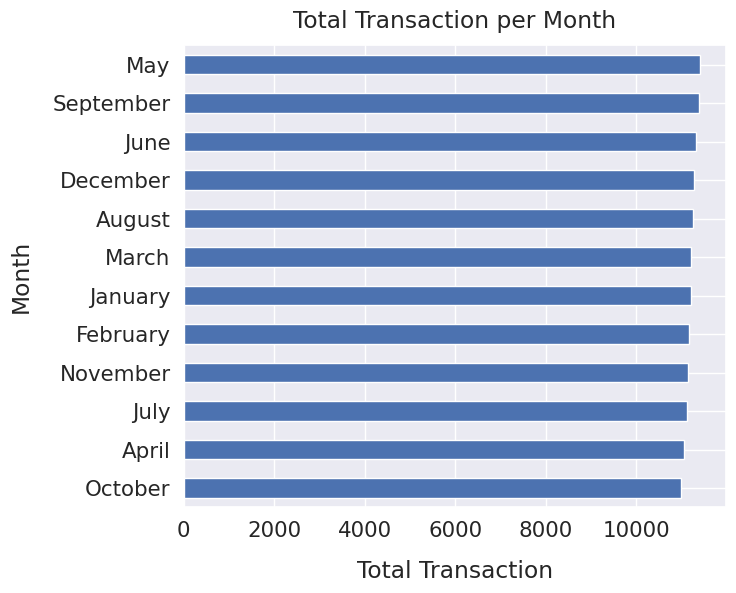

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_kalsel = sample_kalsel['month'].value_counts().sort_values(ascending = True)

month_counts_kalsel.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Month", labelpad = 14)
plt.title("Total Transaction per Month", y = 1.02)
plt.show()

Puncak Transaksi: Bulan Mei menunjukkan jumlah transaksi tertinggi dengan jumlah tranksaksi melebihi 10.000 yang menandakan periode paling sibuk.

### Kalimantan Tengah

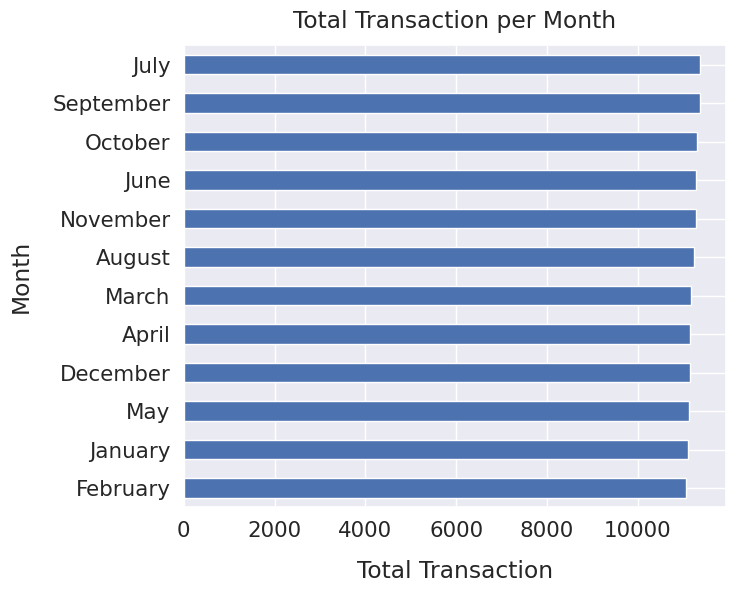

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_kalteng = data_kalteng['month'].value_counts().sort_values(ascending = True)

month_counts_kalteng.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Month", labelpad = 14)
plt.title("Total Transaction per Month", y = 1.02)
plt.show()

Puncak Transaksi: Bulan Juli menunjukkan jumlah transaksi tertinggi dengan jumlah tranksaksi melebihi 12.000 yang menandakan periode paling sibuk.

### Papua Selatan

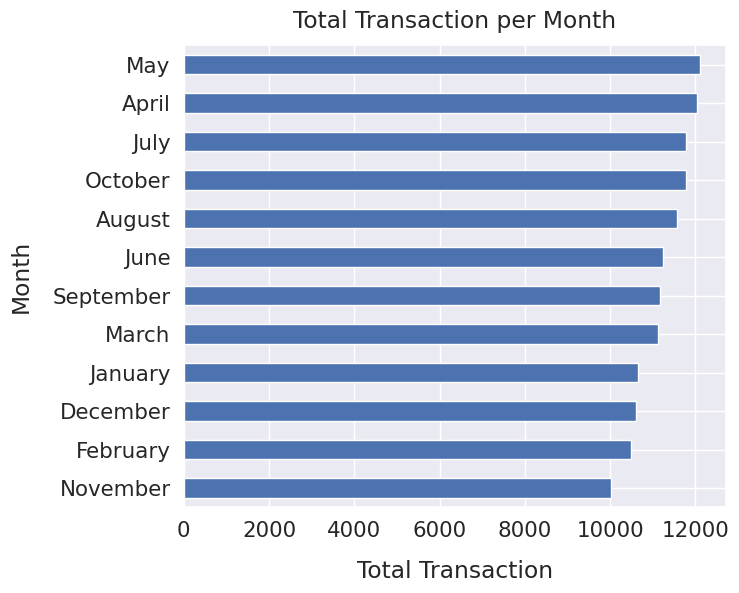

In [ ]:
sns.set(font_scale = 1.4)

# Hitung frekuensi setiap bulan dan urutkan berdasarkan jumlah transaksi
month_counts_papua = sample_papua['month'].value_counts().sort_values(ascending = True)

month_counts_papua.plot(kind = 'barh', figsize = (7, 6), rot = 0)
plt.xlabel("Total Transaction", labelpad = 14)
plt.ylabel("Month", labelpad = 14)
plt.title("Total Transaction per Month", y = 1.02)
plt.show()

Puncak Transaksi: Bulan Mei menunjukkan jumlah transaksi tertinggi dengan jumlah tranksaksi mendekati 12.000 yang menandakan periode paling sibuk.

## Melihat pada tanggal berapa banyak terjadinya transaksi

### Jawa Tengah

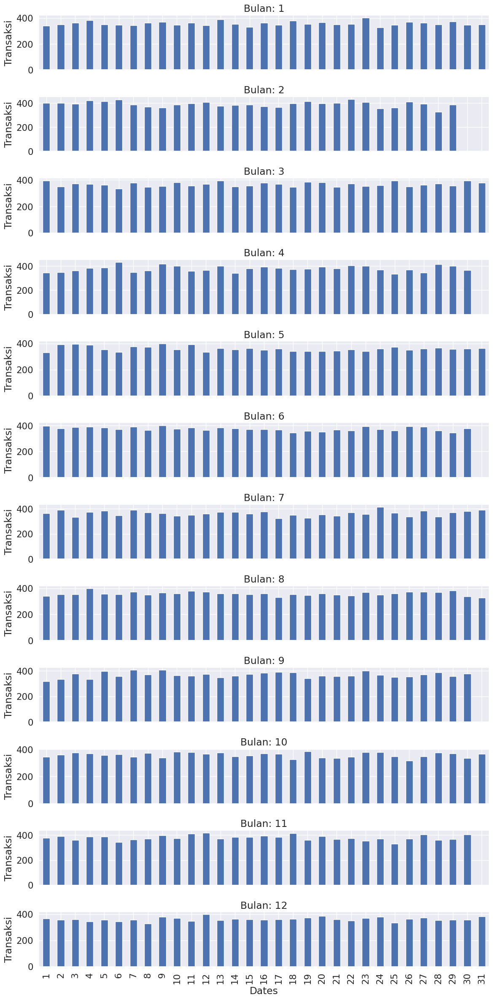

In [ ]:
sample_jateng['Dates'] = pd.to_datetime(sample_jateng['Dates'])

# Mengatur 'Dates' sebagai index
sample_jateng.set_index('Dates', inplace = True)

# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
    # Filter data untuk bulan tertentu
    monthly_data_jateng = sample_jateng[sample_jateng.index.month == i+1]

    # Group data berdasarkan tanggal dan hitung jumlah transaksi
    daily_transaction_counts_jateng = monthly_data_jateng.groupby(monthly_data_jateng.index.day).size()

    # Buat bar plot
    daily_transaction_counts_jateng.plot(kind = 'bar', ax = ax)

    # Set judul untuk subplot
    ax.set_title(f'Bulan: {i+1}')
    ax.set_ylabel('Transaksi')

plt.tight_layout()

### Kalimantan Selatan

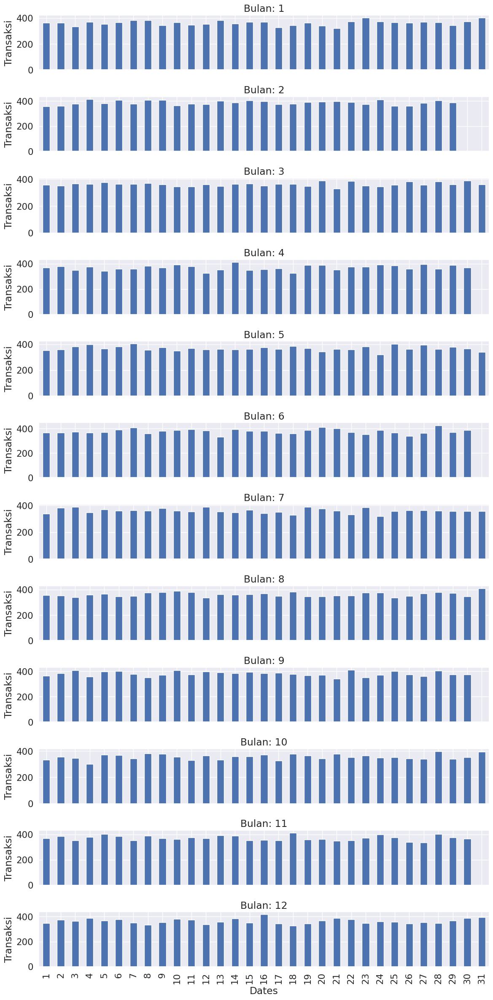

In [ ]:
sample_kalsel['Dates'] = pd.to_datetime(sample_kalsel['Dates'])

# Mengatur 'Dates' sebagai index
sample_kalsel.set_index('Dates', inplace = True)

# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
    # Filter data untuk bulan tertentu
    monthly_data_kalsel = sample_kalsel[sample_kalsel.index.month == i+1]

    # Group data berdasarkan tanggal dan hitung jumlah transaksi
    daily_transaction_counts_kalsel = monthly_data_kalsel.groupby(monthly_data_kalsel.index.day).size()

    # Buat bar plot
    daily_transaction_counts_kalsel.plot(kind = 'bar', ax = ax)

    # Set judul untuk subplot
    ax.set_title(f'Bulan: {i+1}')
    ax.set_ylabel('Transaksi')

plt.tight_layout()

### Kalimantan Tengah

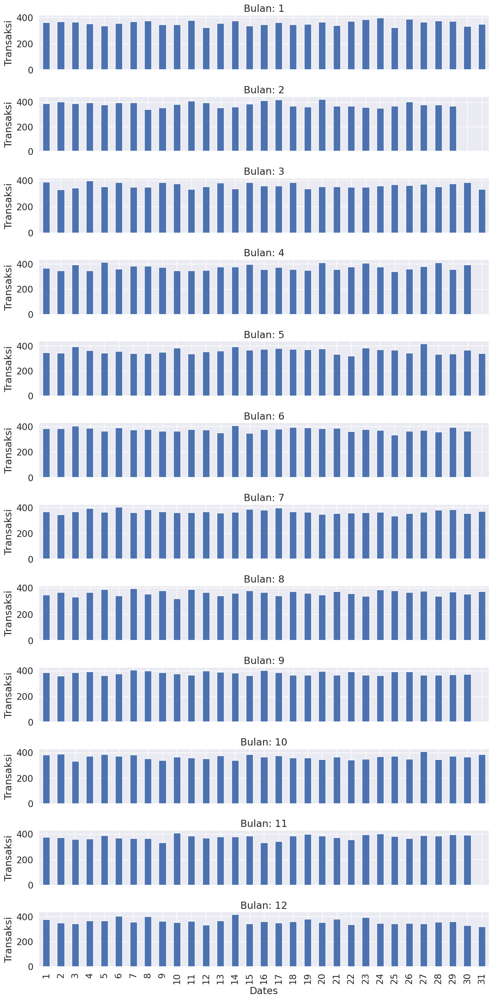

In [ ]:
data_kalteng['Dates'] = pd.to_datetime(data_kalteng['Dates'])

# Mengatur 'Dates' sebagai index
data_kalteng.set_index('Dates', inplace = True)

# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
    # Filter data untuk bulan tertentu
    monthly_data_kalteng = data_kalteng[data_kalteng.index.month == i+1]

    # Group data berdasarkan tanggal dan hitung jumlah transaksi
    daily_transaction_counts_kalteng = monthly_data_kalteng.groupby(monthly_data_kalteng.index.day).size()

    # Buat bar plot
    daily_transaction_counts_kalteng.plot(kind = 'bar', ax = ax)

    # Set judul untuk subplot
    ax.set_title(f'Bulan: {i+1}')
    ax.set_ylabel('Transaksi')

plt.tight_layout()

### Papua Selatan

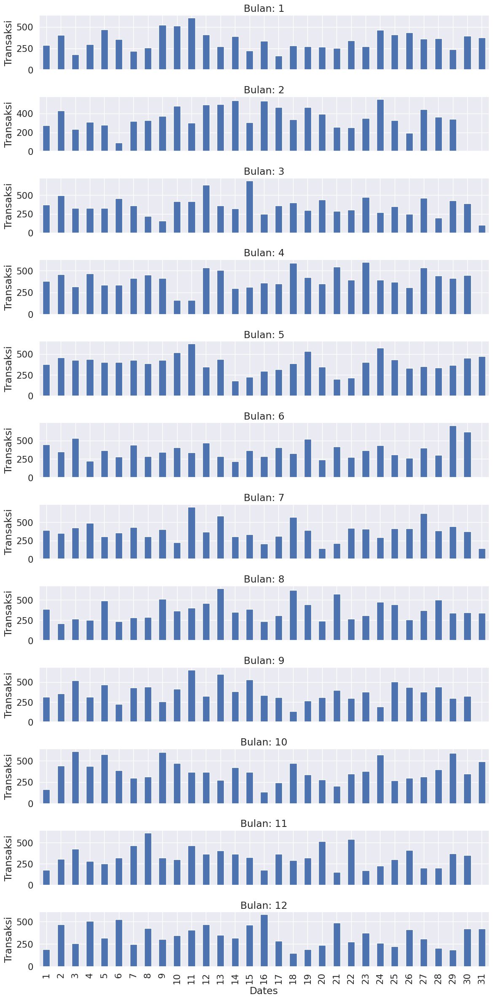

In [ ]:
sample_papua['Dates'] = pd.to_datetime(sample_papua['Dates'])

# Mengatur 'Dates' sebagai index
sample_papua.set_index('Dates', inplace = True)

# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
    # Filter data untuk bulan tertentu
    monthly_data_papua = sample_papua[sample_papua.index.month == i+1]

    # Group data berdasarkan tanggal dan hitung jumlah transaksi
    daily_transaction_counts_papua = monthly_data_papua.groupby(monthly_data_papua.index.day).size()

    # Buat bar plot
    daily_transaction_counts_papua.plot(kind = 'bar', ax = ax)

    # Set judul untuk subplot
    ax.set_title(f'Bulan: {i+1}')
    ax.set_ylabel('Transaksi')

plt.tight_layout()

## Perbandingan distribusi pengeluaran berdasarkan gender customer

### Jawa Tengah

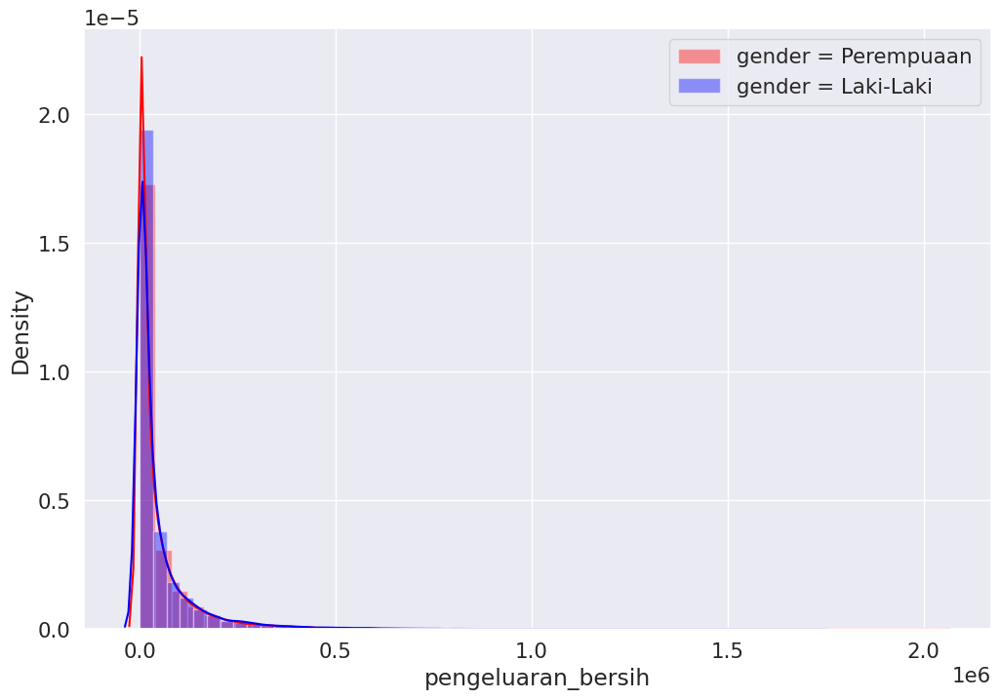

In [ ]:
plt.figure(figsize = (12,8))
sns.distplot(sample_jateng.loc[sample_jateng['gender']=='perempuan', 'pengeluaran_bersih'], color = 'red', label = 'gender = Perempuaan')
sns.distplot(sample_jateng.loc[sample_jateng['gender']=='laki-laki', 'pengeluaran_bersih'], color = 'blue', label = 'gender = Laki-Laki')
plt.legend()

*Berdasarkan hasil diatas, distribusi pengeluaran bersih kedua gender tak terlalu signifikan perbedaannya, terdapat kemiripan karateristik sehingga dapat dikatakan hampir serupa. Meskipun penngeluaran perempuan cenderung lebih tinggi sedikit dibandingkan laki-laki.*

### Kalimantan Selatan

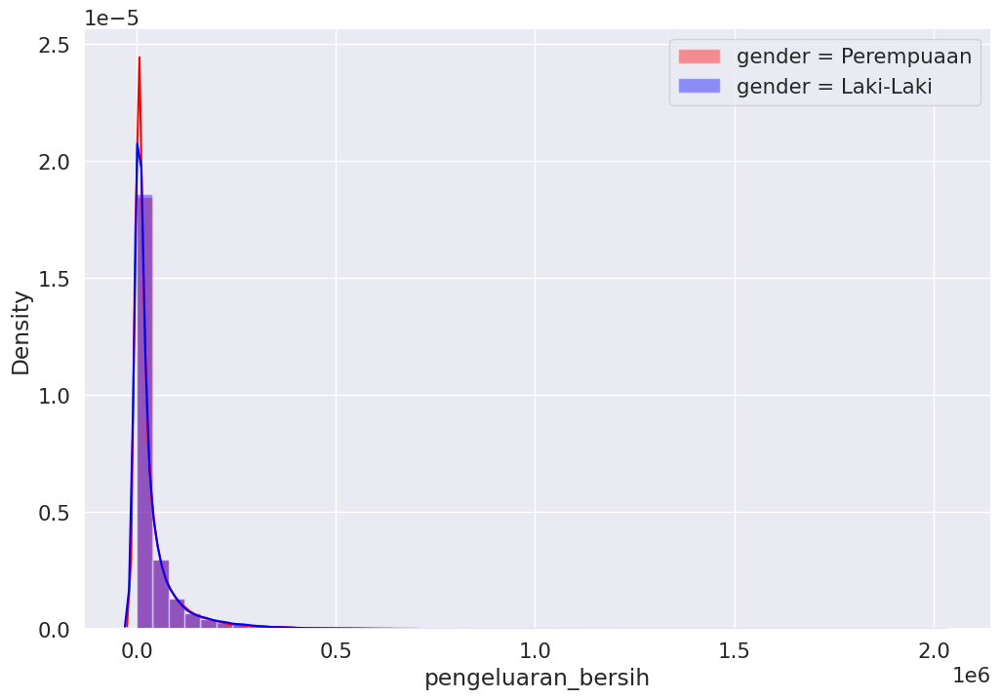

In [ ]:
plt.figure(figsize = (12,8))
sns.distplot(sample_kalsel.loc[sample_kalsel['gender']=='perempuan', 'pengeluaran_bersih'], color = 'red', label = 'gender = Perempuaan')
sns.distplot(sample_kalsel.loc[sample_kalsel['gender']=='laki-laki', 'pengeluaran_bersih'], color = 'blue', label = 'gender = Laki-Laki')
plt.legend()

*Berdasarkan hasil diatas, distribusi pengeluarn bersih kedua gender tak teerlalu signifikan perbedaannya, terdapat kemiripan karateristik sehingga dapat dikatakan hampir serupa. Meskipun penngeluaran perempuan cenderung lebih tinggi sedikit dibandingkan laki-laki.*

### Kalimantan Tengah

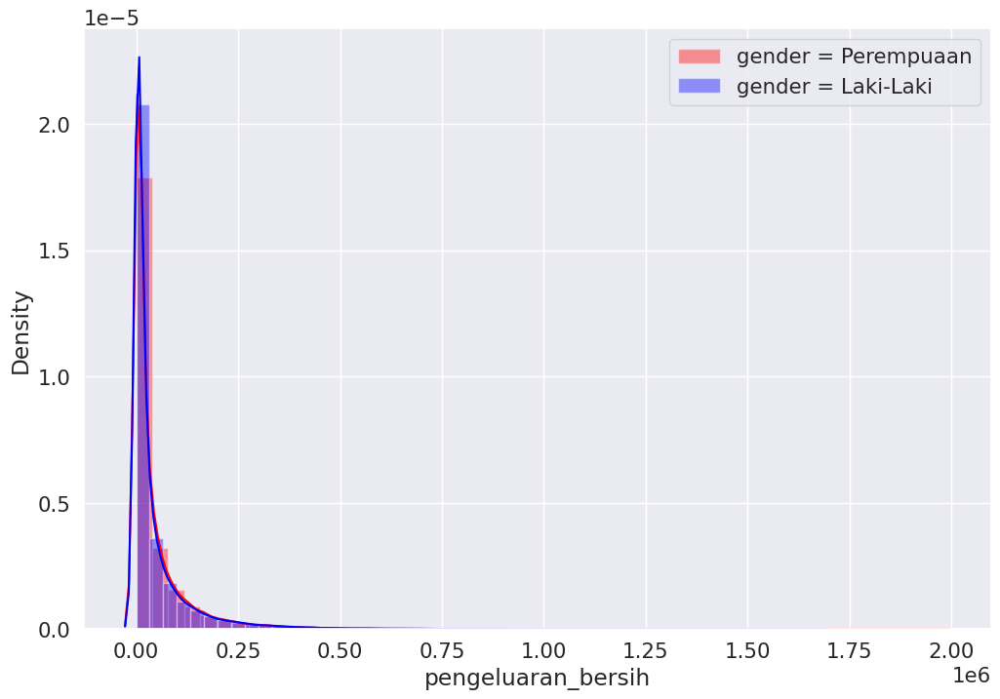

In [ ]:
plt.figure(figsize = (12,8))
sns.distplot(data_kalteng.loc[data_kalteng['gender']=='perempuan', 'pengeluaran_bersih'], color = 'red', label = 'gender = Perempuaan')
sns.distplot(data_kalteng.loc[data_kalteng['gender']=='laki-laki', 'pengeluaran_bersih'], color = 'blue', label = 'gender = Laki-Laki')
plt.legend()

*Berdasarkan hasil diatas, distribusi pengeluarn bersih kedua gender tak teerlalu signifikan perbedaannya, terdapat kemiripan karateristik sehingga dapat dikatakan hampir serupa. Meskipun penngeluaran perempuan cenderung lebih tinggi sedikit dibandingkan laki-laki.*

### Papua Selatan

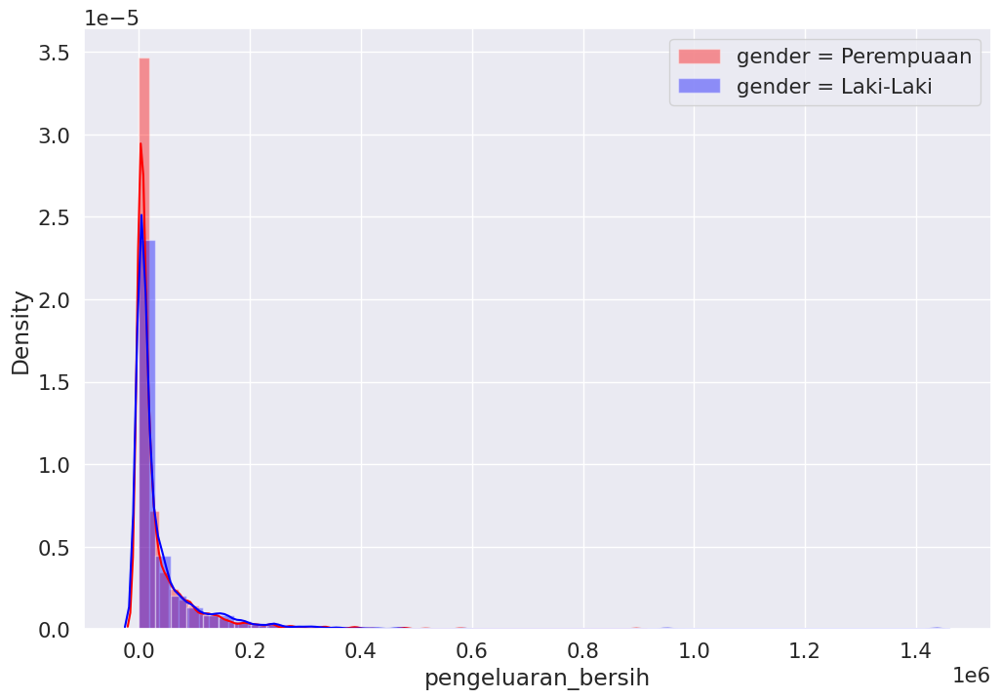

In [ ]:
plt.figure(figsize = (12,8))
sns.distplot(sample_papua.loc[sample_papua['gender']=='perempuan', 'pengeluaran_bersih'], color = 'red', label = 'gender = Perempuaan')
sns.distplot(sample_papua.loc[sample_papua['gender']=='laki-laki', 'pengeluaran_bersih'], color = 'blue', label = 'gender = Laki-Laki')
plt.legend()

Berdasarkan hasil diatas, distribusi pengeluaran bersih kedua gender tak terlalu signifikan perbedaannya, terdapat kemiripan karateristik sehingga dapat dikatakan hampir serupa. Meskipun penngeluaran perempuan cenderung lebih tinggi sedikit dibandingkan laki-laki.

## Income tiap kabupaten per cluster

### Jawa Tengah

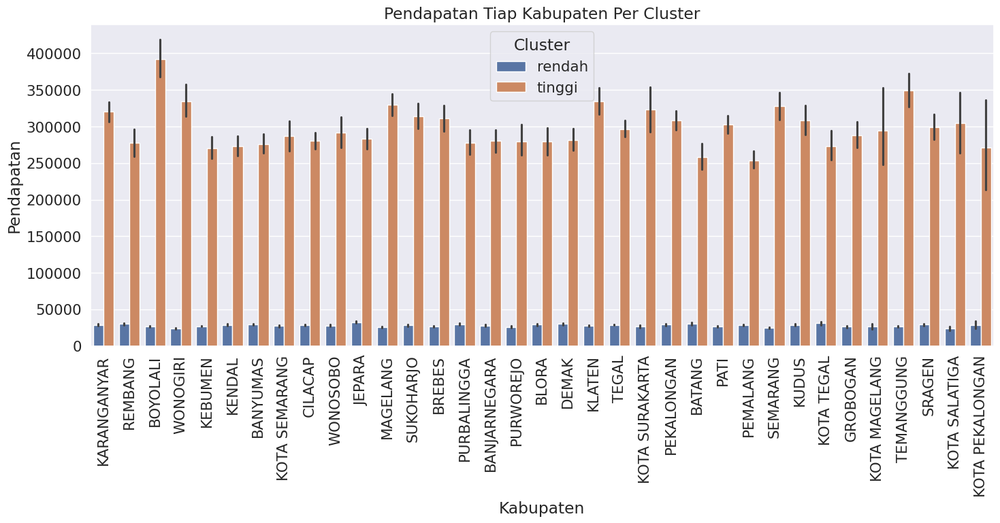

In [ ]:
plt.figure(figsize = (15, 8))
sns.barplot(x = 'nama_kabupaten', y = 'pengeluaran_bersih', hue = 'Kategori', data = sample_jateng)
plt.xticks(rotation = 90)
plt.title('Pendapatan Tiap Kabupaten Per Cluster')
plt.xlabel('Kabupaten')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Kalimantan Selatan

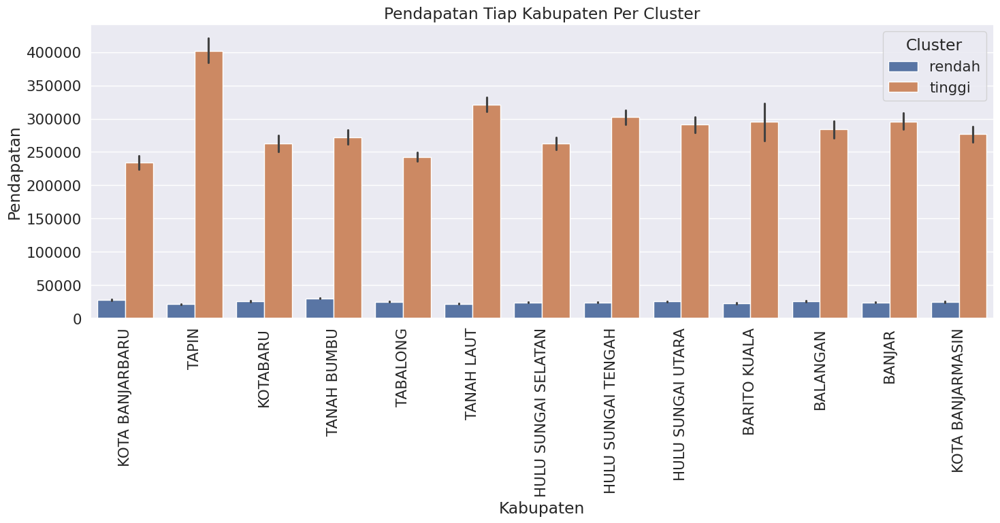

In [ ]:
plt.figure(figsize = (15, 8))
sns.barplot(x = 'nama_kabupaten', y = 'pengeluaran_bersih', hue = 'Kategori', data = sample_kalsel)
plt.xticks(rotation = 90)
plt.title('Pendapatan Tiap Kabupaten Per Cluster')
plt.xlabel('Kabupaten')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Kalimantan Tengah

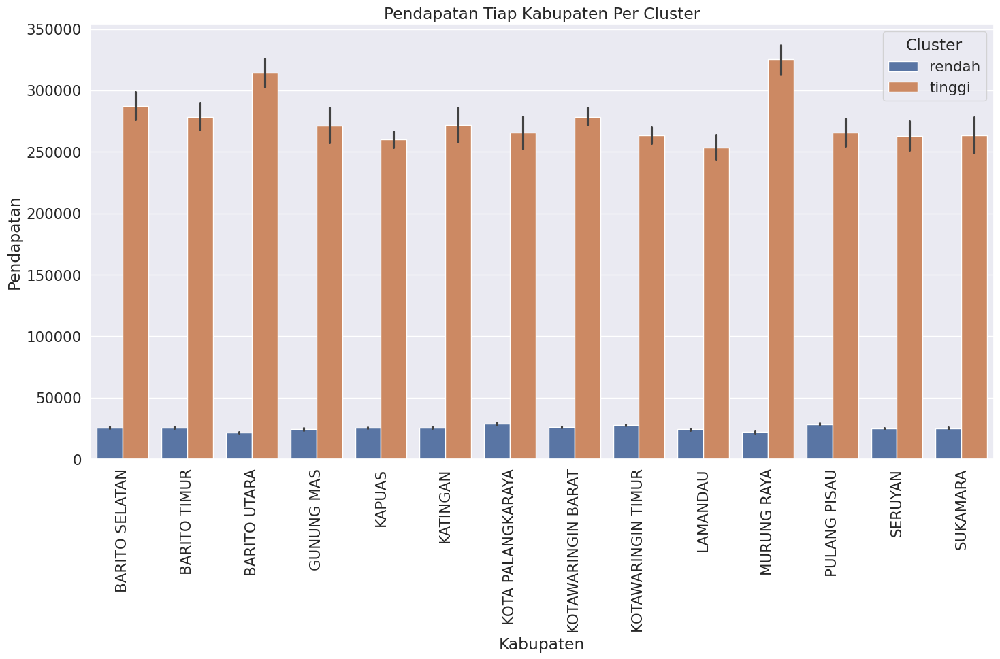

In [ ]:
plt.figure(figsize = (15, 10))
sns.barplot(x = 'nama_kabupaten', y = 'pengeluaran_bersih', hue = 'Kategori', data = data_kalteng)
plt.xticks(rotation = 90)
plt.title('Pendapatan Tiap Kabupaten Per Cluster')
plt.xlabel('Kabupaten')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Papua Selatan

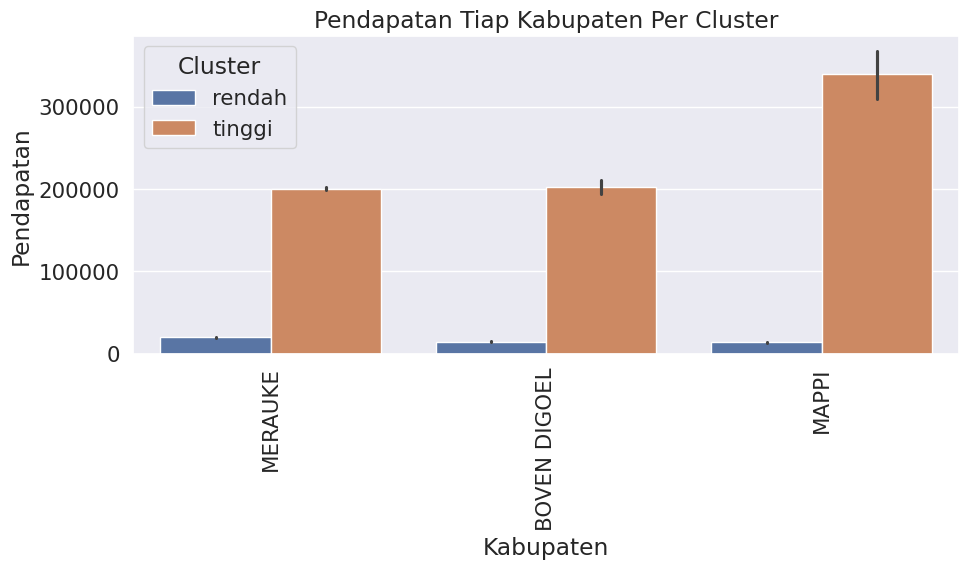

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(x = 'nama_kabupaten', y = 'pengeluaran_bersih', hue = 'Kategori', data = sample_papua)
plt.xticks(rotation = 90)
plt.title('Pendapatan Tiap Kabupaten Per Cluster')
plt.xlabel('Kabupaten')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

## Income dari tiap kecamatan per cluster

### Jawa Tengah

In [ ]:
sample_jateng['nama_kecamatan'].value_counts()

nama_kecamatan
KARANGANYAR           1029
PETARUKAN              842
MAJENANG               828
KALIWUNGU              770
NGALIYAN               699
                      ... 
JENAR                   27
GAJAHMUNGKUR            25
PEKALONGAN SELATAN      18
TUGU                    16
KARIMUNJAWA              7
Name: count, Length: 553, dtype: int64

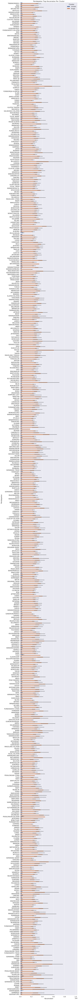

In [ ]:
plt.figure(figsize = (12, 150))
sns.barplot(x = 'pengeluaran_bersih', y = 'nama_kecamatan', hue = 'Kategori', data = sample_jateng)
plt.xticks(rotation = 0)
plt.title('Pendapatan Tiap Kecamatan Per Cluster')
plt.xlabel('Kecamatan')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Kalimantan Selatan

In [ ]:
sample_kalsel['nama_kecamatan'].value_counts()

nama_kecamatan
MURUNG PUDAK            4243
LIANG ANGGANG           3820
DAHA SELATAN            3419
PELAIHARI               3314
BANJARMASIN TIMUR       2616
                        ... 
CERBON                    40
SUNGAI DURIAN             34
CINTAPURI DARUSSALAM      34
PULAU LAUT KEPULAUAN      29
TAMBAN                    22
Name: count, Length: 147, dtype: int64

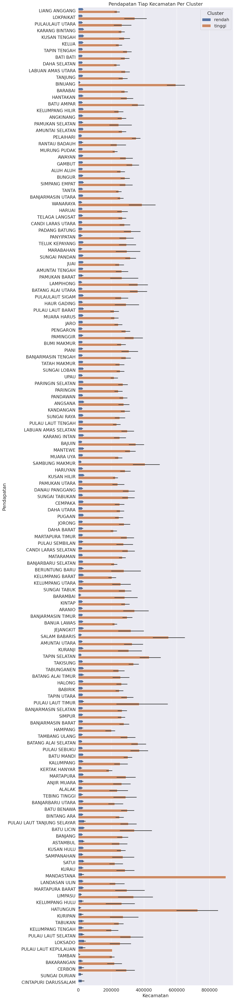

In [ ]:
plt.figure(figsize = (12, 50))
sns.barplot(x = 'pengeluaran_bersih', y = 'nama_kecamatan', hue = 'Kategori', data = sample_kalsel)
plt.xticks(rotation = 0)
plt.title('Pendapatan Tiap Kecamatan Per Cluster')
plt.xlabel('Kecamatan')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Kalimantan Tengah

In [ ]:
data_kalteng['nama_kecamatan'].value_counts()

nama_kecamatan
ARUT SELATAN     7268
BAAMANG          5501
DUSUN SELATAN    3835
BATAGUH          3706
MURUNG           3396
                 ... 
TIMPAH             51
DAMANG BATU        36
PETAK MALAI        34
SULING TAMBUN      33
SEPANG             32
Name: count, Length: 133, dtype: int64

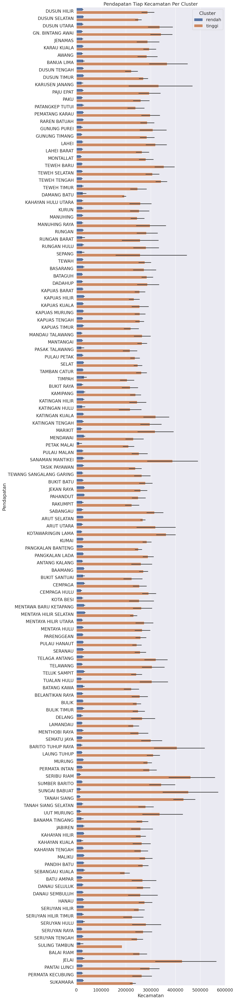

In [ ]:
plt.figure(figsize = (12, 50))
sns.barplot(x = 'pengeluaran_bersih', y = 'nama_kecamatan', hue = 'Kategori', data = data_kalteng)
plt.xticks(rotation = 0)
plt.title('Pendapatan Tiap Kecamatan Per Cluster')
plt.xlabel('Kecamatan')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

### Papua Selatan

In [ ]:
sample_papua['nama_kecamatan'].value_counts()

nama_kecamatan
TANAH MIRING    54286
MERAUKE         45580
SEMANGGA        12430
WAROPKO          8240
NAUKENJERAI      6369
HAJU             3668
JAGEBOB          2659
KURIK            1384
Name: count, dtype: int64

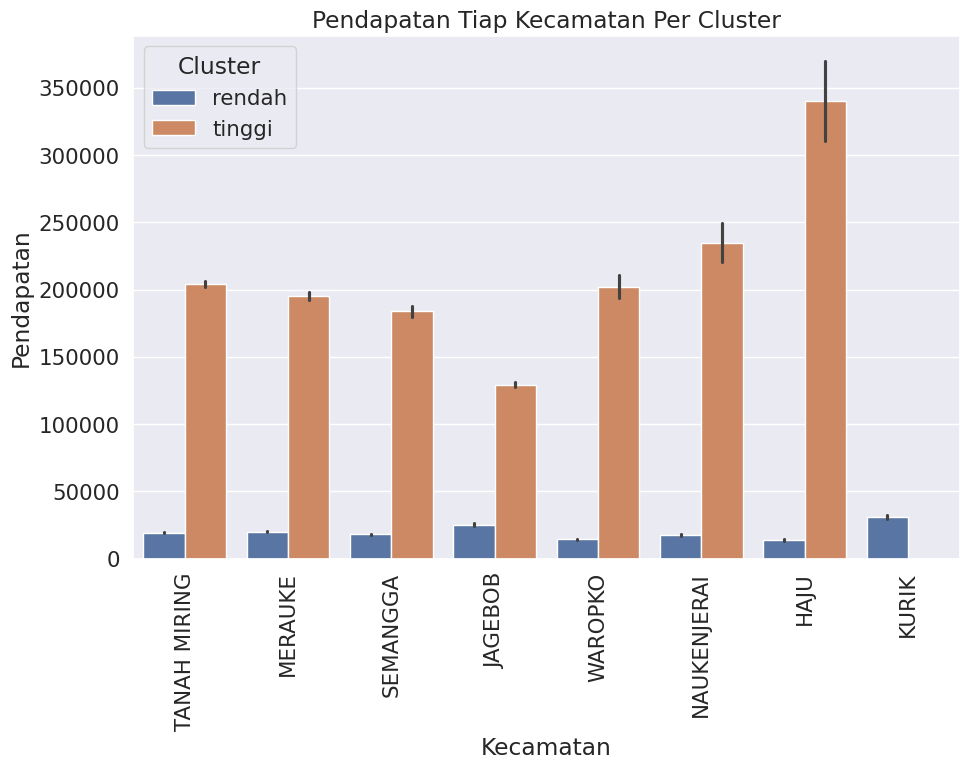

In [ ]:
plt.figure(figsize = (10, 8))
sns.barplot(x = 'nama_kecamatan', y = 'pengeluaran_bersih', hue = 'Kategori', data = sample_papua)
plt.xticks(rotation = 90)
plt.title('Pendapatan Tiap Kecamatan Per Cluster')
plt.xlabel('Kecamatan')
plt.ylabel('Pendapatan')
plt.legend(title = 'Cluster')
plt.tight_layout()
plt.show()

## Distribusi produk setiap bulannya

### Jawa Tengah

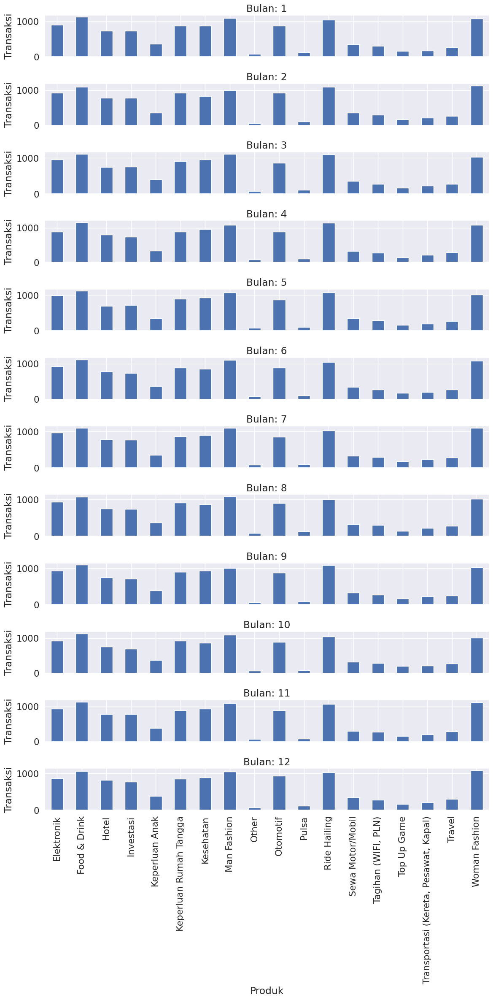

In [ ]:
# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
  # Filter data untuk bulan tertentu
  monthly_data_df1 = sample_jateng[sample_jateng.index.month == i + 1]

  # Group data berdasarkan produk lalu hitung jumlah transaksi
  product_transaction_counts_df1 = monthly_data_df1.groupby('product_name').size()

  # Buat bar plot
  product_transaction_counts_df1.plot(kind = 'bar', ax = ax)

  # Tambahkan nilai pada tiap bar
  #for j, value in enumerate(product_transaction_counts):
    #ax.annotate(str(value), xy = (j, value), ha = 'center', va = 'bottom')

  # Set judul untuk subplot
  ax.set_title(f'Bulan: {i + 1}')
  ax.set_ylabel('Transaksi')

# Pengaturan tata letak dan label
plt.tight_layout()
plt.xlabel('Produk')
plt.show()

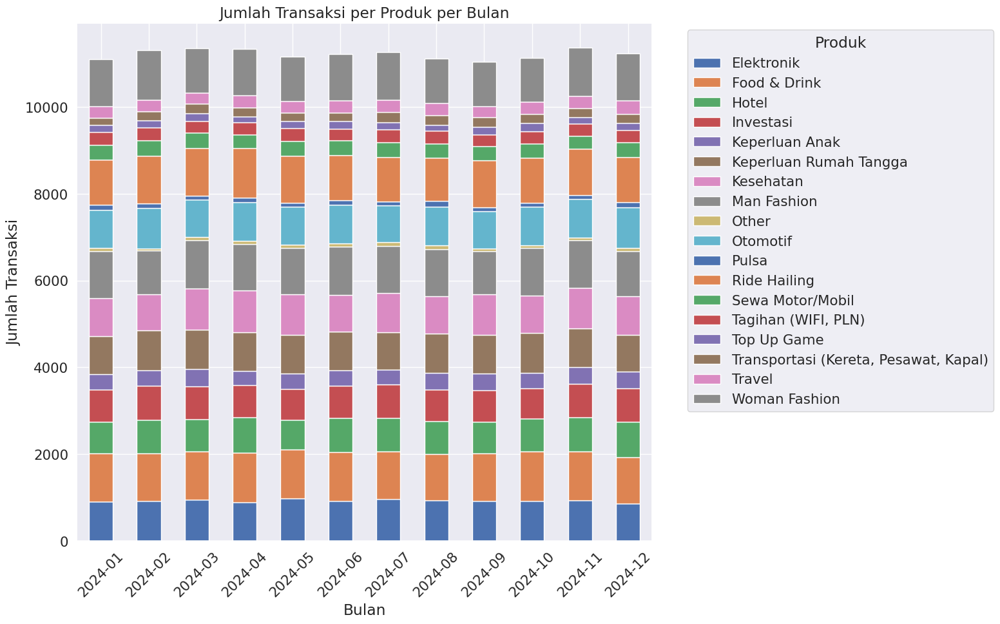

In [ ]:
# Mengelompokkan data berdasarkan bulan dan produk lalu menghitung jumlah transaksi
monthly_transactions_df1 = sample_jateng.groupby([sample_jateng.index.to_period('M'), 'product_name']).size().unstack(fill_value=0)

# Plotting
fig, ax = plt.subplots(figsize=(16, 10))

monthly_transactions_df1.plot(kind = 'bar', stacked = True, ax = ax)

ax.set_xlabel('Bulan')
ax.set_ylabel('Jumlah Transaksi')
ax.set_title('Jumlah Transaksi per Produk per Bulan')
ax.legend(title = 'Produk', bbox_to_anchor = (1.05, 1), loc = 'upper left')

plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Kalimantan Selatan

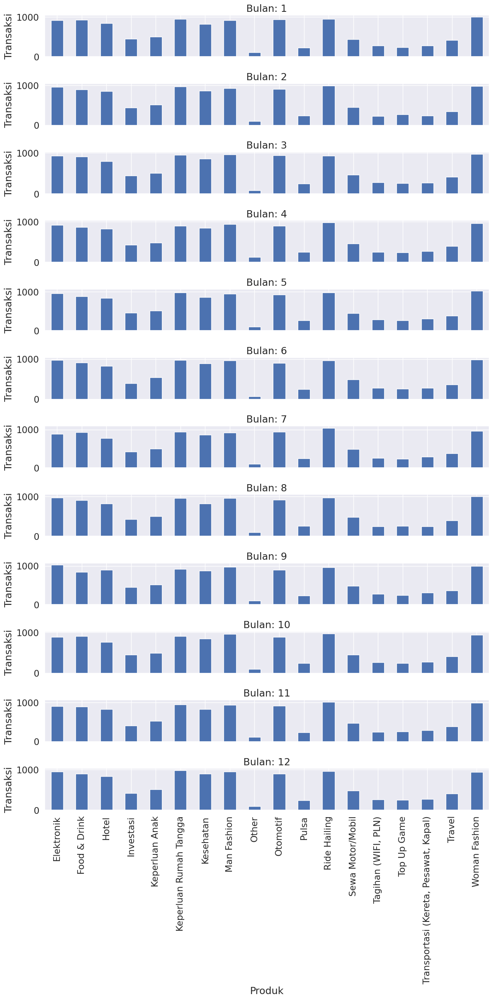

In [ ]:
# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
  # Filter data untuk bulan tertentu
  monthly_data_df2 = sample_kalsel[sample_kalsel.index.month == i + 1]

  # Group data berdasarkan produk lalu hitung jumlah transaksi
  product_transaction_counts_df2 = monthly_data_df2.groupby('product_name').size()

  # Buat bar plot
  product_transaction_counts_df2.plot(kind = 'bar', ax = ax)

  # Tambahkan nilai pada tiap bar
  #for j, value in enumerate(product_transaction_counts):
    #ax.annotate(str(value), xy = (j, value), ha = 'center', va = 'bottom')

  # Set judul untuk subplot
  ax.set_title(f'Bulan: {i + 1}')
  ax.set_ylabel('Transaksi')

# Pengaturan tata letak dan label
plt.tight_layout()
plt.xlabel('Produk')
plt.show()

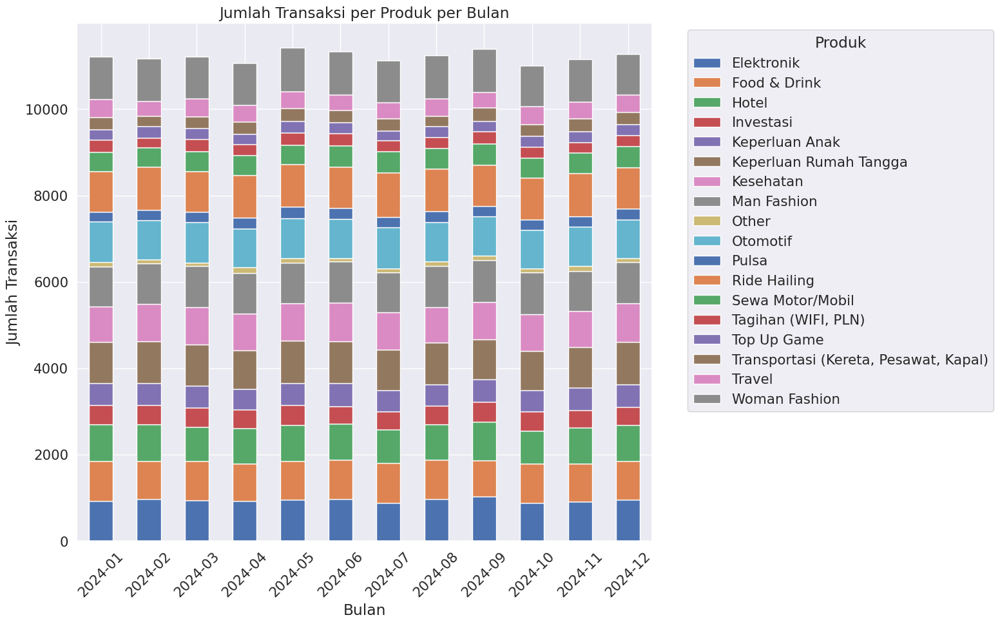

In [ ]:
# Mengelompokkan data berdasarkan bulan dan produk lalu menghitung jumlah transaksi
monthly_transactions_df2 = sample_kalsel.groupby([sample_kalsel.index.to_period('M'), 'product_name']).size().unstack(fill_value=0)

# Plotting
fig, ax = plt.subplots(figsize=(16, 10))

monthly_transactions_df2.plot(kind = 'bar', stacked = True, ax = ax)

ax.set_xlabel('Bulan')
ax.set_ylabel('Jumlah Transaksi')
ax.set_title('Jumlah Transaksi per Produk per Bulan')
ax.legend(title = 'Produk', bbox_to_anchor = (1.05, 1), loc = 'upper left')

plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Kalimantan Tengah

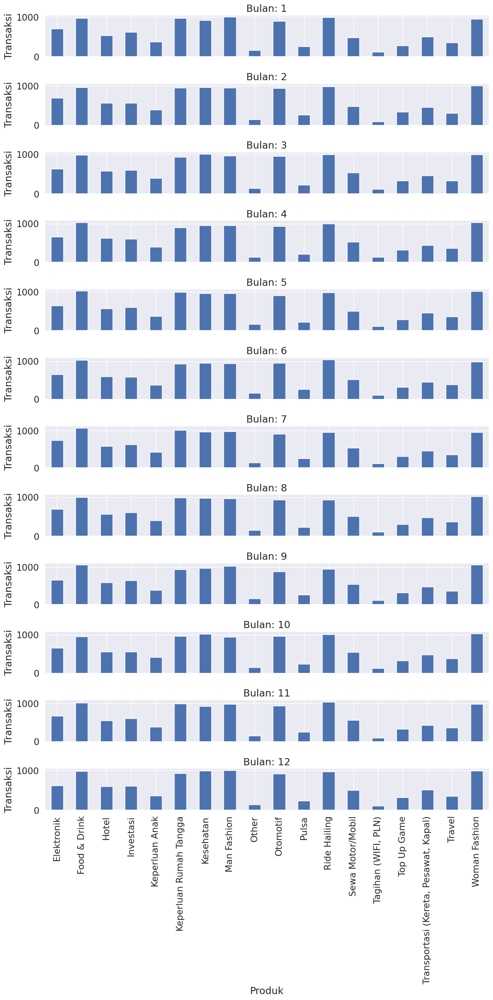

In [ ]:
# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
  # Filter data untuk bulan tertentu
  monthly_data_df3 = data_kalteng[data_kalteng.index.month == i + 1]

  # Group data berdasarkan produk lalu hitung jumlah transaksi
  product_transaction_counts_df3 = monthly_data_df3.groupby('product_name').size()

  # Buat bar plot
  product_transaction_counts_df3.plot(kind = 'bar', ax = ax)

  # Tambahkan nilai pada tiap bar
  #for j, value in enumerate(product_transaction_counts):
    #ax.annotate(str(value), xy = (j, value), ha = 'center', va = 'bottom')

  # Set judul untuk subplot
  ax.set_title(f'Bulan: {i + 1}')
  ax.set_ylabel('Transaksi')

# Pengaturan tata letak dan label
plt.tight_layout()
plt.xlabel('Produk')
plt.show()

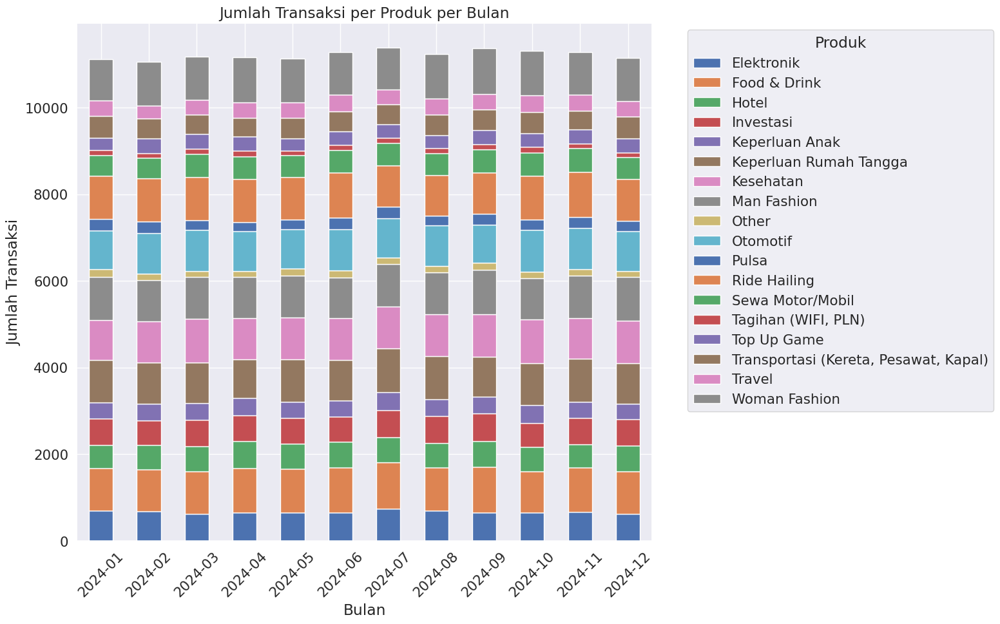

In [ ]:
# Mengelompokkan data berdasarkan bulan dan produk lalu menghitung jumlah transaksi
monthly_transactions_df3 = data_kalteng.groupby([data_kalteng.index.to_period('M'), 'product_name']).size().unstack(fill_value=0)

# Plotting
fig, ax = plt.subplots(figsize=(16, 10))

monthly_transactions_df3.plot(kind = 'bar', stacked = True, ax = ax)

ax.set_xlabel('Bulan')
ax.set_ylabel('Jumlah Transaksi')
ax.set_title('Jumlah Transaksi per Produk per Bulan')
ax.legend(title = 'Produk', bbox_to_anchor = (1.05, 1), loc = 'upper left')

plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Papua Selatan

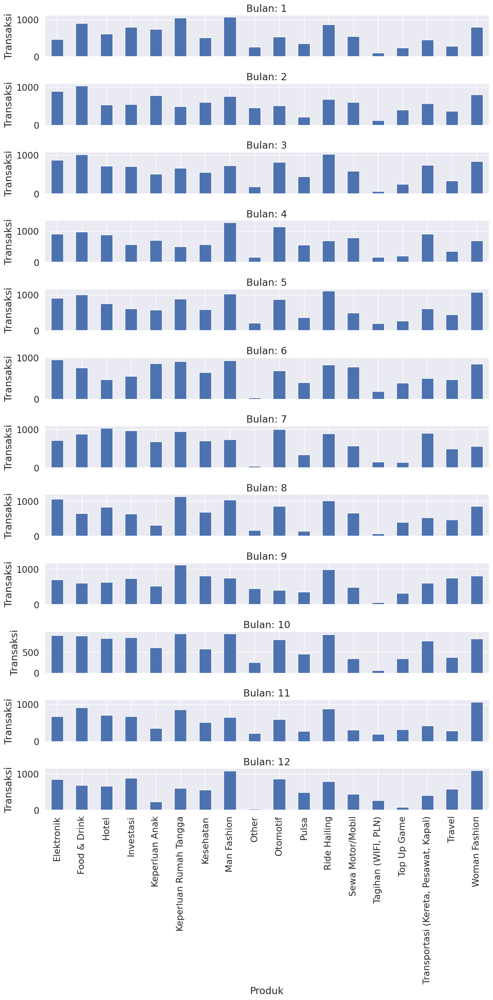

In [ ]:
# Membuat subplot untuk setiap bulan
fig, axes = plt.subplots(12, 1, figsize = (12, 24), sharex = True)

# Loop melalui setiap bulan dan membuat plot
for i, ax in enumerate(axes):
  # Filter data untuk bulan tertentu
  monthly_data_df4 = sample_papua[sample_papua.index.month == i + 1]

  # Group data berdasarkan produk lalu hitung jumlah transaksi
  product_transaction_counts_df4 = monthly_data_df4.groupby('product_name').size()

  # Buat bar plot
  product_transaction_counts_df4.plot(kind = 'bar', ax = ax)

  # Tambahkan nilai pada tiap bar
  #for j, value in enumerate(product_transaction_counts):
    #ax.annotate(str(value), xy = (j, value), ha = 'center', va = 'bottom')

  # Set judul untuk subplot
  ax.set_title(f'Bulan: {i + 1}')
  ax.set_ylabel('Transaksi')

# Pengaturan tata letak dan label
plt.tight_layout()
plt.xlabel('Produk')
plt.show()

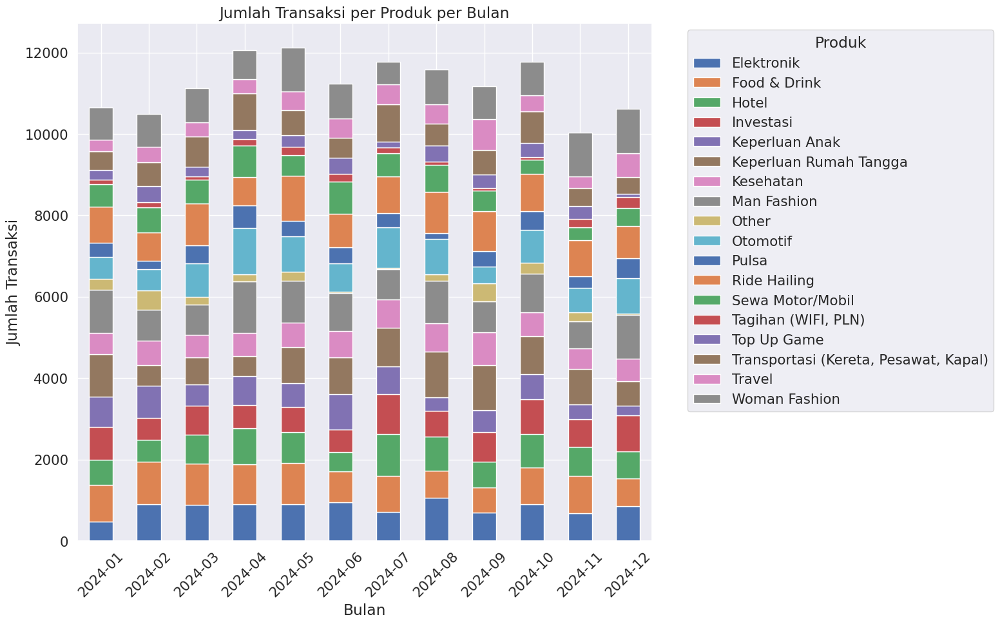

In [ ]:
# Mengelompokkan data berdasarkan bulan dan produk lalu menghitung jumlah transaksi
monthly_transactions_df4 = sample_papua.groupby([sample_papua.index.to_period('M'), 'product_name']).size().unstack(fill_value=0)

# Plotting
fig, ax = plt.subplots(figsize=(16, 10))

monthly_transactions_df4.plot(kind = 'bar', stacked = True, ax = ax)

ax.set_xlabel('Bulan')
ax.set_ylabel('Jumlah Transaksi')
ax.set_title('Jumlah Transaksi per Produk per Bulan')
ax.legend(title = 'Produk', bbox_to_anchor = (1.05, 1), loc = 'upper left')

plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

# Business Recommendation

Nah dari sini, kita kumpulkan hasil interpretasi tadi, menjadi insight yang dapat memberikan informasi pendukung dalam menentukan business recommendation sehingga dapat mengoptimalkan bisnis, dengan adanya pilihan keputusan yang tepat sasaran sesuai dengan kondisi dan karateristik customer berdasarkan wilayah regionalnya

## Jawa Tengah

Melalui EDA after cluster di atas, dapat diambil beberapa rekomendasi yang bisa dilakukan di Provinsi Jawa Tengah, yaitu :     

1.) Maintenance stock terhadap produk yang memiliki traffic tinggi seperti Food & Drink, Man Fashion, dan Woman Fashion

2.) Meningkatkan promosi terutama pada kategori produk dengan income terendah, yaitu pulsa


3.) Pemberian privilege khusus pada customer sesuai dengan tingkatan daya beli pada analisis RFM, seperti pemberian diskon, cashback, dan special offer untuk pembelian grosir


4.) Memperhatikan traffic pembelian terutama di bulan yang memiliki peningkatan, yaitu bulan Maret, April, dan November

## Kalimatan Selatan

Melalui EDA after cluster di atas, dapat diambil beberapa rekomendasi yang bisa dilakukan di Provinsi Kalimantan Selatan, yaitu :     

1.) Maintenance stock terhadap produk yang memiliki traffic tinggi seperti Woman Fashion, Ride Hailing, dan Keperluan Rumah Tangga

2.) Meningkatkan promosi terutama pada kategori produk dengan income terendah, yaitu pulsa


3.) Pemberian privilege khusus pada customer sesuai dengan tingkatan daya beli pada analisis RFM, seperti pemberian diskon, cashback, dan special offer untuk pembelian grosir


4.) Memperhatikan traffic pembelian terutama di bulan yang memiliki peningkatan, yaitu bulan Mei, Juni, dan September

## Kalimantan Tengah

Melalui EDA after cluster di atas, dapat diambil beberapa rekomendasi yang bisa dilakukan di Provinsi Kalimantan Tengah, yaitu :     

1.) Maintenance stock terhadap produk yang memiliki traffic tinggi seperti Woman Fashion, Ride Hailing, dan Keperluan Rumah Tangga

2.) Meningkatkan promosi terutama pada kategori produk dengan income terendah, yaitu Tagihan Wifi dan PLN


3.) Pemberian privilege khusus pada customer sesuai dengan tingkatan daya beli pada analisis RFM, seperti pemberian diskon, cashback, dan special offer untuk pembelian grosir


4.) Memperhatikan traffic pembelian terutama di bulan yang memiliki peningkatan, yaitu bulan Maret, April, dan November

## Papua Selatan

Melalui EDA after cluster di atas, dapat diambil beberapa rekomendasi yang bisa dilakukan di Provinsi Papua Selatan, yaitu :     

1.) Maintenance stock terhadap produk yang memiliki traffic tinggi seperti Food & Drink, Man Fashion, dan Ride Hailing

2.) Meningkatkan promosi terutama pada kategori produk dengan income terendah, yaitu Tagihan Wifi dan PLN


3.) Pemberian privilege khusus pada customer sesuai dengan tingkatan daya beli pada analisis RFM, seperti pemberian diskon, cashback, dan special offer untuk pembelian grosir


4.) Memperhatikan traffic pembelian terutama di bulan yang memiliki peningkatan, yaitu bulan April, Mei, dan Oktober

# Features Importances

In [ ]:
# Untuk melihat fitur apa yang paling berpengaruh dalam model clustering
# berdasarkan dari dataset yang digunakan dalam baseline model

# Hitung varians dari centroid
centroids = modelKM4.cluster_centers_
variance = np.var(centroids, axis=0)

In [ ]:
centroids

array([[3.43822445e+01, 8.70445685e+00, 5.70154719e-01, 1.92659422e+04,
        2.22624390e+01],
       [3.56360375e+01, 5.69245821e+00, 5.15532002e-01, 2.05912735e+05,
        3.86043173e+00]])

In [ ]:
# Urutkan fitur berdasarkan varians dan cetak hasilnya
feature_importances = np.argsort(variance)[::-1]
print('Feature importances based on centroid variance:')
for rank, index in enumerate(feature_importances):
    print(f'Rank {rank+1}: Feature {index} with variance {variance[index]}')


Feature importances based on centroid variance:
Rank 1: Feature 3 with variance 8709256350.897215
Rank 2: Feature 4 with variance 84.65846746666232
Rank 3: Feature 1 with variance 2.268033944497917
Rank 4: Feature 0 with variance 0.39299920861069565
Rank 5: Feature 2 with variance 0.0007459103077631197


In [ ]:
df4.head()

,age,product_id,gender_encoded,pengeluaran_bersih,burn_rate,Cluster_KM,Kategori
2339914,34,4,0,1200.0,93.063584,0,rendah
2340247,48,10,0,3700.0,0.000000,0,rendah
2337600,30,5,1,87400.0,0.000000,0,rendah
2338034,49,10,0,3900.0,0.000000,0,rendah
2337870,53,17,1,23100.0,23.000000,0,rendah


* Ini artinya feature 3 dari dataset dalam model sangat berpengaruh pada pembentukan cluster. sehingga merupakan indikator kuat yang membedakan antar kelompok. features 3 yang dimaksud adalah "Pengeluaran Bersih"

* Feature 4 yakni "burn rate" memiliki varians yang lebih rendah dibandingkan dengan Feature 3, tetapi masih cukup signifikan. Ini menunjukkan bahwa Feature 4 juga memainkan peran penting dalam pembentukan cluster, meskipun tidak sekuat Feature 3.


# Hyperparameter Tuning

## Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Tentukan parameter grid
param_dist = {'n_clusters': range(2, 11), 'init': ['k-means++',
'random']}

# Inisialisasi RandomizedSearchCV
random_search = RandomizedSearchCV(modelKM, param_dist, cv=5,
scoring='adjusted_rand_score', n_iter=10, random_state=0)
# Fit model dan cari hyperparameter optimal
random_search.fit(df1)
# Print hyperparameter terbaik
print('Best parameters: ', random_search.best_params_)


Best parameters:  {'n_clusters': 3, 'init': 'k-means++'}


## GridSearch

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans
# Tentukan parameter grid
param_grid = {'n_clusters': range(2, 11), 'init': ['k-means++', 'random']}
# Inisialisasi model
kmeans = KMeans(random_state=0)
# Inisialisasi GridSearchCV
grid_search = GridSearchCV(kmeans, param_grid, cv=5,
scoring='adjusted_rand_score')
# Fit model dan cari hyperparameter optimal
grid_search.fit(df1)
# Print hyperparameter terbaik
print('Best parameters: ', grid_search.best_params_)

Kami mengambil pilihan untuk best parameter dari interpretasi hasil GridSearch